# Notebook for running ANN on London (LCL) data     
###  + all comparison of CER V LCL, different configurations of MLR and ANN models etc     
### This is the main notebook for all final analysis of results

 

In [321]:
# import  module containing all functions written for MSc project
import mscprojectcoding.FM_MScProject_LoadForecasting_Module as FMmodule


In [322]:
# force reimport of module after edits/updates to functions in PyCharm 
import importlib
importlib.reload(FMmodule)

<module 'mscprojectcoding.FM_MScProject_LoadForecasting_Module' from 'c:\\users\\fmurphy\\onedrive - loughborough university\\fm-project\\mscprojectcoding\\src\\mscprojectcoding\\FM_MScProject_LoadForecasting_Module.py'>

In [323]:
# import ALL functions 
# updated 7/Sep - now imports EVERY function in module here - regardless if used in this notebook or not..

from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  annPlot                              # plots ANN model forecast for specified windows 
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  annPlotInputs                        # shift train&test forecasts to align with hr/day indices ie unpack into actual time bands - similar to shiftInputs but returns dictionary of np arrays for test AND train wondows
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  boxplotLoad                          # box plot of load distribution by hour of day etc
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  create_MLP                           # create MLP for ANN
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  create_save_folder                   # create folder name for saving results
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  create_TrainPredict_df               # split Train and Test data into dfs for ANN - standard version
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  create_TrainPredict_df_V2            # split Train and Test data into dfs for ANN - version with day of week classifier scaling
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  create_TrainPredictSeries            # split Train and Test numpy arrays for MLR 
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  cv_calc                              # Error calculation - coeff of variance error
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  diff_datetime                        # Function to calculate time difference between two datetime objects.
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  findkeys                             # get all keys and subkeys of nested dictionary 
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  flip_dictionary                      # invert dictionary nest levels for plotting results (MLR and/or ANN)
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  fullprint                            # change num lines to print of a numpy array without changing default
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  get_data_range                       # get range of data for each groupby block
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  get_error_percentiles                # get specified percentiles from error dictionary (MLR, ANN)
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  get_errorDictionary                  # load error dictionary from disk given path name
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  get_errors                           # compute errors for supplied models, hardwired for MAPE,MAE,CV,RMSE,NRMSE errors
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  get_limits                           # get x,y limits for plot axis
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  get_MLRerrorDictionary               #  get MLR error dictionaries from specified folder
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  get_NaN_stats                        # get stats for NaNs in each column
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  get_NPminmax_values                  # get max value in each col OR full np array
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  get_save_folderName                  # generate folder name for saving results files
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  get_TrainTestSeries                  # for ANN inputs ?
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  get_uniques                          # get unique values from dataframe columns or pd.series?
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  getForecastByGrp                     # get forecast for given ggregation grp
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  getForecastByGrpName                 # simplified version of getForecastByGrp - this one gets a specific forecast for a supplied grp name instead of random set of grps
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  getLoadByGrp                         # function to get agg load and errors by (aggregation) group
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  getRowN_of_uID                       # search to find ordinal row number of data series for specified uID(s)
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  getTrainTestSeriesNames              # generate list of train, test series names from eg loadSeries, envSeries dictionaries
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  historyPlot                          # plots loss function from ANN MLP history object
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  lrmodel_r2                           # Function to calculate linear regression and R2
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  mae_calc                             # Error calculation - mean avg error
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  mape_calc                            # Error calculation - Mean avg percentage error
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  merge_TrainTestErrors                # merge ANN error dictionaries from TRAIN and TEST windows
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  mlr_predict                          # returns forecast given MLR regression model
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  mlr_train                            # returns MLR regression model 
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  nrmse_calc                           # Error calculation - normalised root mean square error
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  nrmse_calcV2                         # FUNCTION TO CALULATE range normalised  RMSE using method of Humeau et al 2013 (normalize using L2 norm of series)
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  peristModelPlot                      # plot persistence model series
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  persistDataArrayVersion2             # Splice out a) xs series b) ys series from load data series  and create 2-row output numpy array for input to persistance model plot function
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  persistDataWindowed                  # generates persistence models with variable window size search
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  persistScatterPlot                   # plot peristance models 
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  piecewise_linear                     # comput piecewise linear function given slopes, intercept etc
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  plot_allFeatures                     # plot selected columns of numpy array 
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  plot_errors                          # plot avg errors from errors dictionary (eg for all MLR models)
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  plot_forecast                        # plot forecast for specified tiime periods (MLR only?)
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  plot_percentileTraces                # plot percentile traces extracted from percentile dictionaries created from e.g. ANN and MLR errro dictionaries
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  PlotLoadByDaysOfWeek                 #  plot load (eg aggregate) np array by weekday/sat/sun and hr of day
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  plotSectionOfLoadProf                # plot window of load profile given start index, smpls per day, number of days etc
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  pltDefaults                          # set rc params (matplotlib) plot defaults
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  populate_AllFeatures                 # populate numpy array for MLR 
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  r2_get                               # persistence model r2 calculations
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  r2_histogram                         # plotting of r2 histogram for variable window search persistence model 
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  r2_histogramV2                       # similar but tailored for publication plots (most series greyed out)
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  r2RegPlot                            # Function to CALC and ADD R2 regression LINE to existing subplot (axes) object
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  randomUserGroupAggregate             # form group aggregate load df for random userD grps created by randomUserGroups
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  randomUserGroups                     # form random userID clusters of size N  
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  removeNestings                       # flatten a dictionary
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  rmse_calc                            # Error calculation - root mean sq error
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  round_down                           # round a number down to nearest decade (0.1,1,10,100 etc) 
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  round_up                             # round a number up to nearest decade (0.1,1,10,100 etc)
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  saveAnnConfigXresults                # define function to save all ANN results (dictionaries, etc)  to disk
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  saveMLRconfigXresults                 # define function to save all MLR results  (dictionaries, etc)  to disk
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  sbn_ErrorsAllModels                  # boxplot of all model error distribution by aggregation level
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  sbn_plotErrors                       # plot MLR,ANN model errors as boxplot, swarm plot - V1 : plot for various error types - ordered by error type , not model type
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  sbn_plotErrors_V2                    # plot MLR,ANN model errors as boxplot, swarm plot - V2 : Version 2 :plots one error type with subplot for each model
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  set_dowSeries                        # set day of week classifier channels given a dayOfWeek classifier list
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  set_envSeries                        # set environment series to be used in MLR and/or ANN 
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  set_loadSeries                       # select which load series to use in MLR and/or ANN 
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  setColMap                            # set color map from colmap name and value range
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  shiftInputs                          # shift models/forecast series to align with hr/day indices of load ie unpack into actual time bands
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  show_mem_usage                       # shows total memory usage
from mscprojectcoding.FM_MScProject_LoadForecasting_Module import  stackplot_of_forecast                # plots time window of all passed model forecasts,loads - load profiles stacked by calendar day


In [324]:
# get list of all functions in module
#dir(FMmodule)

In [325]:
# import standard packages /modules etc : may not need all these..

import matplotlib.pyplot as plt      # pyplot = collection of command style functions that make matplotlib work like MATLAB, uses numpy arrays internally
import matplotlib.colors as colors2  # module for converting numbers or color arguments to RGB or RGBA
import matplotlib.cm as cmx          # built-in colour maps and utilities; Any colormap can be reversed by appending '_r', so 'RdYlGn_r' is the reversed Red-Yellow-Green colormap
import matplotlib.mlab as mlab       # matlab compatible cmd names
import matplotlib.ticker as mtick    # configurable tick locating and formatting, used by Axis class
import matplotlib.dates as mdates    # useful for getting tick label as siimple dates

import matplotlib.patches as mpatches     # draw geometric shapes 
from matplotlib.patches import Rectangle
import matplotlib.lines as mlines         # 2D lines
import matplotlib.ticker as ticker
from matplotlib.ticker import (MultipleLocator, FixedLocator,IndexLocator,AutoLocator,LogLocator,MaxNLocator,AutoMinorLocator,\
                               FormatStrFormatter,PercentFormatter) # needed for eg integer tick marks etc

import seaborn as sns                  # data visualization library based on matplotlib             

%matplotlib inline

import math                            # module provides access to the mathematical functions defined by the C standard
import csv
import sys
import pandas as pd
import numpy as np
import time                 
import re                              # provides regular expression matching operations 
import random
import os

from six.moves import cPickle as pickle     # cPickle is faster as written in C but merged with Pickle in Python 3.x ..

import numpy.polynomial.polynomial as poly  # polynomial functions incl fitting , etc

from sklearn.cluster import KMeans          # Sklearn = SciPy ML toolkit 
from sklearn import linear_model            # Estimated coefficients for linear regression
#from sklearn.model_selection import train_test_split 
#from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

from scipy.interpolate import interp1d      # Interpolate a 1-D function.
from scipy.spatial.distance import cdist, pdist       # Pairwise distances between observations in n-dimensional space.
from scipy.spatial.distance import squareform         # Convert a vector-form distance vector to a square-form distance matrix, and vice-versa
from scipy.cluster.hierarchy import dendrogram, linkage   # hierarchical/agglomerative clustering 
from scipy.cluster.hierarchy import fcluster              # Form flat clusters from the hierarchical clustering
from scipy import stats                                   # statistical functions https://docs.scipy.org/doc/scipy/reference/stats.html
from scipy import optimize             # commonly used optimization algorithms eg least squares minimization, curve fitting , etc
from scipy.optimize import curve_fit

import json
from datetime import datetime, timedelta 

from itertools import chain           # for iterating through list (of lists) of dictionaries etc
import itertools
from pathlib import Path              # file/folder paths etc

import requests                              # url requests
from plot_keras_history import plot_history

import importlib

In [445]:
#set matplotlib defaults
#https://matplotlib.org/3.1.1/tutorials/introductory/customizing.html

import matplotlib.style
import matplotlib as mpl
mpl.style.use('classic')

#plt.style.available[:]
#plt.style.use('stylename')
matplotlib.matplotlib_fname()   # find where default rcParams imported from : C:\Users\fmurphy\Miniconda3\envs\fm_ANN\Lib\site-packages\matplotlib\mpl-data\matplotlibrc

#to modify defaults (dynamically - just for this session):
#matplotlib.rc('lines', linewidth=2, color='r')

#sns.set_style("dark")  # make background grey 
sns.set_style("whitegrid")  # white background, greyt grid lines

#matplotlib.rc('lines', linewidth=2, color='r')
# set fontsizes etc for plotting 
plt.rcParams["axes.labelsize"] = 15
plt.rc('legend',fontsize=10) # using a size in points
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10) 

#print(plt.rcParams)

*import libraries for ANN*    

useful resources:    
 https://machinelearningmastery.com/build-multi-layer-perceptron-neural-network-models-keras/
 https://machinelearningmastery.com/how-to-configure-the-number-of-layers-and-nodes-in-a-neural-network/    
 https://www.machinecurve.com/index.php/2019/10/04/about-loss-and-loss-functions/#loss-functions-for-regression       
https://www.tensorflow.org/guide/keras/train_and_evaluate
https://www.jeremyjordan.me/nn-learning-rate/      useful to identify best learning rate    
https://keras.io/api/optimizers/      
https://machinelearningmastery.com/how-to-stop-training-deep-neural-networks-at-the-right-time-using-early-stopping/     
https://machinelearningmastery.com/evaluate-skill-deep-learning-models/
https://towardsdatascience.com/time-series-nested-cross-validation-76adba623eb9

learning rates and momentum : Adam optimizer
https://machinelearningmastery.com/learning-rate-for-deep-learning-neural-networks/
normalization of ANN inputs and outputs https://machinelearningmastery.com/how-to-improve-neural-network-stability-and-modeling-performance-with-data-scaling/


see for tuning epochs and batch size:
https://machinelearningmastery.com/gentle-introduction-mini-batch-gradient-descent-configure-batch-size/

In [327]:
# conda install -n fm_ANN tensorflow  keras (i.e. install into my python3.6 env fm_ANN)

import tensorflow as tf
import keras

from keras.models import Sequential
from keras.layers import Dense, LSTM  #Dropout, Flatten, Conv2D, MaxPPooling2D, etc
from sklearn.preprocessing import MinMaxScaler

from keras.utils.vis_utils import plot_model
import pydot 

#warnings because my numpy is 1.18 (ignore for now as don't want to downgrade to 1.16)

In [446]:
# SET SEABORN DEFAULTS

# https://seaborn.pydata.org/tutorial/aesthetics.html
# https://seaborn.pydata.org/generated/seaborn.set_style.html
# https://matplotlib.org/tutorials/introductory/customizing.html

#sns.set_style() # (style=None, rc=None) Set the aesthetic style of the plots. 
sns.set_style(style="whitegrid",
              rc= 
             {'axes.linewidth': 1, 
               'axes.edgecolor':'black', 
               'xtick.direction': 'out',
               'xtick.major.size': 4.0, 
               'ytick.direction': 'out', 
               'ytick.major.size': 4.0, 
               'axes.facecolor': 'white',
               'grid.color': '.8', 
               'grid.linestyle': u'-', 
               'xtick.minor.size': 3.0, 
               'ytick.minor.size': 3.0, 
               'grid.linewidth': 0.})        
sns.axes_style()                  # returns current settings (default axes styles)

plt.style.use('seaborn')     # switch to seaborn style
# plot code
# ...

plt.style.use('default')     # switches back to default matplotlib style
# plot code
# ...

# to see all available styles
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


In [447]:
# to avoid warning message 
#C:\Users\fmurphy\Miniconda3\lib\site-packages\pandas\plotting\_matplotlib\converter.py:103: FutureWarning: Using an implicitly registered datetime converter
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

In [330]:
# override some default print parameters
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
pd.set_option('display.width', None)
#pd.set_option('display.max_colwidth',-1)

#np.set_printoptions(threshold=np.inf)
np.set_printoptions(threshold=200)
np.set_printoptions(edgeitems=10)


In [331]:
# get hourly load data
hourly_df=pd.read_pickle('../project_data/intermediateDataLCL/LCL_hourly_df.pkl')

In [332]:
# user database cleaning - exclude anomalously low usage users (see LCL3)

cutoff = 1000  # see LCL3 histograms of annual aggregate consumption by user
lowLoadUsers_df = hourly_df.loc[(hourly_df.sum(axis=1).values < cutoff)]  
print("Number of users with annual aggregate usage < ",cutoff," kWh is : ",lowLoadUsers_df.shape[0])

agg_lowLoadUsers = lowLoadUsers_df.sum(axis=0)    # sum each column ie aggregate of all users in input df
uIDsReject = lowLoadUsers_df.index
uIDsAll = hourly_df.index.values   # get all userIDs

uIDs = [x for x in uIDsAll if x not in uIDsReject]
print("# users retained:",len(uIDs))
hourly_df = hourly_df.loc[uIDs]

aggLoad = hourly_df.sum(axis=0)    # sum each column ie aggregate of all users at each time 
aggLoad



Number of users with annual aggregate usage <  1000  kWh is :  11
# users retained: 711


2013-01-01 00:00:00    458.542
2013-01-01 01:00:00    379.255
2013-01-01 02:00:00    295.068
2013-01-01 03:00:00    252.970
2013-01-01 04:00:00    230.669
                        ...   
2013-12-31 19:00:00    637.441
2013-12-31 20:00:00    583.995
2013-12-31 21:00:00    517.485
2013-12-31 22:00:00    479.429
2013-12-31 23:00:00    427.385
Length: 8760, dtype: float64

In [333]:
aggLoadAnnual=aggLoad.sum()
aggLoadAnnual

3038071.8909247005

In [334]:
# get weather and daylight data
hourlyTemp = pd.read_csv('../project_data/intermediateDataLCL/London_Temperature.csv')['temperature']
hourlySunset = pd.read_csv('../project_data/intermediateDataLCL/London_LengthOfDayData.csv')['sunset']
hourlyDayLight = pd.read_csv('../project_data/intermediateDataLCL/London_LengthOfDayData.csv')['dayLight']
hourlyTemp

0       9.57
1       9.38
2       9.18
3       7.88
4       7.38
        ... 
8755    6.67
8756    5.62
8757    5.97
8758    6.67
8759    7.68
Name: temperature, Length: 8760, dtype: float64

In [335]:
# daylight saving start/emd dates - in case wish to exclude from training
# ** NOT for time being **

dst_dates=[pd.date_range('31/3/2013', '27/10/2013', freq='1D')[0],\
    pd.date_range('31/3/2013', '27/10/2013', freq='1D')[-1]]
dst_dates


[Timestamp('2013-03-31 00:00:00', freq='D'),
 Timestamp('2013-10-27 00:00:00', freq='D')]

In [336]:
# set up any inputs may need

months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', \
          'November', 'December']
daynum = [31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]
dayLabels = ['Mon', 'Tue', 'Wed', 'Thu','Fri','Sat','Sun']
indexVals = aggLoad.index    # index = hr in datetime64ns format  (8760 values)

# set date window of interest
start='1/1/2013'
end='1/1/2014'

# create date df from start to end date
colsD = pd.date_range(start, end, freq='1D')[0:-1]  # returns DatetimeIndex
dates = colsD.date # np array

# create hr df from start to end date
colsT = pd.date_range(start, end, freq='1H')[0:-1]  # returns DatetimeIndex
hours = colsT.hour # np array


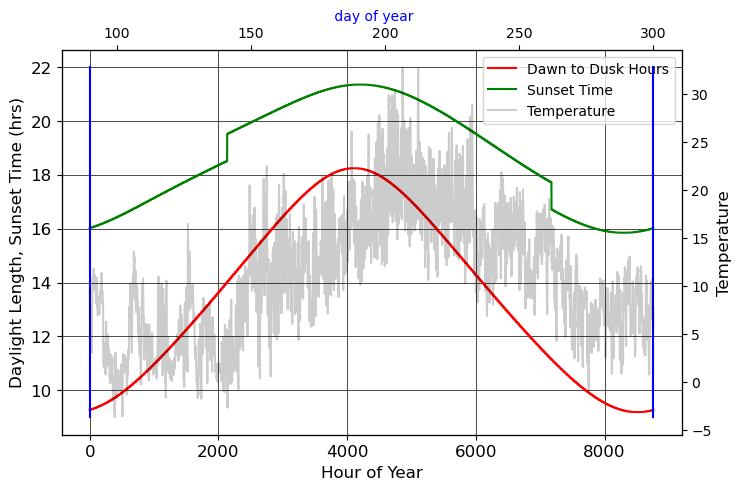

In [337]:
# plot daylight , sunset etc

fig = plt.figure(figsize=(8,5));
ax1 = fig.add_subplot(111)
it1 = ax1.plot(np.arange(len(hours)), hourlyDayLight, color='r',label='Dawn to Dusk Hours') 
it2 = ax1.plot(np.arange(len(hours)), hourlySunset, color='g',label='Sunset Time')

ax1.set_xlabel('Hour of Year', fontsize=12)
ax1.set_ylabel('Daylight Length, Sunset Time (hrs)', fontsize=12)
ax1.tick_params(axis='both', labelsize=12)
ax1.grid(color='k', linestyle='-', linewidth=0.5)


ax2 = ax1.twiny()  # instantiate a second x axes that shares the same y-axis
ax2.set_xlabel(' day of year', color='b')  # we already handled the y-label with ax1
#ax2.plot(np.arange(len(dates)), sunset, color='g')
ax2.plot(2*[dst_dates[0].dayofyear],[9,22],color='b')
ax2.plot(2*[dst_dates[1].dayofyear],[9,22],color='b')
ax2.tick_params(axis='y', labelcolor='b')

ax3 = ax1.twinx()
it3 = ax3.plot(np.arange(len(hours)), hourlyTemp, color='k',label='Temperature',alpha=0.2)
ax3.set_ylabel('Temperature', fontsize=12)


items = it1+it2+it3
labs = [i.get_label() for i in items]
ax1.legend(items, labs, loc=0);

Inputs for ANN            
a) Training and Prediction windows       
b) Hour of Day, Day Of Week etc Classifiers - Probably not needed ??          
c) styles and labels          
d) load and environmental data series           


** Train on 6 week periods and test on following 2 weeks    
 ie periods will start on same day of week   **      

*Must run following group of cells to set key parameters*

In [338]:
# set training and prediction window(s) :  maintain equal lengths for each period..

# preferred configuration: training on 6 periods across full year

nPeriods=6  
nWeeks=8   
trainWeeks=6  
predWeeks=2  

trainConfig = {'nPeriods':nPeriods,'nWeeks':nWeeks,'trainWeeks':trainWeeks,'predWeeks':predWeeks}

In [339]:
# set Classifiers: HourOfDay, DayOfWeek, Seasonality (PeriodOfYear)

#create HoD (Hour Of Day) classifier - see LCL3 script for analysis
nightTime = np.asarray([23,0,1,2,3,4,5,6])   # ie 2300 to 0700
earlyMorn = np.asarray([7,8,9])              # 0700 to 1000
dayTime = np.asarray([10,11,12,13,14,15])    # 1000 to 1600
eveningTime = np.asarray([16,17,18,19,20,21,22,23])   #1600 to 0000   OVERLAPS WITH nightTime
timeLists = [nightTime, earlyMorn, dayTime, eveningTime]   # list of lists

#create DayOfWeek classifier
dayClassifier = [[1,2,3,4],[5,6,0]]

# create PeriodOfYear classifier: h1 and h2 classes for 1st/2md half of year ; see LCL3 script
h1=np.arange(0,sum(daynum[0:6]))
h2=np.arange(sum(daynum[0:6]),sum(daynum[0:12]))


PoYlist=[h1,h2]   # period of year list
#PoYlist


In [340]:
# Set styles and label classes

lineStyles = ['-','-.',':','--']
lineStyles = ['solid', 'dashdot','dotted', 'dashed']
#https://matplotlib.org/3.1.0/gallery/lines_bars_and_markers/linestyles.html


lineColors = ['k','b','g','r','m','c']    
myStyles = {'lineStyles':lineStyles,'lineColors':lineColors}

months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', \
          'September', 'October','November', 'December']
daynum = [31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]
dayLabels = ['Mon', 'Tue', 'Wed', 'Thu','Fri','Sat','Sun']
calVars = {'months':months,'daynum':daynum,'dayLabels':dayLabels}

for key in calVars.keys():
    print(key,'->',calVars[key])

for val in calVars.values():
    print(val)

months -> ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
daynum -> [31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]
dayLabels -> ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
[31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]
['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']


In [341]:
# PREPARE INPUTS 1:  - only need to do once for each trainConfig 

# Set windows and series lengths for each startTrain(i)+168 : end Pred(i))

featureLength,trainLength,predLength = 0,0,0
windows=np.zeros((nPeriods,4),dtype=np.int)  # to store train and predict windows

# loop through all periods, set training and prediction windows in each 
# NB : configured only for EQUAL length of each train+predict combined window 

for i in range(nPeriods):       # e.g. 6 periods of 8 weeks in year
    startTrain = np.int(i*(nWeeks*7)*24)        # start of each period
    endTrain = np.int( ((i*(nWeeks*7)+ (trainWeeks*7))*24))  # end of each training period
    startPred = endTrain
    endPred = np.int((i+1)*(nWeeks*7)*24)
    #print("startTrain:",startTrain,"endTrain:",endTrain,"startPred: ",startPred,"endPred: ",endPred)

    # train features start at startTrain+168 to capture aggLoad(t-168) data from TRAINING window only
    featureLength += (endPred-(startTrain+168))     # combined training+predict features
    trainLength += (endTrain-(startTrain+168))
    predLength += (endPred-startPred)     
 
    windows[i,0]= startTrain; windows[i,1]= endTrain
    windows[i,2]= startPred;  windows[i,3]= endPred
    
print("Totals: featureLength: ",featureLength,"trainLength: ",trainLength,"predLength: ",predLength)


Totals: featureLength:  7056 trainLength:  5040 predLength:  2016


In [342]:
print(windows)   # indices =  hour of year  
print(len(windows)) # number of periods.

[[   0 1008 1008 1344]
 [1344 2352 2352 2688]
 [2688 3696 3696 4032]
 [4032 5040 5040 5376]
 [5376 6384 6384 6720]
 [6720 7728 7728 8064]]
6


Prepare load, classifier and environmental series:

windows = list of start/stop hour of year indices defining each training / prediction window     

In [343]:
# colate environmental series for train and predict windows for each startTrain(i)+168 : end Test(i))
envSeries = set_envSeries(windows,temp=hourlyTemp,dayLight=hourlyDayLight,sunset=hourlySunset)

for k,v in envSeries.items():
    print("env series:{0},length:{1},type:{2},first val:{3}".format(k,len(v),type(v),v[0]))


env series:tempTrain,length:5040,type:<class 'numpy.ndarray'>,first val:9.06
env series:tempTest,length:2016,type:<class 'numpy.ndarray'>,first val:1.36
env series:dayLightTrain,length:5040,type:<class 'numpy.ndarray'>,first val:9.438055555555557
env series:dayLightTest,length:2016,type:<class 'numpy.ndarray'>,first val:11.016388888888885
env series:sunsetTrain,length:5040,type:<class 'numpy.ndarray'>,first val:16.175555555555555
env series:sunsetTest,length:2016,type:<class 'numpy.ndarray'>,first val:17.168055555555554


In [344]:
# Use this IF wish to use MLR-style input numpy array for ANN training 
# 'ALL' arg => collate train+test in one section i.e. DON't SPLIT into train/test series.

#envSeries = set_envSeries(windows,'ALL',temp=hourlyTemp,dayLight=hourlyDayLight,sunset=hourlySunset)

#for k,v in envSeries.items():
#    print("env series:{0},length:{1},type:{2},first val:{3}".format(k,len(v),type(v),v[0]))


In [345]:
# get DayOfWeek classifier  

dowSeries = set_dowSeries(windows,aggLoad,dayClassifier)
dowSeries['dowTrain'].shape
dowSeries['dowTest'].shape

(2016, 2)

# Define load series to use 

In [346]:
# define and print inputs to set_loadSeries function . MUST have 'yData','yDataTrain','yDataTest'
loadSeriesList = ['yData',\
                  'yDataTrain','SN24train','SN25train','SN26train','SN168train',\
                  'yDataTest','SN24test','SN25test','SN26test','SN168test']        # set load series names 
# count number of train (and test) series:
numSeries=0
for series in loadSeriesList:
    if ('train' in series) or ('Train' in series):
        numSeries+=1
print("numSeries:",numSeries)

loadSeriesOffsetsWinStart = [168] + [168]*numSeries + [0]*numSeries  # set offsets from each window start (max time lag=168)
loadSeriesLags = [0]+[0,24,25,26,168]*2                              # set lag terms for each load series (t-lag)
loadSeriesWindows  = np.array([0,3]+[0,1]*numSeries+[2,3]*numSeries).reshape(-1,2)    # set windows for each series range


print("loadSeriesList: {0}".format(loadSeriesList))
print("loadSeriesOffsetsWinStart: {0}".format(loadSeriesOffsetsWinStart))    
print("loadSeriesLagsWinEnd: {0}".format(loadSeriesLags))
print("loadSeriesWindows: \nstart window indices:{0}, \nend window indices:{1}".format\
      (loadSeriesWindows[:,0],loadSeriesWindows[:,1]))


numSeries: 5
loadSeriesList: ['yData', 'yDataTrain', 'SN24train', 'SN25train', 'SN26train', 'SN168train', 'yDataTest', 'SN24test', 'SN25test', 'SN26test', 'SN168test']
loadSeriesOffsetsWinStart: [168, 168, 168, 168, 168, 168, 0, 0, 0, 0, 0]
loadSeriesLagsWinEnd: [0, 0, 24, 25, 26, 168, 0, 24, 25, 26, 168]
loadSeriesWindows: 
start window indices:[0 0 0 0 0 0 2 2 2 2 2], 
end window indices:[3 1 1 1 1 1 3 3 3 3 3]


Funtion *set_loadSeries* returns dictionary of modified load pd.Series      
load = input load series e.g. aggregate load    

In [347]:
# colate load series for train and predict windows

loadSeries = set_loadSeries(windows,aggLoad,loadSeriesList,loadSeriesOffsetsWinStart,loadSeriesLags,\
                   loadSeriesWindows,'print_output')  # return dictionary of all load series 

for k,v in loadSeries.items():
    print("{0} of length {1},{2}".format(k,len(v),type(v)))

series: yData: append input load for windows(0,0)+168-0:windows(0,3)-0
series: yDataTrain: append input load for windows(0,0)+168-0:windows(0,1)-0
series: SN24train: append input load for windows(0,0)+168-24:windows(0,1)-24
series: SN25train: append input load for windows(0,0)+168-25:windows(0,1)-25
series: SN26train: append input load for windows(0,0)+168-26:windows(0,1)-26
series: SN168train: append input load for windows(0,0)+168-168:windows(0,1)-168
series: yDataTest: append input load for windows(0,2)+0-0:windows(0,3)-0
series: SN24test: append input load for windows(0,2)+0-24:windows(0,3)-24
series: SN25test: append input load for windows(0,2)+0-25:windows(0,3)-25
series: SN26test: append input load for windows(0,2)+0-26:windows(0,3)-26
series: SN168test: append input load for windows(0,2)+0-168:windows(0,3)-168
yData of length 7056,<class 'pandas.core.series.Series'>
yDataTrain of length 5040,<class 'pandas.core.series.Series'>
SN24train of length 5040,<class 'pandas.core.series

In [348]:
# check loadSeries values make sense eg. compare lagged values 

for k,v in loadSeries.items():
    if k == 'yData':
        print("{0},{1}\n,{2} \n".format(k,v.head(1),v.tail(1)))
    if k == 'yDataTrain':
        print("{0},{1}\n,{2} \n".format(k,v.head(1),v.tail(1)))
    if k == 'SN24train':
        print("{0},{1}\n,{2} \n".format(k,v.head(1),v.tail(1)))
    if k == 'yDataTest':
        print("{0},{1}\n,{2} \n".format(k,v.head(1),v.tail(1)))
    if k == 'SN24test':
        print("{0},{1}\n,{2} \n".format(k,v.head(1),v.tail(1)))


yData,2013-01-08    399.409999
dtype: float64
,2013-12-02 23:00:00    406.832
dtype: float64 

yDataTrain,2013-01-08    399.409999
dtype: float64
,2013-11-18 23:00:00    386.845
dtype: float64 

SN24train,2013-01-07    407.228
dtype: float64
,2013-11-17 23:00:00    383.497001
dtype: float64 

yDataTest,2013-02-12    443.391001
dtype: float64
,2013-12-02 23:00:00    406.832
dtype: float64 

SN24test,2013-02-11    443.533001
dtype: float64
,2013-12-01 23:00:00    394.479
dtype: float64 



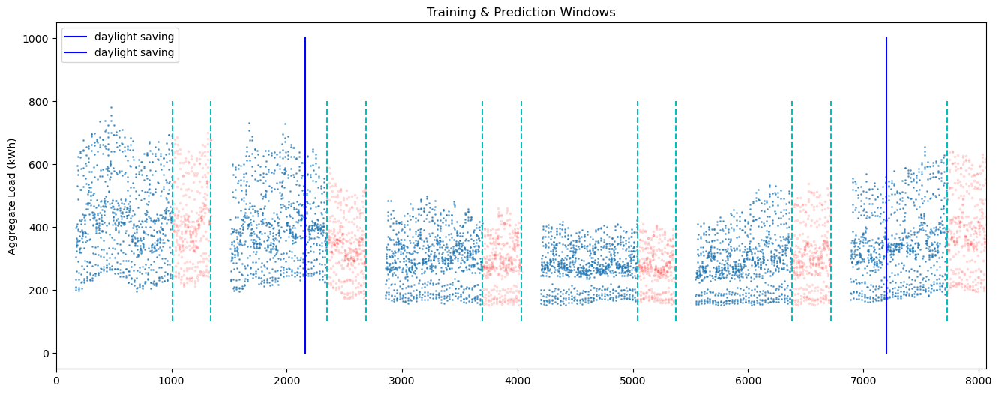

Hour of Year range: 168 8064


In [349]:
# Plot TRAINING and PREDICTION windows with semi-transparent scatter plot of load data

# construct constant series to show ranges of training and prediction windows
df = pd.DataFrame(index=(loadSeries['yDataTrain'].index).union(loadSeries['yDataTest'].index)) 
df['hourOfYear']=((df.index.dayofyear-1)*24)+df.index.hour
df1 = df.loc[loadSeries['yDataTrain'].index, :] 
df1['flg']=1
df1['hourOfYear']=((df1.index.dayofyear-1)*24)+df1.index.hour

df2 = df.loc[loadSeries['yDataTest'].index, :] 
df2['flg']=2
df2['hourOfYear']=((df2.index.dayofyear-1)*24)+df2.index.hour
df = pd.concat([df1,df2])

# plot a) data b)  window ranges
fig = plt.figure(figsize=(16,6))
ax1 = fig.add_subplot(111)

if len(windows)<=1:
    ax1.plot(df1['hourOfYear'],loadSeries['yDataTrain'].values,alpha=0.6)    
    ax1.plot(df2['hourOfYear'],loadSeries['yDataTest'].values,alpha=0.1,color='r') 
else:
    ax1.scatter(df1['hourOfYear'],loadSeries['yDataTrain'].values,s=1,alpha=0.6)
    ax1.scatter(df2['hourOfYear'],loadSeries['yDataTest'].values,alpha=0.1,s=3,color='r')


# add train and predict windows
yLim = get_limits(loadSeries['yData'], decimals=-2)     
for w,win in enumerate(windows):
    ax1.plot(2*[win[0]],[yLim[0],yLim[1]],color='c',linestyle='--')
    ax1.plot(2*[win[1]],[yLim[0],yLim[1]],color='c',linestyle='--')    
    
#add Daylight saving start/end dates
for d,date in enumerate(dst_dates):
    ax1.plot(2*[24*(date.dayofyear)],[0,1000],color='b',label='daylight saving')
    #ax1.plot(2*[24*(date.dayofyear)],[0,1000],color='y',label=legLabels[d])

ax1.set_ylabel('Aggregate Load (kWh)')  
ax1.set_title('Training & Prediction Windows')


ax1.set_xlim(0,df['hourOfYear'].max()+1)
ax1.legend()
plt.show()
del df1,df2

print("Hour of Year range:",df['hourOfYear'].min(),df['hourOfYear'].max()+1)
            
            

    
Note 1-week gap in train data at start each period        


**Training & Prediction Data Setup**

In [350]:
# check data values : envSeries, dowSeries
for k,v in envSeries.items():
    print(k,len(v),v[0:5])
for k,v in dowSeries.items():
    print(k,len(v),v[0:5,:])

tempTrain 5040 [9.06 9.48 9.57 9.57 9.88]
tempTest 2016 [1.36 1.78 1.78 1.11 1.26]
dayLightTrain 5040 [9.43805556 9.43805556 9.43805556 9.43805556 9.43805556]
dayLightTest 2016 [11.01638889 11.01638889 11.01638889 11.01638889 11.01638889]
sunsetTrain 5040 [16.17555556 16.17555556 16.17555556 16.17555556 16.17555556]
sunsetTest 2016 [17.16805556 17.16805556 17.16805556 17.16805556 17.16805556]
dowTrain 5040 [[1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]]
dowTest 2016 [[1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]]


# Note: 
###  Next section runs ANN forecasting for total AGGREGATE load (all users).      
### If wish to run ANN for smaller aggregation levels, jump to : 
        "# ANN for all aggregation levels - Run on COLAB". Requisite inputs for later are already defined above.

# split training and test data : 

 NOTE - After testing on aggregate forecast, concluded that both V1 and V2 give v similar results
 Hence, since V1 is simpler and has less input features, go with this .
 (V2: creates 2 of each load training series for weekdays, weekends respectively - scaled by dow classifier).     

In [351]:
# get keys (series names) from load and env series for train, test datasets 

loadSeriesTrain,loadSeriesTest = getTrainTestSeriesNames(loadSeries)
envSeriesTrain,envSeriesTest  = getTrainTestSeriesNames(envSeries)
print("loadSeriesTrain: ",loadSeriesTrain)
print("loadSeriesTest: ",loadSeriesTest)
print("envSeriesTrain: ",envSeriesTrain)
print("envSeriesTest: ",envSeriesTest)

loadSeriesTrain:  ['yDataTrain', 'SN24train', 'SN25train', 'SN26train', 'SN168train']
loadSeriesTest:  ['yDataTest', 'SN24test', 'SN25test', 'SN26test', 'SN168test']
envSeriesTrain:  ['tempTrain', 'dayLightTrain', 'sunsetTrain']
envSeriesTest:  ['tempTest', 'dayLightTest', 'sunsetTest']


In [352]:
#### IF WANT TO USE V1 (final version)**
df_Train = create_TrainPredict_df(loadSeriesTrain,loadSeries,envSeriesTrain,envSeries,\
                                  ['dowTrain'],dowSeries)

df_Test = create_TrainPredict_df(loadSeriesTest,loadSeries,envSeriesTest,envSeries,\
                                    ['dowTest'],dowSeries)

In [353]:
# if want to use V2 (load series scaled by dow classifiers ie 2 versions of each load series - testing) 
#df_Train = create_TrainPredict_df_V2(loadSeriesTrain,loadSeries,envSeriesTrain,envSeries,\
#                                  ['dowTrain'],dowSeries)

#df_Test = create_TrainPredict_df_V2(loadSeriesTest,loadSeries,envSeriesTest,envSeries,\
#                                    ['dowTest'],dowSeries)

In [354]:
# verify shapes and columns correct ..

print(df_Train.shape)
print(df_Test.shape)
#print(df_Train.head(2),"\n\n",df_Train.tail(2),"\n")
#print(df_Test.head(2),"\n\n",df_Test.tail(2))

(5040, 10)
(2016, 10)


In [355]:
df_Train

,yDataTrain,SN24train,SN25train,SN26train,SN168train,tempTrain,dayLightTrain,sunsetTrain,dow1,dow2
0,399.409999,407.228000,390.128000,505.727000,458.542,9.06,9.438056,16.175556,1.0,0.0
1,304.623000,311.524000,407.228000,390.128000,379.255,9.48,9.438056,16.175556,1.0,0.0
2,234.998000,229.686999,311.524000,407.228000,295.068,9.57,9.438056,16.175556,1.0,0.0
3,209.312000,211.629000,229.686999,311.524000,252.970,9.57,9.438056,16.175556,1.0,0.0
4,199.684000,208.810000,211.629000,229.686999,230.669,9.88,9.438056,16.175556,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...
5035,604.811000,628.921000,621.204001,605.627000,606.658,9.08,9.982222,16.113056,0.0,1.0
5036,582.414001,576.191999,628.921000,621.204001,593.055,8.05,9.982222,16.113056,0.0,1.0
5037,539.958000,542.289000,576.191999,628.921000,551.853,7.60,9.982222,16.113056,0.0,1.0
5038,488.046000,493.906000,542.289000,576.191999,484.887,7.68,9.982222,16.113056,0.0,1.0


In [356]:
df_Test   #.loc[df_Predict.iloc[:,1].isna()]

,yDataTest,SN24test,SN25test,SN26test,SN168test,tempTest,dayLightTest,sunsetTest,dow1,dow2
0,443.391001,443.533001,435.633001,545.447999,420.232000,1.36,11.016389,17.168056,1.0,0.0
1,348.817000,335.983000,443.533001,435.633001,323.048001,1.78,11.016389,17.168056,1.0,0.0
2,290.357001,280.674000,335.983000,443.533001,264.315000,1.78,11.016389,17.168056,1.0,0.0
3,256.839000,246.649000,280.674000,335.983000,221.521000,1.11,11.016389,17.168056,1.0,0.0
4,240.130000,239.250000,246.649000,280.674000,216.382000,1.26,11.016389,17.168056,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...
2011,617.358000,631.639000,623.170000,607.440000,627.070000,6.92,9.469722,15.900000,0.0,1.0
2012,606.788999,580.935000,631.639000,623.170000,613.522000,6.65,9.469722,15.900000,0.0,1.0
2013,552.631999,533.429000,580.935000,631.639000,582.646001,6.17,9.469722,15.900000,0.0,1.0
2014,489.478000,474.880000,533.429000,580.935000,515.529000,5.80,9.469722,15.900000,0.0,1.0


# decide which columns (features) to keep for ANN training 
convert inputs and targets to numpy arrays for MLP 


In [357]:
# get list of all train and test series (load, env,dow) from dataframes;excludes yData (1st load col)
trainSeries,testSeries = get_TrainTestSeries(df_Train,df_Test)
trainSeries
#testSeries

['SN24train',
 'SN25train',
 'SN26train',
 'SN168train',
 'tempTrain',
 'dayLightTrain',
 'sunsetTrain',
 'dow1',
 'dow2']

In [358]:
# drop some more series 

# for now, using dayLight hrs rather than sunset time..

#for series in ["tempTrain","dayLightTrain","sunsetTrain"]: # remove all env vars
#for series in ["dayLightTrain","sunsetTrain"]:             # run8
#for series in ['SN25traindow1', 'SN25traindow2', 'SN26traindow1', 'SN26traindow2',"dayLightTrain","sunsetTrain"]:  #
for series in ["sunsetTrain"]:                                                                                      #config1
    trainSeries.remove(series)
    
#for series in ["tempTest","dayLightTest","sunsetTest"]:
#for series in ["dayLightTest","sunsetTest"]:
#for series in [ 'SN25dow1', 'SN25dow2', 'SN26dow1', 'SN26dow2',"dayLightTest","sunsetTest"]:
for series in ["sunsetTest"]:
    testSeries.remove(series)

In [359]:
# get training and test inputs as np array
aggTrainingData  = df_Train[trainSeries].values 
aggTestingData = df_Test[testSeries].values   

# set target load np arrays for ANN training and testing  (identical to that in LCL7 MLR code)
aggLoadTrain =  df_Train[['yDataTrain']].values
aggLoadTest =  df_Test[['yDataTest']].values

In [360]:
# verify these two series identical - testing for using MLR config as ANN input
#print(df_Train['yDataTrain'].shape,"\n",df_Train['yDataTrain'].values,)
#rint(loadSeries['yDataTrain'].shape,"\n",loadSeries['yDataTrain'].values)
#df_Train['yDataTrain'].values-loadSeries['yDataTrain'].values

In [361]:
aggTrainingData.shape

(5040, 8)

5040


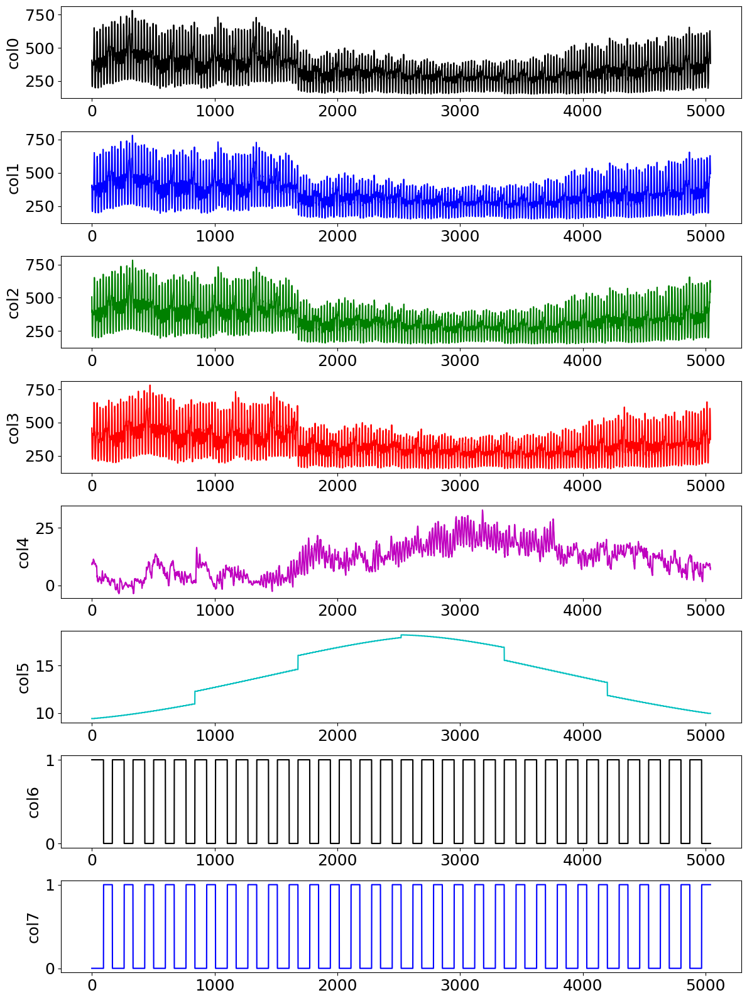

In [362]:
# plot all input features
plot_allFeatures(0,aggTrainingData.shape[1],aggTrainingData)  #,windowLength=10*168)

In [40]:
# save the training /testing data 
with open('../project_data/intermediateDataLCL/aggTrainingData_ANN.pickle', 'wb') as f:
    pickle.dump(aggTrainingData, f, protocol=pickle.HIGHEST_PROTOCOL)
with open('../project_data/intermediateDataLCL/aggTestingData_ANN.pickle', 'wb') as f:
    pickle.dump(aggTestingData, f, protocol=pickle.HIGHEST_PROTOCOL)
    

In [101]:
# use this while testing to ensure repeatable results 

#from numpy.random import seed
##seed(1)
#from tensorflow import set_random_seed
#set_random_seed(2)

In [102]:
# reset random seed for normal use (default anyways - not needed), doesn't work on Colab
# set_random_seed(None)  

# run ANN for aggregate case 

normally skip next couple cells - use ONLY IF WANT TO USE EXACT MLR INPUTS IE WITH LINEAR AND QUADRATIC TERMS as inputs to ANN


In [363]:
# revisit input to MLR (18 features)  

#with open('../project_data/intermediateDataLCL/aggTrainingData.pickle', 'rb') as pickleFile:
#    aggTrainingData = pickle.load(pickleFile, encoding='latin-1') 
#with open('../project_data/intermediateDataLCL/aggTestingData.pickle', 'rb') as pickleFile:
#    aggTestingData = pickle.load(pickleFile, encoding='latin-1') 
#with open('../project_data/intermediateDataLCL/aggTrainingDataUnaware.pickle', 'rb') as pickleFile:
#    aggTrainingDataUnaware = pickle.load(pickleFile, encoding='latin-1') 
#with open('../project_data/intermediateDataLCL/aggTestingDataUnaware.pickle', 'rb') as pickleFile:
#    aggTestingDataUnaware = pickle.load(pickleFile, encoding='latin-1') 
    

In [364]:
# uncomment next lines if want to EXclude Temperature terms (for MLR allFeatures input)
#aggTrainingData = aggTrainingDataUnaware
#aggTestingData = aggTestingDataUnaware
#aggTrainingData
#print(aggTrainingData.shape)

In [365]:
aggTrainingData.shape
aggTestingData.shape
print("data example early Jan, early AM : DoW (load) terms\n",aggTrainingData[:5,12:])
print("data example Summer, afternoon :  DoW (load) terms\n",aggTrainingData[3000:3005,12:])
print("data example early Jan early AM : env terms\n",aggTrainingData[:5,:12])
print("data example Summer, afternoon :  env terms\n",aggTrainingData[3010:3015,:12])

data example early Jan, early AM : DoW (load) terms
 []
data example Summer, afternoon :  DoW (load) terms
 []
data example early Jan early AM : env terms
 [[407.228      390.1279998  505.7269999  458.5419997    9.06
    9.43805556   1.           0.        ]
 [311.5240004  407.228      390.1279998  379.255        9.48
    9.43805556   1.           0.        ]
 [229.6869995  311.5240004  407.228      295.068        9.57
    9.43805556   1.           0.        ]
 [211.6290003  229.6869995  311.5240004  252.9700003    9.57
    9.43805556   1.           0.        ]
 [208.8100003  211.6290003  229.6869995  230.669        9.88
    9.43805556   1.           0.        ]]
data example Summer, afternoon :  env terms
 [[322.2410002  314.5929997  289.1459999  269.3920002   25.17
   17.67083333   0.           1.        ]
 [320.2810006  322.2410002  314.5929997  264.4529999   26.86
   17.67083333   0.           1.        ]
 [321.7719999  320.2810006  322.2410002  269.2859997   27.88
   17.67083333  

In [366]:
# get load data (target) - same for MLR and ANN provided same windows used
with open('../project_data/intermediateDataLCL/aggLoadTraining.pickle', 'rb') as picklefile:
    aggLoadTrain = pickle.load(picklefile, encoding='latin-1') 
with open('../project_data/intermediateDataLCL/aggLoadTesting.pickle', 'rb') as picklefile:
    aggLoadTest  = pickle.load(picklefile, encoding='latin-1') 

skip this next cell if using MLR style input allFeatures above

In [367]:
# get ANN training /testing data again if needed

with open('../project_data/intermediateDataLCL/aggTrainingData_ANN.pickle', 'rb') as picklefile:
    aggTrainingData = pickle.load(picklefile, encoding='latin-1')
with open('../project_data/intermediateDataLCL/aggTestingData_ANN.pickle', 'rb') as picklefile:
    aggTestingData = pickle.load(picklefile, encoding='latin-1')


# Normalisation of Inputs  & Targets

https://machinelearningmastery.com/how-to-improve-neural-network-stability-and-modeling-performance-with-data-scaling/

Had a lot of problems trying to get this working but eventually got there: above website v useful . Required    
a) normalization of inputs and outputs with scikit learn MinMaxScaler
b) apply inverse_transform to ANN output BEFORE computing errors 


In [368]:
aggTrainingData.shape
aggLoadTrain.shape

(5040,)

In [369]:
# apply scaling - may need to remove .values 

MinMax_SC_trainingData = MinMaxScaler()
MinMax_SC_testingData = MinMaxScaler()
MinMax_SC_trainingLoad = MinMaxScaler()
MinMax_SC_testingLoad = MinMaxScaler()

aggTrainingDataNormalized = MinMax_SC_trainingData.fit_transform(aggTrainingData)
aggTestingDataNormalized = MinMax_SC_testingData.fit_transform(aggTestingData)
aggLoadTrainNormalized = MinMax_SC_trainingLoad.fit_transform(aggLoadTrain.values.reshape(-1,1))
aggLoadTestNormalized = MinMax_SC_testingLoad.fit_transform(aggLoadTest.values.reshape(-1,1))

scalers={'sc1':MinMax_SC_trainingData,'sc2':MinMax_SC_testingData,'sc3':MinMax_SC_trainingLoad,'sc4':MinMax_SC_testingLoad}

5040


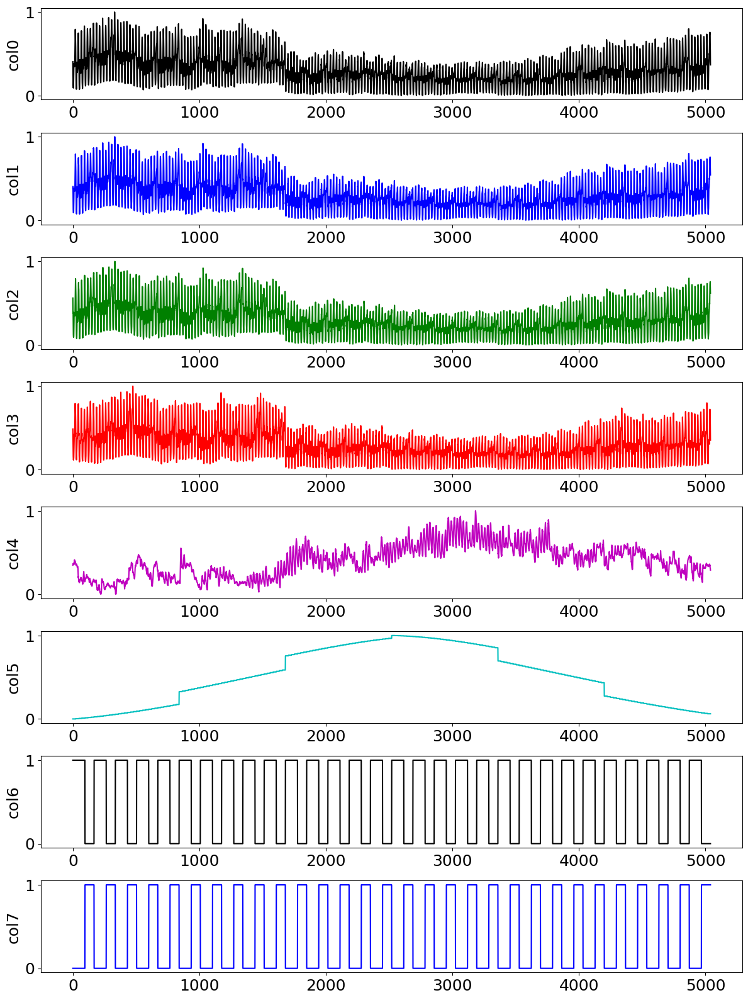

In [370]:
# plot all input features
plot_allFeatures(0,aggTrainingDataNormalized.shape[1],aggTrainingDataNormalized)

In [371]:
# check scaler values
for scName,scaler in scalers.items():
    print(scaler.scale_)

[0.00158787 0.00158787 0.00158787 0.00158787 0.02744237 0.11373689
 1.         1.        ]
[0.00182306 0.00182306 0.00182306 0.00185315 0.02917153 0.11407929
 1.         1.        ]
[0.00158787]
[0.00182306]


In [372]:
#test inverse scaling - should give array of 0's
#aggTrainingData_inversed=scalers['sc1'].inverse_transform(aggTrainingDataNormalized)
#aggTrainingData_inversed-aggTrainingData

In [373]:
#check min/max of input (pre-normalization)
print("Training Inputs: \nmin {0}  \nmax {1}\n".format(get_NPminmax_values(aggTrainingData,ax=0)[0],get_NPminmax_values(aggTrainingData,ax=0)[1]))
print("Testing Inputs: \nmin {0}  \nmax {1}\n".format(get_NPminmax_values(aggTestingData,ax=0)[0],get_NPminmax_values(aggTestingData,ax=0)[1]))
print("Training Target (load): min {0}  max {1}\n".format(get_NPminmax_values(aggLoadTrain,ax=0)[0],get_NPminmax_values(aggLoadTrain,ax=0)[1]))
print("Testing Target (load): min {0}  max {1}\n".format(get_NPminmax_values(aggLoadTest,ax=0)[0],get_NPminmax_values(aggLoadTest,ax=0)[1]))

Training Inputs: 
min [152.152      152.152      152.152      152.152       -3.66
   9.43805556   0.           0.        ]  
max [781.9269994  781.9269994  781.9269994  781.9269994   32.78
  18.23027778   1.           1.        ]

Testing Inputs: 
min [152.027      152.027      152.027      153.861       -1.6
   9.46972222   0.           0.        ]  
max [700.5549984  700.5549984  700.5549984  693.4840004   32.68
  18.23555556   1.           1.        ]

Training Target (load): min 152.15199999999987  max 781.9269993999999

Testing Target (load): min 152.02700000000002  max 700.5549984000008



In [374]:
# get number of columns in input features array
nCols = aggTrainingData.shape[1]
nCols = aggTrainingDataNormalized.shape[1]
nCols

8

In [375]:
# check normalized min/max
print("Training Inputs Normalized: \nmin {0}  \nmax {1}\n".format(get_NPminmax_values(aggTrainingDataNormalized,ax=0)[0],get_NPminmax_values(aggTrainingDataNormalized,ax=0)[1]))
print("Testing Inputs Normalized: \nmin {0}  \nmax {1}\n".format(get_NPminmax_values(aggTestingDataNormalized,ax=0)[0],get_NPminmax_values(aggTestingDataNormalized,ax=0)[1]))
print("Training Target (load) Normalized: min {0}  max {1}\n".format(get_NPminmax_values(aggLoadTrainNormalized,ax=0)[0],get_NPminmax_values(aggLoadTrainNormalized,ax=0)[1]))
print("Testing Target (load) Normalized: min {0}  max {1}\n".format(get_NPminmax_values(aggLoadTestNormalized,ax=0)[0],get_NPminmax_values(aggLoadTestNormalized,ax=0)[1]))

Training Inputs Normalized: 
min [0. 0. 0. 0. 0. 0. 0. 0.]  
max [1. 1. 1. 1. 1. 1. 1. 1.]

Testing Inputs Normalized: 
min [0. 0. 0. 0. 0. 0. 0. 0.]  
max [1. 1. 1. 1. 1. 1. 1. 1.]

Training Target (load) Normalized: min [0.]  max [1.]

Testing Target (load) Normalized: min [0.]  max [1.]



# now run ANN for aggregate case all together in one go

In [376]:
# select whether to use normalised or original inputs,targets

use_Normalization=True       # for standard input features
#use_Normalization=False     # try this for MLR style inputs as normalization giving poor results 


# check inputs/outputs for ANN training 


In [377]:
print("Training data shape{0}, load (target) data shape {1}".format(aggTrainingDataNormalized.shape,aggLoadTrainNormalized.shape))
print("Test data shape{0}, load (target) data shape {1}".format(aggTestingDataNormalized.shape,aggLoadTestNormalized.shape))

Training data shape(5040, 8), load (target) data shape (5040, 1)
Test data shape(2016, 8), load (target) data shape (2016, 1)


5040
5040
2016


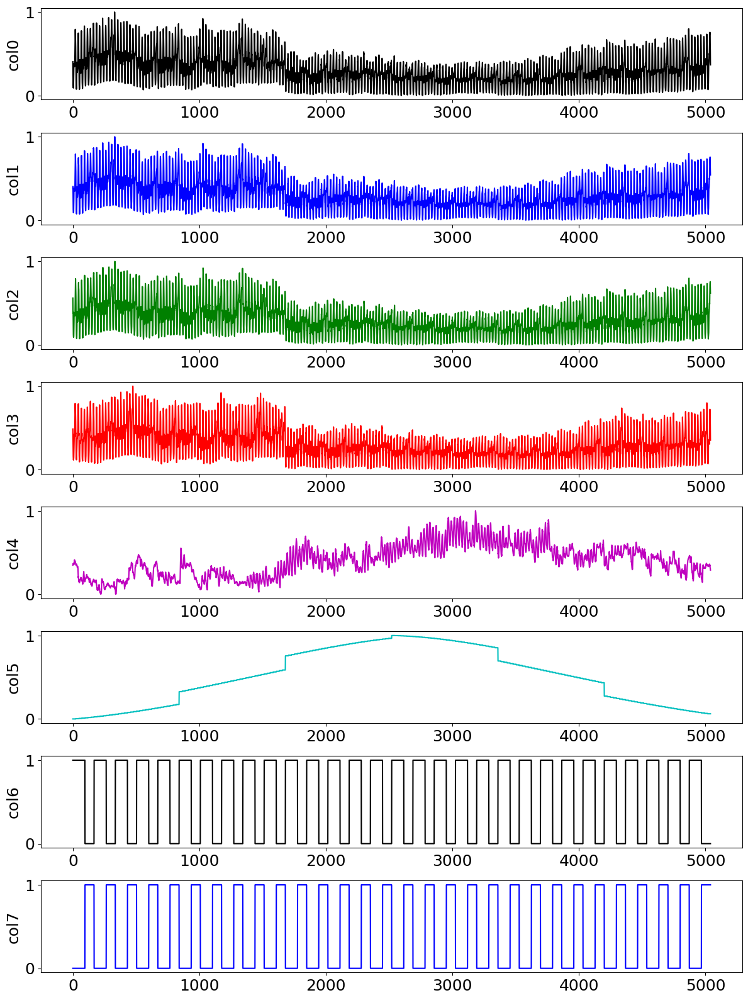

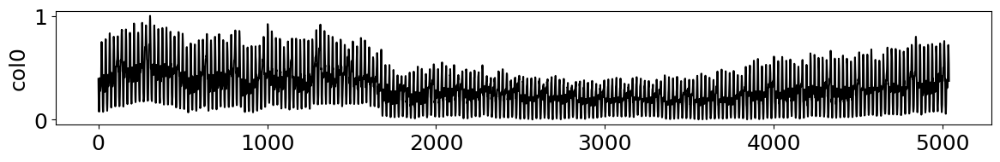

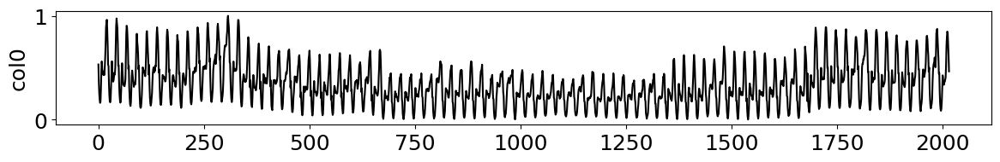

In [378]:
if use_Normalization == True:
    plot_allFeatures(0,aggTrainingDataNormalized.shape[1],aggTrainingDataNormalized)
    plot_allFeatures(0,1,aggLoadTrainNormalized)
    plot_allFeatures(0,1,aggLoadTestNormalized)    
else:
    plot_allFeatures(0,aggTrainingData.shape[1],aggTrainingData)
    plot_allFeatures(0,1,aggLoadTrain)
    plot_allFeatures(0,1,aggLoadTest)
    
    

In [379]:
# set appropriate train/target arrays
if use_Normalization == True:
    trainData=aggTrainingDataNormalized
    testData=aggTestingDataNormalized
    trainTarget=aggLoadTrainNormalized
    testTarget=aggLoadTestNormalized
else:
    trainData=aggTrainingData
    testData=aggTestingData
    trainTarget=aggLoadTrain
    testTarget=aggLoadTest
 

In [380]:
# check as expected : input and target examples
print(trainData[0])
trainTarget[:10]

[0.40502719 0.37787464 0.56143067 0.48650709 0.34906696 0.
 1.         0.        ]


array([[0.39261323],
       [0.24210393],
       [0.13154857],
       [0.09076257],
       [0.07547457],
       [0.09016554],
       [0.17076257],
       [0.30388155],
       [0.40003335],
       [0.33788099]])

# Now run ANN model (AGGREGATE) forecast

config1,2,3:

numHL=1
nNodes = 20  # nodes for hidden ANN layers           
nEpochs = 100 # number of training cycles in fitting           
batchSize = 32  # number batches in fitting          
val_split=0.2        



Instructions for updating:
Colocations handled automatically by placer.
Model: "MLP model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
layer1 (Dense)               (None, 20)                180       
_________________________________________________________________
layer2 (Dense)               (None, 1)                 21        
Total params: 201
Trainable params: 201
Non-trainable params: 0
_________________________________________________________________
model metrics names:  ['loss', 'mean_squared_error']
Instructions for updating:
Use tf.cast instead.
history content keys:  dict_keys(['val_loss', 'val_mean_squared_error', 'loss', 'mean_squared_error'])
-- 10.644576072692871 seconds to run ANN fit, current time17:19:53
2016/2016 [==============================] - 0s 12us/step
Train Score: 0.0016 MSE (0.04 RMSE)
Test Score: 0.0016 MSE (0.04 RMSE)
......Training window errors: Mapes: [0.04964415]

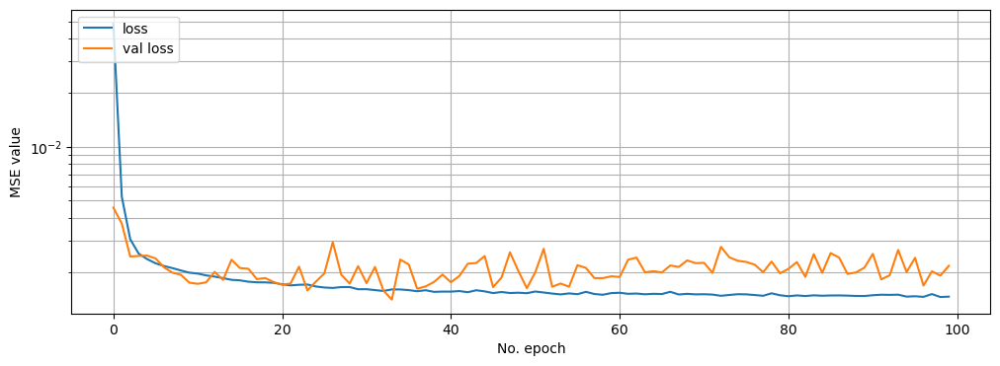

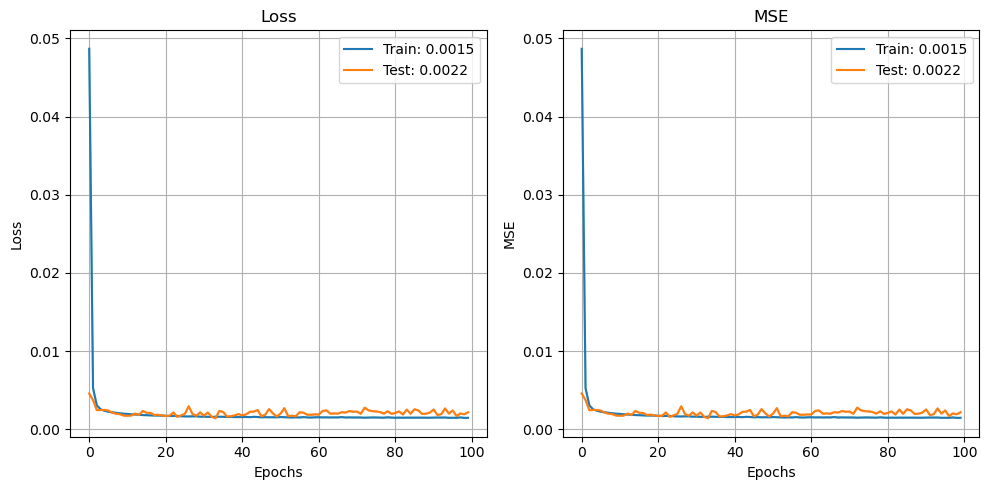

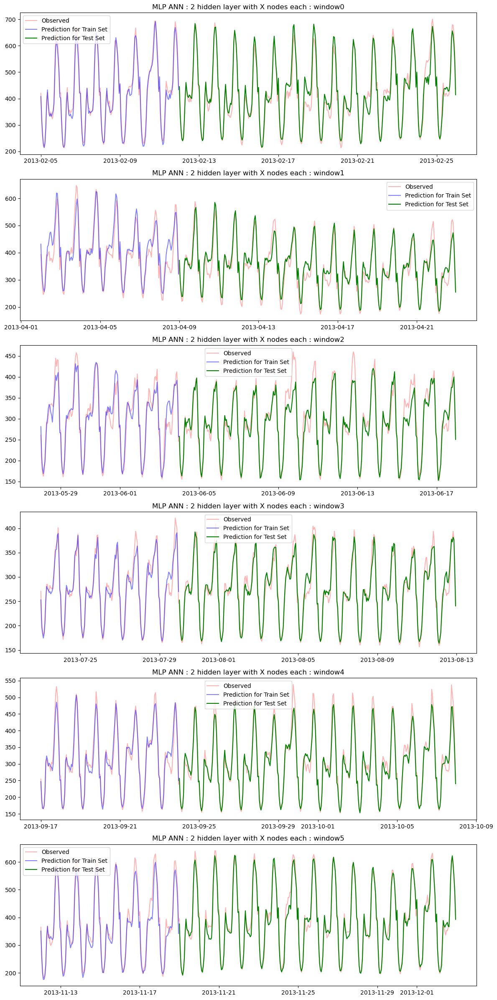

In [381]:
# run ANN for total AGGREGATE load forecast :

# CHECK THESE PARAMETERS ARE AS REQUIRED  
# set ANN parameters
numHL=1
nNodes = 20  # nodes for hidden ANN layers
nEpochs = 100 # number of training cycles in fitting
batchSize = 32  # number batches in fitting
val_split=0.2

lossFunction = 'mean_squared_error'
optimizer = 'adam'                   # adam = gradient descent type optimizer; 
#optimizer = keras.optimizers.Adam(learning_rate=0.001)    # default learning rate is 0.001: if wish to change
metrics = ['mean_squared_error']     # Note: can't use 'accuracy' metric since bot a classifcation problem

start_time = time.time()
#create MLP model: trainDataSeries,nodesPerHiddenLayer,numInputFeatures
mdl = create_MLP(trainData,nNodes,trainData.shape[1],numHL=numHL,activation='relu')          

# specify loss function AND optimizer (search technique used to update weights)
# options for loss function: MSE,MAE,Huber loss, MAPE,RMSE,Logcosh : see https://www.machinecurve.com/index.php/2019/10/04/about-loss-and-loss-functions/#loss-functions-for-regression
mdl.compile(loss=lossFunction, optimizer=optimizer,metrics=metrics)    # adam = gradient descent type optimizer, NOTE 'accuracy' metric only applicable for classification problems

#view model
mdl.layers                                                                # list model layers
mdl.summary()                                                             # display model contents
print("model metrics names: ",mdl.metrics_names)

#fit model - optional - may use callbacks to stop training when reach specified threshold of loss function.. 
callbacks = [keras.callbacks.EarlyStopping(
        # Stop training when `val_loss` is no longer improving
        monitor="val_loss",
        # "no longer improving" being defined as "no better than 1e-2 less"
        min_delta=1e-3,
        # "no longer improving" being further defined as "for at least 5 epochs"
        patience=5, verbose=1,
    )]

history = mdl.fit(trainData, trainTarget, epochs=nEpochs, batch_size=batchSize, verbose=0,\
                 validation_split=val_split)    #,callbacks = callbacks  )
historyPlot(history)

# alternative way to plot history object 
from plot_keras_history import plot_history
print("history content keys: ",history.history.keys())
plot_history(history.history)

print("-- {0} seconds to run ANN fit, current time{1}".format((time.time()-start_time),datetime.now().strftime("%H:%M:%S")) )

# see https://stackoverflow.com/questions/44476706/what-is-the-difference-between-keras-model-evaluate-and-model-predict

# estimate model performance 
train_score = mdl.evaluate(trainData, trainTarget, verbose=1)     
test_score = mdl.evaluate(testData, testTarget, verbose=1)
#print('Train Score: {:.4f} MSE ({:.2f} RMSE)'.format(train_score, math.sqrt(train_score)))
#print('Test Score: {:.4f} MSE ({:.2f} RMSE)'.format(test_score, math.sqrt(test_score)))
print('Train Score: {:.4f} MSE ({:.2f} RMSE)'.format(train_score[0], math.sqrt(train_score[0])))
print('Test Score: {:.4f} MSE ({:.2f} RMSE)'.format(test_score[0], math.sqrt(test_score[0])))

# generate predictions 
train_predict = mdl.predict(trainData)
test_predict = mdl.predict(testData)
test_predict=np.squeeze(test_predict)                                   # remove redundant dimensions from array shape
train_predict=np.squeeze(train_predict)
annForecast={'trainPredict':train_predict,'testPredict':test_predict}   # create dictionary of forecast series

#now need to rescale forecast if used normalisation of inputs,target etc
if use_Normalization == True:
    annForecast['trainPredict']=scalers['sc3'].inverse_transform(annForecast['trainPredict'].reshape(-1,1))
    annForecast['testPredict']=scalers['sc4'].inverse_transform(annForecast['testPredict'].reshape(-1,1))   
    
# calculate forecast errors for TRAIN periods
modelsANN = {'ANN_MPL': annForecast['trainPredict']}  ## create dictionary of model names for forecast period

# error checking (had to update get_errors to handle MinMaxScaler 2D array )
#for k,v in modelsANN.items():
#    print("key {0} \n value {1}\n value type {2}, val shape {3}, ydata shape {4}".format(k,v,type(v),v.shape,loadSeries['yDataTrain'].values.shape))

errorsANNtrain = get_errors(loadSeries['yDataTrain'],modelsANN)
print("......Training window errors: Mapes: {0}, MCVs: {1}, MNRMSEs: {2} \n".format\
              (errorsANNtrain['MAPEs'],errorsANNtrain['MCVs'],errorsANNtrain['MNRMSEs']))

# put TRAIN errors in df with nrows = nModels (1 for now); nCols = nErrorTypes
df_errorsANNtrain = pd.DataFrame.from_dict(errorsANNtrain)
df_errorsANNtrain['models']=list(modelsANN.keys())
df_errorsANNtrain = df_errorsANNtrain.set_index('models')

# calculate forecast errors for TEST periods
modelsANN = {'ANN_MPL': annForecast['testPredict']}  ## create dictionary of model names for forecast period
errorsANN = get_errors(loadSeries['yDataTest'],modelsANN)
print("......Test window errors: Mapes: {0}, MCVs: {1}, MNRMSEs: {2}".format(errorsANN['MAPEs'],errorsANN['MCVs'],errorsANN['MNRMSEs']))

# put TEST errors in df with nrows = nModels (1 for now); nCols = nErrorTypes
df_errorsANN = pd.DataFrame.from_dict(errorsANN)
df_errorsANN['models']=list(modelsANN.keys())
df_errorsANN = df_errorsANN.set_index('models')

#  shift train predictions to align with hr/day indices ie unpack into actual time bands (for easy PLOTTING)
annForecastPlotSeries = annPlotInputs(aggLoad,windows,annForecast)

# plot forecast for 1 week each side of train/test window edge
annPlot(aggLoad,annForecastPlotSeries,windows,viewWin=[-1*168,2*168])                # plot for all periods 
#annPlot(aggLoad,annForecastPlotSeries,windows,numPlots=3)      # just plot 1st few periods


Text(0.5, 1.0, 'Train and Test window forecast + input load data')

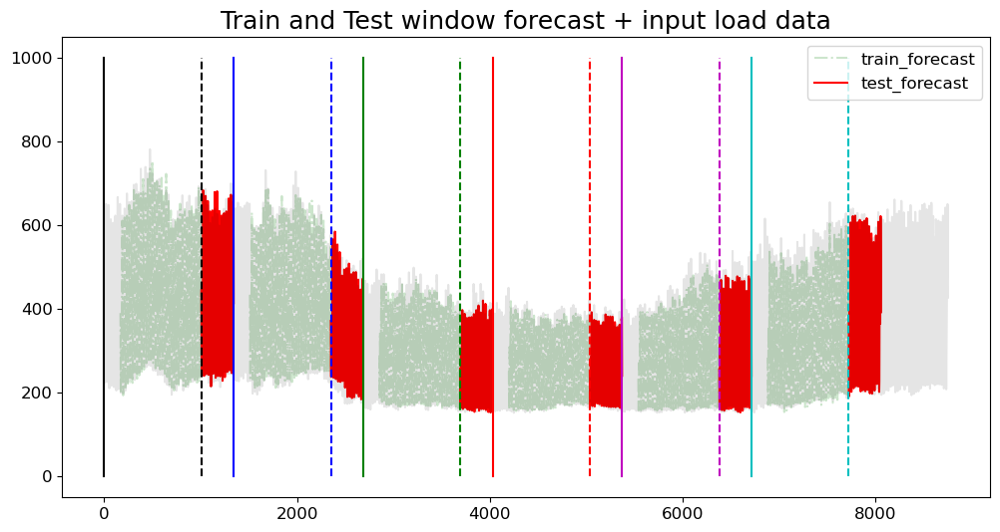

In [382]:
# plot baseline and predictions over full year

fig = plt.figure(figsize=(12,6))
ax1=plt.subplot(111)

ax1.plot(annForecastPlotSeries['trainPredictPlot'],color='g',linestyle='-.',alpha=0.2,label='train_forecast')
ax1.plot(annForecastPlotSeries['testPredictPlot'],color='r',label='test_forecast')
ax1.plot(aggLoad.values,color='k',alpha=0.1)

# add train and predict windows
#yLim = get_limits(test_predict_plot, decimals=-1)   
yLim=[0,1000]
lineColors = ['k','b','g','r','m','c']
lineStyles = ['solid', 'dashdot','dotted', 'dashed']

for w,win in enumerate(windows):
    ax1.plot(2*[win[0]],[yLim[0],yLim[1]],color=lineColors[w],linestyle='solid') #, label='win'+str(w)+'_start')
    ax1.plot(2*[win[1]],[yLim[0],yLim[1]],color=lineColors[w],linestyle='--')

ax1.tick_params(axis='both', labelsize=12)            
plt.legend(ncol=1,fontsize=12)
ax1.set_title('Train and Test window forecast + input load data',fontsize=18)


# ANN for all aggregation levels - Run on COLAB     
(unless running for just a few cases e.g. full aggregate )

checklist: 
- Prerequisite: run top of notebook from start to just before 'split train and test datasets' i.e. a) import modules, functions etc b) set hourly_df,windows,dayClassifier,envSeries c) plot windows to verify all looks as expected

- check *aggregation_N* set as desired
- check *ANN parameters* as desired
- select if wish to use *normalization* of inputs and targets , normally YES
- 1) check list of input feature Series  2) set series NOT to use for training

Note: To run multiple versions e.g. to incorporate variues sets of load histories: easiest option is to replicate the main cell below - ensuring results saved to different folders

in follow on cells:
- check filenames for outputs at end e.g. LCL or IRL for London/Ireland etc

In [383]:
loadSeries.keys()

dict_keys(['yData', 'yDataTrain', 'SN24train', 'SN25train', 'SN26train', 'SN168train', 'yDataTest', 'SN24test', 'SN25test', 'SN26test', 'SN168test'])

In [384]:
for key in envSeries.keys():
    print(key)
    if ('train' in key) or ('Train' in key):
        print("Warning: Terminated as full (un-split) envSeries required for 'MLR-style' input")

tempTrain
tempTest
dayLightTrain
dayLightTest
sunsetTrain
sunsetTest


In [385]:
# define 'do it all' function to run ANN - keep here rather than in FM module as will prbably need to change regularly
# and need to use lots of my functions - already imported if run here

# *args : 'MLR' : use MLR style inputs (i.e. with linear and quadratic terms for env vars etc).
# **kwargs: 'mlrInputTerms' : dictionary e.g. {'trainLength':trainLength,'predLength':predLength,featureLength':featureLength,
#                                             'nDoWterms':6,'nEnvTerms':12,
#                                             'lodSeries':lodSeries,'lags':lags,'PoYlist':PoYlist}

def runAnnAllAggregations(hourly_df,windows,dayClassifier,envSeries,paramsDict,seriesNamesDefaults,\
                          seriesToExclude,loadFormParams,aggregation_N,annParams,annMLPparams,*args,**kwargs):

    #configure special terms required only if using identical ANN inputs as for MLR config
    if 'MLR' in args:
        for key in envSeries.keys():
            if ('train' in key) or ('Train' in key):
                return("Warning: Terminated as full (un-split) envSeries required for 'MLR-style' input")

        if 'mlrInputTerms' not in kwargs:
            return("Warning: Need to provide additional terms to use 'MLR-style' inputs for ANN training")

        mlrTerms = kwargs.get('mlrInputTerms')

        trainLength = mlrTerms['trainLength']
        predLength = mlrTerms['predLength']
        featureLength = mlrTerms['featureLength']
        nDoWterms = mlrTerms['nDoWterms']       
        nEnvTerms = mlrTerms['nEnvTerms']
        lodSeries = mlrTerms['lodSeries']
        PoYlist = mlrTerms['PoYlist']
        lags = mlrTerms['lags']        
        
        # update parameters dictionary    
        paramsDict['trainSeries']=''         # need to have this defined even if not applicable (eg MLR inputs)
        for key,value in mlrTerms.items():   
            #if not isinstance(value,np.ndarray):
            if key != 'PoYlist':
                paramsDictName = 'mlrInputTerms_'+str(key)
                paramsDict[paramsDictName]=value


    # END special config for MLR type inputs
    
    # create empty dictionary to hold dataframes with error stats for each aggregation level
    errorsAggANN_dict = {}       # TEST ERRORS
    errorsAggANNtrain_dict = {}  # TRAIN ERRORS

    #initialize dict to hold forecast series and N-level aggregate loads
    annTrainPredict_dict = {}    # forecasts for TRAIN windows
    annTestPredict_dict = {}     # forecasts for TEST windows  - not needed as stored in previous 
    grpAggLoad_N_dict = {}       # group aggregate loads AND record of userIDs in each grp

    for N in aggregation_N:    
        # Run 'out of sample' selection of random user subsets of size N - assemble userID df
        df_randIDgrps_N = randomUserGroups(hourly_df,N)

        # loop through randID groups and get aggregate load series for each - assemble load series df
        df_grpAggLoad_N = randomUserGroupAggregate(hourly_df,df_randIDgrps_N)

        #********USE THIS NEXT LINE FOR N subset TEST CASE  *********
        # is using this, comment out previous random* calls
        #df_grpAggLoad_N = grpAggLoad_N_TEST[str(N)]['grpAggLoad_N']


        #initialize df to hold forecast series for N
        annTrainPredict_df = pd.DataFrame()
        annTestPredict_df = pd.DataFrame()

        #initialize dataFrame to hold error stats for N
        df_errorsAgg_N_MAPEs_ANN = pd.DataFrame()
        df_errorsAgg_N_MCVs_ANN = pd.DataFrame()
        df_errorsAgg_N_MNRMSEs_ANN = pd.DataFrame()
        df_errorsAgg_N_MAEs_ANN = pd.DataFrame()

        df_errorsAgg_N_MAPEs_ANNtrain = pd.DataFrame() 
        df_errorsAgg_N_MCVs_ANNtrain = pd.DataFrame()
        df_errorsAgg_N_MNRMSEs_ANNtrain = pd.DataFrame()
        df_errorsAgg_N_MAEs_ANNtrain = pd.DataFrame()

        columns=[]  # df column names

        #Loop through each aggregate group of size N
        for i,col in  enumerate(df_grpAggLoad_N.columns):
            #print("i {0}, col {1}".format(i,col))

            load = df_grpAggLoad_N[col]
            #print("Aggregate {0}, series length {1}".format(col,load.shape[0]))

            # collate load series for train and predict windows
            loadSeries = set_loadSeries(windows,load,\
                                        loadFormParams['loadSeriesList'],loadFormParams['loadSeriesOffsetsWinStart'],\
                                        loadFormParams['loadSeriesLags'],loadFormParams['loadSeriesWindows']\
                                       )  # return dictionary of all load series 

            # ** Next Block for 'standard' ANN inputs : 1) make dow series 2) set series Names 3) merge load/env/dow series to dfs
            #                                           4) train/test split 5) drop unwanted series 6) convert dfs to np 

            if 'MLR' not in args:              # use 'standard' inputs to ANN training

                # get DayOfWeek classifier : Tue to Fri, Sat to Mon : shouldn't change since all loads have same dattime index range?
                dowSeries = set_dowSeries(windows,load,dayClassifier)

                # reset list of input features to defaults 
                loadTrainNames = seriesNamesDefaults['loadTrainNamesDefaults']
                loadTestNames = seriesNamesDefaults['loadTestNamesDefaults'] 
                envTrainNames= seriesNamesDefaults['envTrainNamesDefaults']
                envTestNames= seriesNamesDefaults['envTestNamesDefaults'] 

                # split training and test data
                df_Train = create_TrainPredict_df(loadTrainNames,loadSeries,envTrainNames,envSeries,['dowTrain'],dowSeries)
                df_Test = create_TrainPredict_df(loadTestNames,loadSeries,envTestNames,envSeries,['dowTest'],dowSeries)       

                # decide which columns to keep for ANN training and testing (from defaults above) and convert to numpy for MLP
                trainSeries,testSeries = get_TrainTestSeries(df_Train,df_Test)

                # drop some series if specified e.g. sunset 
                for series in seriesToExclude['trainSeriesToExclude']:     
                    trainSeries.remove(series)
                for series in seriesToExclude['testSeriesToExclude']:
                    testSeries.remove(series) 

                # update parameters dictionary    #only need to update once since names won't change 
                if i==0:
                    paramsDict['trainSeries']=trainSeries

                #convert inputs to np arrays for MLP
                aggTrainingData  = df_Train[trainSeries].values    
                aggTestingData = df_Test[testSeries].values                        

                # set target load series for ANN training and testing
                aggLoadTrain =  df_Train[['yDataTrain']].values
                aggLoadTest =  df_Test[['yDataTest']].values     
            
            # ** next Block for 'MLR type' inputs : identical 'allFeatures' config as per MLR with linear and quadratic env terms
            #                                       1) populate allFeatures np array 2) train/test split
            
            else:                    # using 'MLR style' input np array of features
                                   
                #populate allFeatures:
                Features = populate_AllFeatures(windows,featureLength,loadSeries['yData'],load,\
                                     envSeries['temp'],dayClassifier,timeLists,nEnvTerms ,PoY=PoYlist,\
                                    LoD=envSeries[lodSeries],lags=lags,nDoWterms=nDoWterms)      

                # plot day class of allFeaturesTrain - error checking; 
                if (i==0):
                    plot_allFeatures(nEnvTerms+2,1,Features,windowLength=2*168)   # plot 1 of t-24 terms   

                #set train and test features
                aggTrainingData,aggTestingData = create_TrainPredictSeries(trainLength,predLength,Features,windows,nEnvTerms,nDoWterms)

                #set target features
                aggLoadTrain = loadSeries['yDataTrain'].values
                aggLoadTest = loadSeries['yDataTest'].values
            

            if use_Normalization == True:
                # Run NORMALIZATION of inputs and targets
                MinMax_SC_trainingData = MinMaxScaler()
                MinMax_SC_testingData = MinMaxScaler()
                MinMax_SC_trainingLoad = MinMaxScaler()
                MinMax_SC_testingLoad = MinMaxScaler()

                aggTrainingDataNormalized = MinMax_SC_trainingData.fit_transform(aggTrainingData)
                aggTestingDataNormalized = MinMax_SC_testingData.fit_transform(aggTestingData)
                aggLoadTrainNormalized = MinMax_SC_trainingLoad.fit_transform(aggLoadTrain.reshape(-1,1))
                aggLoadTestNormalized = MinMax_SC_testingLoad.fit_transform(aggLoadTest.reshape(-1,1))

                scalers={'sc1':MinMax_SC_trainingData,'sc2':MinMax_SC_testingData,'sc3':MinMax_SC_trainingLoad,'sc4':MinMax_SC_testingLoad}

            # set appropriate train/target arrays
            if use_Normalization == True:
                trainData=aggTrainingDataNormalized
                testData=aggTestingDataNormalized
                trainTarget=aggLoadTrainNormalized
                testTarget=aggLoadTestNormalized
            else:
                trainData=aggTrainingData
                testData=aggTestingData
                trainTarget=aggLoadTrain
                testTarget=aggLoadTest
                               
            # now run ANN  - track time for each loop (grp)
            start_time = time.time()

            #create MLP model: trainDataSeries,nodesPerHiddenLayer,numInputFeatures; default weights init.
            mdl = create_MLP(trainData,annParams['nNodes'],trainData.shape[1])      

            # specify loss function AND optimizer (search technique used to update weights)
            mdl.compile(loss=annMLPparams['lossFunction'], optimizer=annMLPparams['optimizer'],\
                        metrics=annMLPparams['metrics'])  

            #fit model
            history = mdl.fit(trainData, trainTarget, epochs=annParams['nEpochs'], batch_size=annParams['batchSize'],\
                              verbose=0,validation_split=annParams['val_split'])  #,callbacks = callbacks  
            print("For agg level {0},{1},-- {2} seconds to run ANN fit, current time{3}".\
                  format(N,col,(time.time()-start_time),datetime.now().strftime("%H:%M:%S")) )

            # plot loss function (for subset )- check loss and val_loss both show consistent downward trend )
            if (i % 30) == 0:                     
                historyPlot(history,N=N,col=col)  

            # estimate model performance 
            train_score = mdl.evaluate(trainData, trainTarget, verbose=0)
            test_score = mdl.evaluate(testData, testTarget, verbose=0)
            print('Train Score: {:.2f} MSE ({:.2f} RMSE) Test Score: {:.2f} MSE ({:.2f} RMSE)'.\
                  format(train_score[0], math.sqrt(train_score[0]),test_score[0],math.sqrt(test_score[0])))

            # generate predictions 
            train_predict = mdl.predict(trainData)
            test_predict = mdl.predict(testData)
            test_predict=np.squeeze(test_predict)                                   # remove redundant dimensions from array shape
            train_predict=np.squeeze(train_predict)
            annForecast={'trainPredict':train_predict,'testPredict':test_predict}   # create dictionary of forecast series

            #now need to RESCALE forecast if used normalisation of inputs,target etc
            if annParams['use_Normalization'] == True:
                annForecast['trainPredict']=scalers['sc3'].inverse_transform(annForecast['trainPredict'].reshape(-1,1))
                annForecast['testPredict']=scalers['sc4'].inverse_transform(annForecast['testPredict'].reshape(-1,1))   

            # save annForecast dictionary for each N,grp: append results for current grp to annTrainPredict_df, annTestPredict_df 
            annTrainPredict_df = pd.concat([annTrainPredict_df,pd.DataFrame(annForecast['trainPredict'])],axis=1)
            annTestPredict_df = pd.concat([annTestPredict_df,pd.DataFrame(annForecast['testPredict'])],axis=1)

            # calculate forecast errors for TRAIN periods (for current grp)
            modelsANN = {'ANN_MPL': annForecast['trainPredict']}  # create dictionary of model names for forecast period
            errorsANNtrain = get_errors(loadSeries['yDataTrain'],modelsANN)
            print("......Training window errors: Mapes: {0}, MCVs: {1}, MNRMSEs: {2}".format\
                          (errorsANNtrain['MAPEs'],errorsANNtrain['MCVs'],errorsANNtrain['MNRMSEs']))

            # put TRAIN errors (for current grp) in df with nrows = nModels (1 for now); nCols = nErrorTypes
            df_errorsANNtrain = pd.DataFrame.from_dict(errorsANNtrain)
            df_errorsANNtrain['models']=list(modelsANN.keys())
            df_errorsANNtrain = df_errorsANNtrain.set_index('models')

            # calculate forecast errors for TEST periods (for current grp)
            modelsANN = {'ANN_MPL': annForecast['testPredict']}  ## create dictionary of model names for forecast period
            errorsANN = get_errors(loadSeries['yDataTest'],modelsANN)
            print("......Test window errors: Mapes: {0}, MCVs: {1}, MNRMSEs: {2}\n".format(errorsANN['MAPEs'],errorsANN['MCVs'],errorsANN['MNRMSEs']))

            # put TEST errors (for current grp)  in df with nrows = nModels (1 for now); nCols = nErrorTypes
            df_errorsANN = pd.DataFrame.from_dict(errorsANN)
            df_errorsANN['models']=list(modelsANN.keys())
            df_errorsANN = df_errorsANN.set_index('models')

            #add col (for current grp) to errors df for MAPEs, etc (TRAIN errors)
            columns.append(col)
            df_errorsAgg_N_MAPEs_ANNtrain = pd.concat([df_errorsAgg_N_MAPEs_ANNtrain,pd.DataFrame(errorsANNtrain['MAPEs'])],axis=1)
            df_errorsAgg_N_MCVs_ANNtrain = pd.concat([df_errorsAgg_N_MCVs_ANNtrain,pd.DataFrame(errorsANNtrain['MCVs'])],axis=1)
            df_errorsAgg_N_MNRMSEs_ANNtrain = pd.concat([df_errorsAgg_N_MNRMSEs_ANNtrain,pd.DataFrame(errorsANNtrain['MNRMSEs'])],axis=1)

            #add col (for current grp) to errors df for MAPEs, etc (TEST errors)
            df_errorsAgg_N_MAPEs_ANN = pd.concat([df_errorsAgg_N_MAPEs_ANN,pd.DataFrame(errorsANN['MAPEs'])],axis=1)
            df_errorsAgg_N_MCVs_ANN = pd.concat([df_errorsAgg_N_MCVs_ANN,pd.DataFrame(errorsANN['MCVs'])],axis=1)
            df_errorsAgg_N_MNRMSEs_ANN = pd.concat([df_errorsAgg_N_MNRMSEs_ANN,pd.DataFrame(errorsANN['MNRMSEs'])],axis=1)
            #df_errorsAgg_N_MAEs_ANN = pd.concat([df_errorsAgg_N_MNRMSEs_ANN,pd.DataFrame(errorsANN['MAEs'])],axis=1)

            #plot forecast for every ?th grp 
            if (i % 30) == 0:

                # shift train predictions to align with hr/day indices ie unpack into actual time bands (for PLOTTING)
                annForecastPlotSeries = annPlotInputs(load,windows,annForecast)

                # plot forecast for 1 week (i.e. [-168,+168]) each side of train/test window edge
                #annPlot(aggLoad,annForecastPlotSeries,windows)                # plot for all periods 
                annPlot(load,annForecastPlotSeries,windows,numPlots=1,viewWin=[-168,168],\
                       figTitle=('MLP with' + str(annParams['nNodes'])+' nodes : window 0, agg N:'+str(N) + ',grp:',str(col)))

        # give useful column names to forecast and errors dataframes before store in dictionary
        for df in [df_errorsAgg_N_MAPEs_ANN,df_errorsAgg_N_MCVs_ANN,df_errorsAgg_N_MNRMSEs_ANN]: #,df_errorsAgg_N_MAEs_ANN]:
            df.columns = columns
            df.index = ['ANN_MLP']
        for df in [df_errorsAgg_N_MAPEs_ANNtrain,df_errorsAgg_N_MCVs_ANNtrain,df_errorsAgg_N_MNRMSEs_ANNtrain]: #,df_errorsAgg_N_MAEs_ANNtrain]:
            df.columns = columns
            df.index = ['ANN_MLP']

        for df in [annTrainPredict_df,annTestPredict_df]:
            df.columns = columns
            #df.index = ['']

        # append to dictionaries (for latest N level), dataframes of errors, training and prediction window forecasts and input load datasets

        d={}
        d['MAPEs'] = df_errorsAgg_N_MAPEs_ANNtrain
        d['MCVs'] =  df_errorsAgg_N_MCVs_ANNtrain
        d['MRMSEs'] = df_errorsAgg_N_MNRMSEs_ANNtrain
        #d['MAEs_ANN'] = df_errorsAgg_N_MAEs_ANNtrain
        errorsAggANNtrain_dict['%d' % (N)] = d               # train errrors dictionary

        d={}
        d['MAPEs'] = df_errorsAgg_N_MAPEs_ANN
        d['MCVs'] =  df_errorsAgg_N_MCVs_ANN
        d['MRMSEs'] = df_errorsAgg_N_MNRMSEs_ANN
        #d['MAEs_ANN'] = df_errorsAgg_N_MAEs_ANN
        errorsAggANN_dict['%d' % (N)] = d                    # test errrors dictionary

        d={}
        d['trainPredictSeries'] = annTrainPredict_df
        d['testPredictSeries'] = annTestPredict_df   
        annTrainPredict_dict['%d' % (N)] = d                # train and test window forecasts dictionary 

        #use to store sub-aggregate load series
        d={}
        d['randIDgrps_N'] = df_randIDgrps_N
        d['grpAggLoad_N'] = df_grpAggLoad_N
        grpAggLoad_N_dict['%d' % (N)] = d                   # aggregate loads (by N, grp) + corresponding grp userIDs 

    return(paramsDict,errorsAggANNtrain_dict,errorsAggANN_dict,annTrainPredict_dict,grpAggLoad_N_dict)

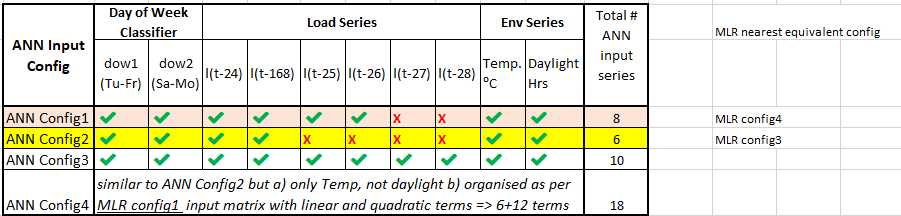

# 1st configuration: 
t-24,t-25,t-26,t-168 load series + temperature, dayLight hrs, weekday/weekend classifier

Note: For total aggregate case, load series pre-defined so used keys to make train, test series names lists However,for iterative aggregation by N, load series not pre-defined so need to define train,test series      names in config .

NB: review next cell carefully for each config  

In [386]:
# define CONFIG1 inputs 

# load series list to use - ** UPDATE list FOR EACH NEW CONFIGURATION **MUST have 'yData','yDataTrain','yDataTest'
loadSeriesList = ['yData',\
                  'yDataTrain','SN24train','SN25train','SN26train','SN168train',\
                  'yDataTest','SN24test','SN25test','SN26test','SN168test']        # set load series names 

# set default (maximal) input features lists *** UPDATE IF ADD NEW SERIES above  **
loadTrainNamesDefaults = ['yDataTrain','SN24train','SN25train','SN26train','SN168train']
loadTestNamesDefaults = [ 'yDataTest','SN24test','SN25test','SN26test','SN168test']
envTrainNamesDefaults = ['tempTrain','dayLightTrain','sunsetTrain']
envTestNamesDefaults = ['tempTest','dayLightTest','sunsetTest']
seriesNamesDefaults = {'loadTrainNamesDefaults':loadTrainNamesDefaults,'loadTestNamesDefaults':loadTestNamesDefaults,\
                           'envTrainNamesDefaults':envTrainNamesDefaults,'envTestNamesDefaults':envTestNamesDefaults}

#select any series NOT to use in training (by default, all series above will be used)

# ** UPDATE exclude lists FOR EACH CONFIG **
trainSeriesToExclude = ['sunsetTrain']  ## use dayLight as length of day variable
testSeriesToExclude = ['sunsetTest']
seriesToExclude = {'trainSeriesToExclude':trainSeriesToExclude,'testSeriesToExclude':testSeriesToExclude}

# set appropriate offsets,lags, etc for load series forming
numSeries=0
for series in loadSeriesList:    # count number of train (=number of test) load series
    if ('train' in series) or ('Train' in series):
        numSeries+=1
loadSeriesOffsetsWinStart = [168] + [168]*numSeries + [0]*numSeries  # set offsets from each window start (max time lag=168)

# *** UPDATE loadSeriesLags FOR EACH NEW CONFIGURATION but ONLY if loadSeriesList changes **
#  number of elements should match loadSeriesList etc (this is before we drop any)
loadSeriesLags = [0]+[0,24,25,26,168]*2                              # set lag terms for each load series (t-lag)
loadSeriesWindows  = np.array([0,3]+[0,1]*numSeries+[2,3]*numSeries).reshape(-1,2)    # set windows for each series range
loadFormParams = {'loadSeriesList':loadSeriesList,'loadSeriesOffsetsWinStart':loadSeriesOffsetsWinStart,\
                  'loadSeriesLags':loadSeriesLags,'loadSeriesWindows':loadSeriesWindows}
 
aggregation_N = [711]  # all users - aggregate case  
#aggregation_N = [5,10,20,30,40,50,75,100]

# set ANN parameters
numHL=1  # 1 was fine for LCL data (grid search), 2 seemed to work better for aggregate for Irl data
nNodes = 20  # nodes for hidden ANN layers
nEpochs = 100 # number of training cycles in fitting
batchSize = 32  # batch size
val_split=0.2

#  select whether to use normalised or original inputs,targets
use_Normalization=True
#use_Normalization=False 
annParams = {'numHL':numHL,'nNodes':nNodes,'nEpochs':nEpochs,'batchSize':batchSize,'val_split':val_split,\
            'use_Normalization':use_Normalization}

lossFunction = 'mean_squared_error'
optimizer = 'adam'                   # adam = gradient descent type optimizer;   
metrics = ['mean_squared_error']     # Note: can't use 'accuracy' metric since bot a classifcation problem
annMLPparams = {'lossFunction':lossFunction,'optimizer':optimizer,'metrics':metrics}

# save parameters to dictionary for saving to disk as json file - gets appended later
paramsDict = {'numHL':numHL,'nNodes':nNodes,'nEpochs':nEpochs,'batchSize':batchSize,'val_split':val_split,\
              'lossFunction':lossFunction,'optimizer':optimizer,'metrics':metrics,\
              'use_normalization':use_Normalization}

#### to get aggregate errors: set aggregation to 711 and run in a loop of 10 , appending to a list - then take avg  (NN rabdom seed for weights initialization => get slightly different result each time)

For agg level 711,grp0,-- 12.103956460952759 seconds to run ANN fit, current time17:23:06
Train Score: 0.00 MSE (0.04 RMSE) Test Score: 0.00 MSE (0.04 RMSE)
......Training window errors: Mapes: [0.04859304], MCVs: [0.06866807], MNRMSEs: [0.03753236]
......Test window errors: Mapes: [0.04876544], MCVs: [0.06544987], MNRMSEs: [0.04019138]

For agg level 711,grp0,-- 11.60721731185913 seconds to run ANN fit, current time17:23:19
Train Score: 0.00 MSE (0.04 RMSE) Test Score: 0.00 MSE (0.04 RMSE)
......Training window errors: Mapes: [0.04922329], MCVs: [0.07039302], MNRMSEs: [0.03847517]
......Test window errors: Mapes: [0.05074107], MCVs: [0.06952404], MNRMSEs: [0.04269324]

For agg level 711,grp0,-- 12.569859266281128 seconds to run ANN fit, current time17:23:32
Train Score: 0.00 MSE (0.04 RMSE) Test Score: 0.00 MSE (0.04 RMSE)
......Training window errors: Mapes: [0.04965208], MCVs: [0.06919648], MNRMSEs: [0.03782118]
......Test window errors: Mapes: [0.05074689], MCVs: [0.06820829], MNRM

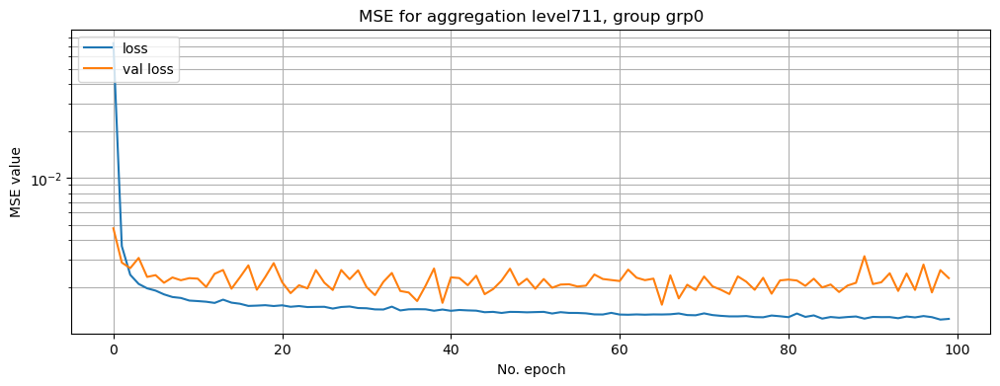

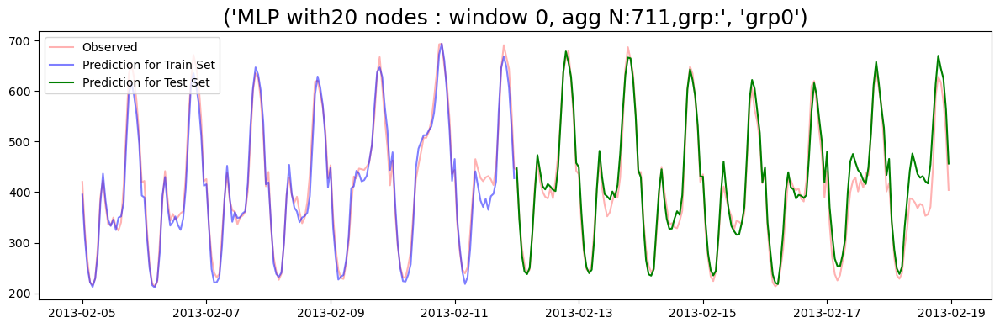

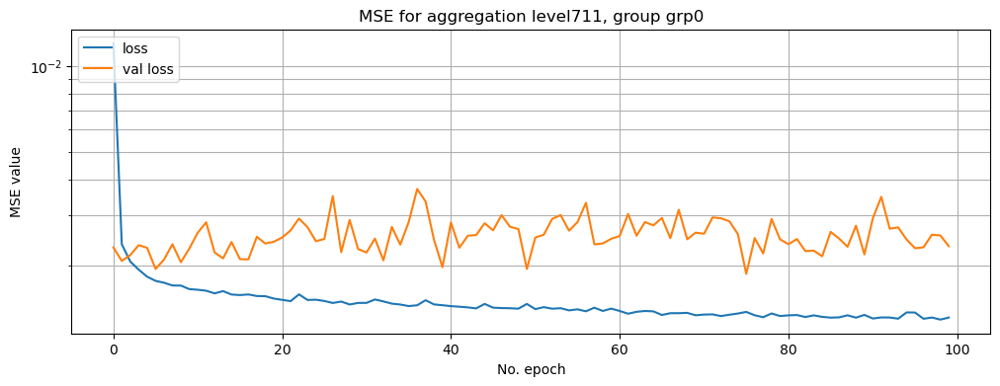

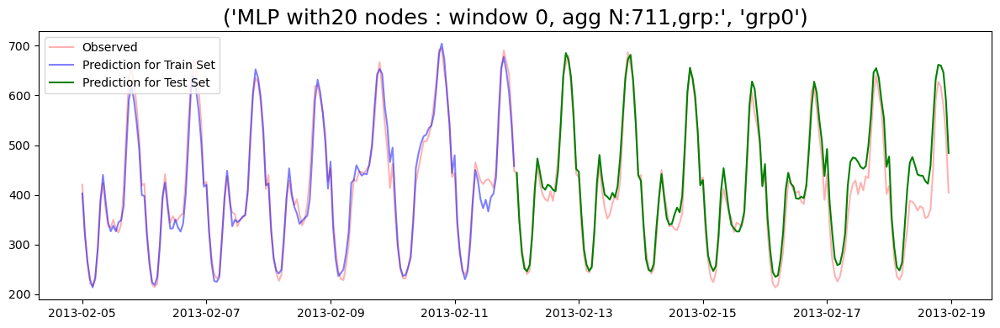

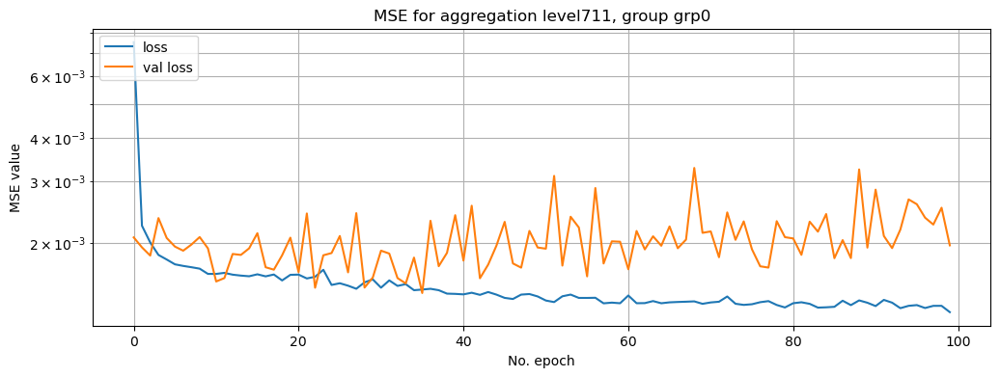

...

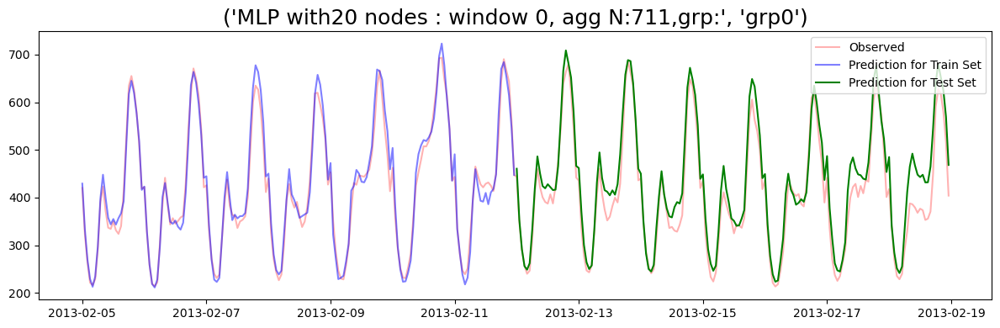

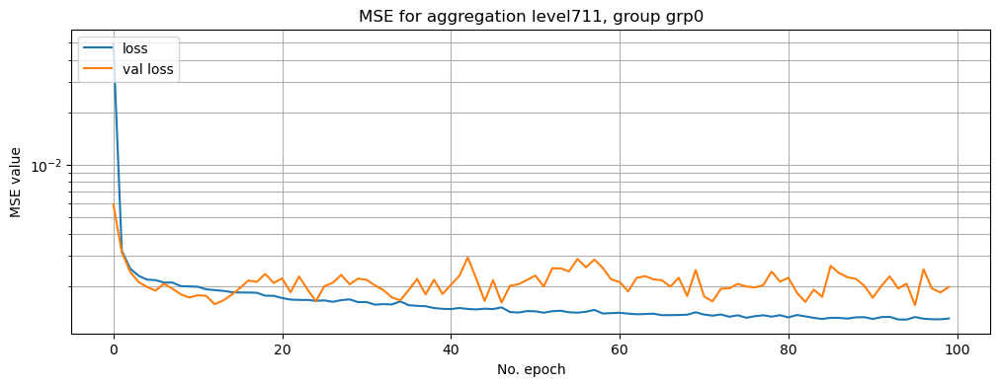

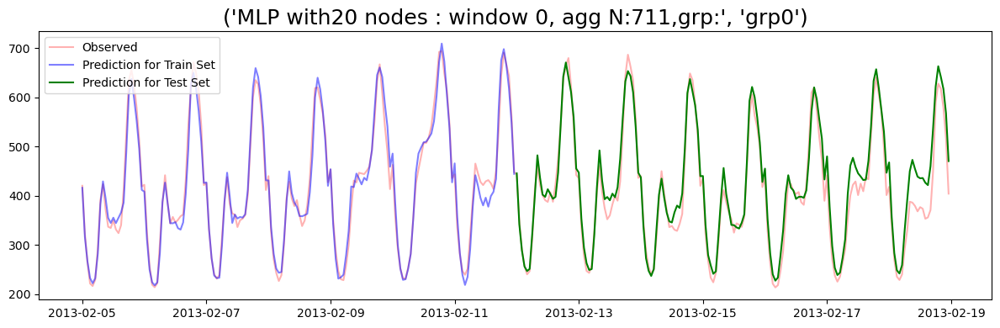

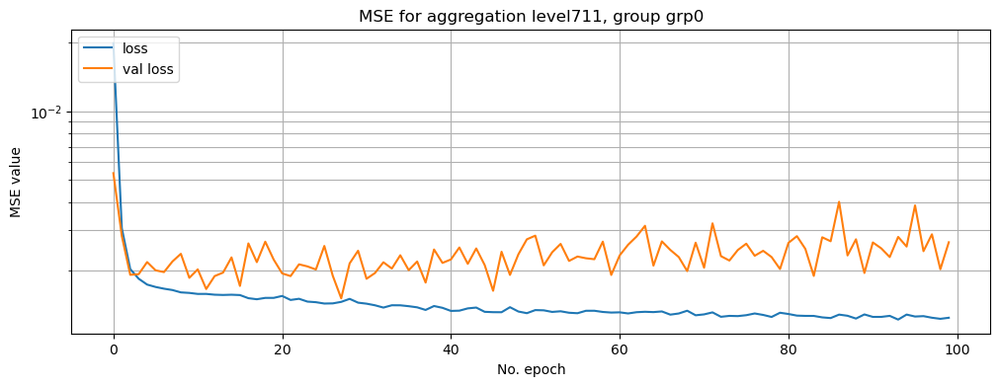

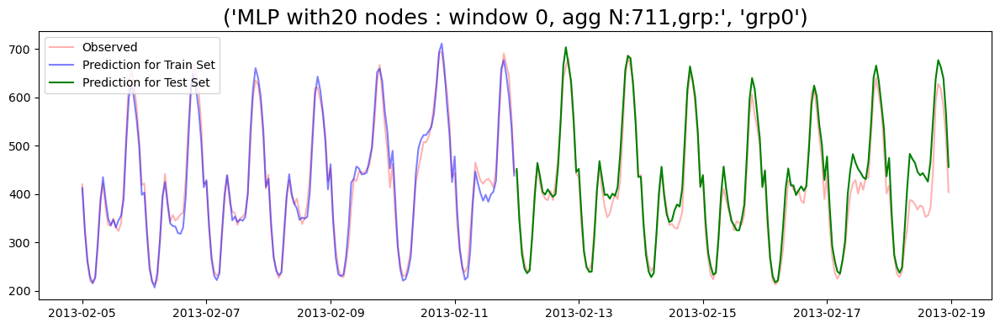

In [387]:
# Run CONFIG1: # loop through all aggregation levels *** BEST TO DO FULL RUN ON COLAB **

config1_LCL_AggMAPEs=[]

config='Config1'

for i in range(10):
    paramsDict,errorsAggANNtrain_dict,errorsAggANN_dict,annTrainPredict_dict,grpAggLoad_N_dict = \
        runAnnAllAggregations(hourly_df,windows,dayClassifier,envSeries,paramsDict,seriesNamesDefaults,\
                              seriesToExclude,loadFormParams,aggregation_N,annParams,annMLPparams)

    resultsDictionaries={'errorsAggANNtrain_dict':errorsAggANNtrain_dict,
                         'errorsAggANN_dict':errorsAggANN_dict,'annTrainPredict_dict':annTrainPredict_dict,
                         'grpAggLoad_N_dict':grpAggLoad_N_dict}
    if aggregation_N == [711]:
        config1_LCL_AggMAPEs.append([resultsDictionaries['errorsAggANNtrain_dict']['711']['MAPEs'].iloc[0,0],\
                                     resultsDictionaries['errorsAggANN_dict']['711']['MAPEs'].iloc[0,0]])
        config1_LCL_AggMAPEs

# save ***CONFIG*** results
#root='../project_data/intermediateDataLCL/'
#globPrefix='LCL_ANN*'
#saveAnnConfigXresults(paramsDict,root,globPrefix,config,aggregation_N,annParams['use_Normalization'],resultsDictionaries)


# 2nd configuration: 
t-24,t-168 load series + temperature, dayLight hrs, weekday/weekend classifier       
only parameters that have changed since config1 are updated (assume config 1 set first)

In [817]:
# define CONFIG2 inputs : only parameters that change since config1

#select any series NOT to use in training (by default, all series above will be used)
trainSeriesToExclude = ['SN25train','SN26train','sunsetTrain']  ## use dayLight as length of day variable
testSeriesToExclude = ['SN25test','SN26test','sunsetTest']
seriesToExclude = {'trainSeriesToExclude':trainSeriesToExclude,'testSeriesToExclude':testSeriesToExclude}


# reset : save parameters to dictionary for saving to disk as json file - gets appended later
paramsDict = {'numHL':numHL,'nNodes':nNodes,'nEpochs':nEpochs,'batchSize':batchSize,'val_split':val_split,\
              'lossFunction':lossFunction,'optimizer':optimizer,'metrics':metrics,\
              'use_normalization':use_Normalization}

For agg level 711,grp0,-- 34.53623914718628 seconds to run ANN fit, current time10:32:11
Train Score: 0.00 MSE (0.04 RMSE) Test Score: 0.00 MSE (0.04 RMSE)
......Training window errors: Mapes: [0.05194684], MCVs: [0.07098205], MNRMSEs: [0.03879713]
......Test window errors: Mapes: [0.05117716], MCVs: [0.06771944], MNRMSEs: [0.04158507]

For agg level 711,grp0,-- 32.32910346984863 seconds to run ANN fit, current time10:32:46
Train Score: 0.00 MSE (0.04 RMSE) Test Score: 0.00 MSE (0.04 RMSE)
......Training window errors: Mapes: [0.0514037], MCVs: [0.07226603], MNRMSEs: [0.03949892]
......Test window errors: Mapes: [0.04826703], MCVs: [0.0653406], MNRMSEs: [0.04012427]

For agg level 711,grp0,-- 33.12797999382019 seconds to run ANN fit, current time10:33:22
Train Score: 0.00 MSE (0.04 RMSE) Test Score: 0.00 MSE (0.04 RMSE)
......Training window errors: Mapes: [0.04992731], MCVs: [0.07248948], MNRMSEs: [0.03962105]
......Test window errors: Mapes: [0.04977011], MCVs: [0.06804742], MNRMSEs:

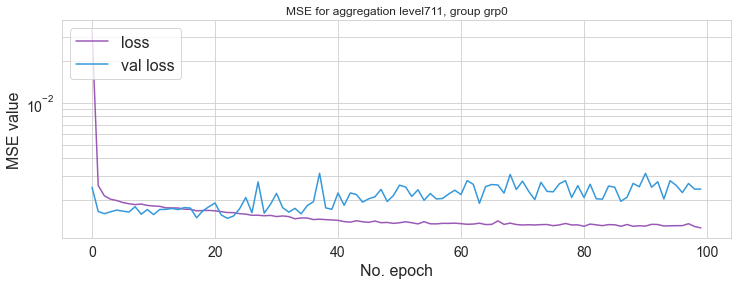

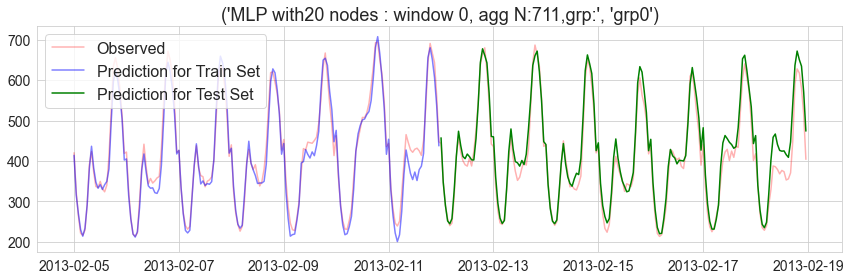

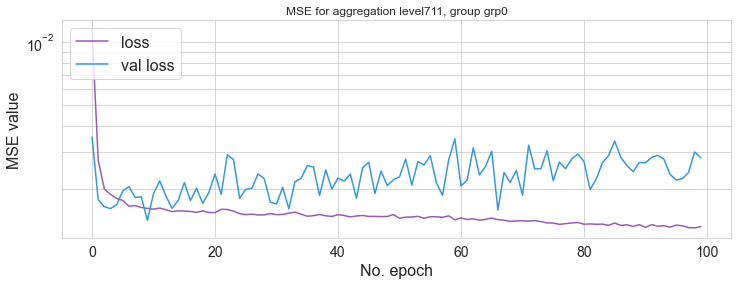

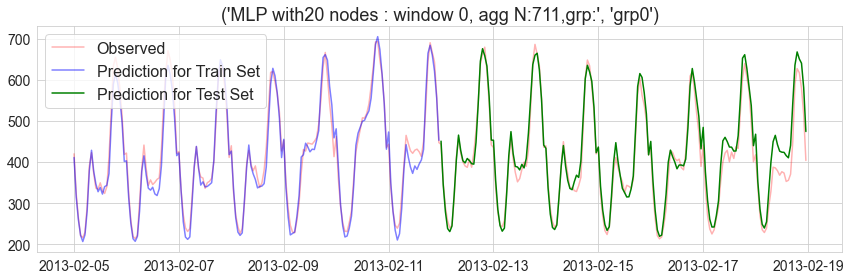

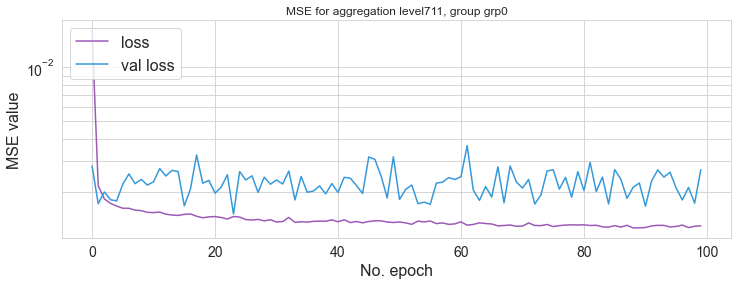

...

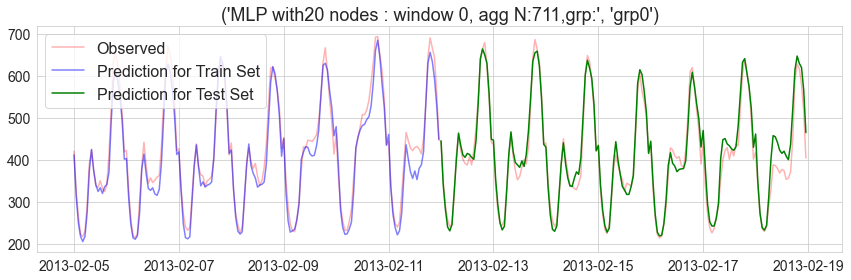

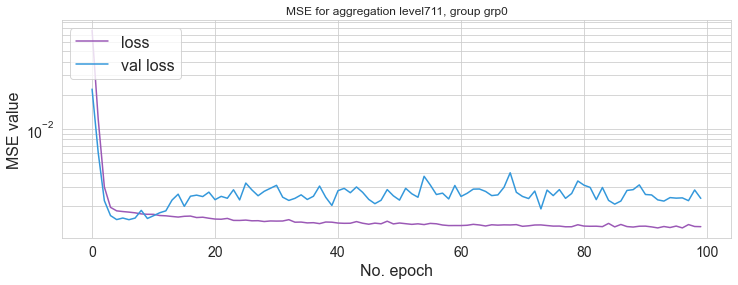

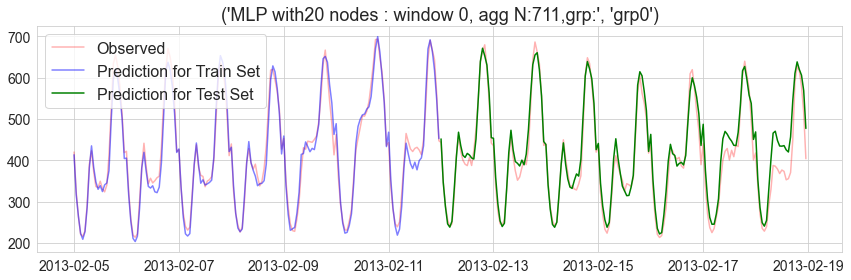

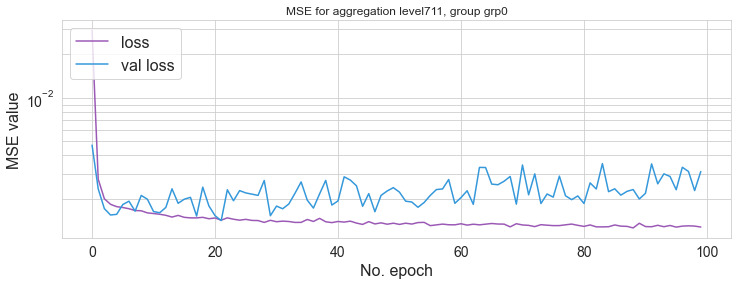

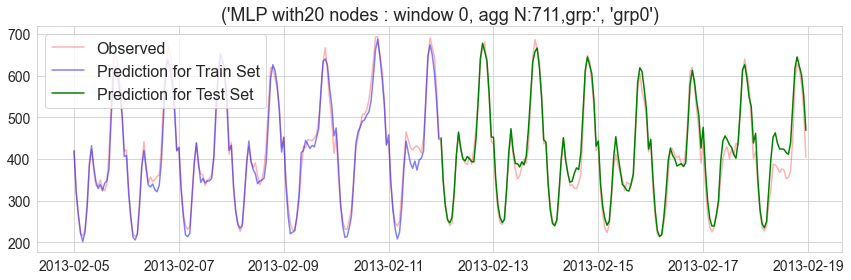

In [818]:
# Run CONFIG2: # loop through all aggregation levels *** BEST TO DO FULL RUN ON COLAB **
config='Config2'
config2_LCL_AggMAPEs=[]

for i in range(10):
    paramsDict,errorsAggANNtrain_dict,errorsAggANN_dict,annTrainPredict_dict,grpAggLoad_N_dict = \
        runAnnAllAggregations(hourly_df,windows,dayClassifier,envSeries,paramsDict,seriesNamesDefaults,\
                              seriesToExclude,loadFormParams,aggregation_N,annParams,annMLPparams)

    resultsDictionaries={'errorsAggANNtrain_dict':errorsAggANNtrain_dict,
                         'errorsAggANN_dict':errorsAggANN_dict,'annTrainPredict_dict':annTrainPredict_dict,
                         'grpAggLoad_N_dict':grpAggLoad_N_dict}
    if aggregation_N == [711]:
        config2_LCL_AggMAPEs.append([resultsDictionaries['errorsAggANNtrain_dict']['711']['MAPEs'].iloc[0,0],\
                                     resultsDictionaries['errorsAggANN_dict']['711']['MAPEs'].iloc[0,0]])
        config2_LCL_AggMAPEs

# save ***CONFIG2*** results
#root='../project_data/intermediateDataLCL/'
#globPrefix='LCL_ANN*'
#saveAnnConfigXresults(paramsDict,root,globPrefix,config,aggregation_N,annParams['use_Normalization'],resultsDictionaries)


# 3rd configuration: 
t-24,t-25,t-26,t-27,t-28,t-168 load series + temperature, dayLight hrs, weekday/weekend classifier       
only parameters that have changed since config1 are updated 

In [819]:
# define CONFIG3 inputs : only parameters that change since config2

# ADD MORE LAGS T-27,T-28

# load series list to use - ** UPDATE list FOR EACH NEW CONFIGURATION **MUST have 'yData','yDataTrain','yDataTest'
loadSeriesList = ['yData',\
                  'yDataTrain','SN24train','SN25train','SN26train','SN27train','SN28train','SN168train',\
                  'yDataTest','SN24test','SN25test','SN26test','SN27test','SN28test','SN168test']        # set load series names 

# set default (maximal) input features lists *** UPDATE IF ADD NEW SERIES above  **
loadTrainNamesDefaults = ['yDataTrain','SN24train','SN25train','SN26train','SN27train','SN28train','SN168train']
loadTestNamesDefaults = [ 'yDataTest','SN24test','SN25test','SN26test','SN27test','SN28test','SN168test']
seriesNamesDefaults = {'loadTrainNamesDefaults':loadTrainNamesDefaults,'loadTestNamesDefaults':loadTestNamesDefaults,\
                           'envTrainNamesDefaults':envTrainNamesDefaults,'envTestNamesDefaults':envTestNamesDefaults}

# ** UPDATE exclude lists FOR EACH CONFIG **
trainSeriesToExclude = ['sunsetTrain']  ## use dayLight as length of day variable
testSeriesToExclude = ['sunsetTest']
seriesToExclude = {'trainSeriesToExclude':trainSeriesToExclude,'testSeriesToExclude':testSeriesToExclude}

# set appropriate offsets,lags, etc for load series forming
numSeries=0
for series in loadSeriesList:    # count number of train (=number of test) load series
    if ('train' in series) or ('Train' in series):
        numSeries+=1
loadSeriesOffsetsWinStart = [168] + [168]*numSeries + [0]*numSeries  # set offsets from each window start (max time lag=168)

# *** UPDATE loadSeriesLags FOR EACH NEW CONFIGURATION but ONLY if loadSeriesList changes **
#  number of elements should match loadSeriesList etc (this is before we drop any)
loadSeriesLags = [0]+[0,24,25,26,27,28,168]*2                              # set lag terms for each load series (t-lag)
loadSeriesWindows  = np.array([0,3]+[0,1]*numSeries+[2,3]*numSeries).reshape(-1,2)    # set windows for each series range
loadFormParams = {'loadSeriesList':loadSeriesList,'loadSeriesOffsetsWinStart':loadSeriesOffsetsWinStart,\
                  'loadSeriesLags':loadSeriesLags,'loadSeriesWindows':loadSeriesWindows}
 
# Reset : save parameters to dictionary for saving to disk as json file - gets appended later
paramsDict = {'numHL':numHL,'nNodes':nNodes,'nEpochs':nEpochs,'batchSize':batchSize,'val_split':val_split,\
              'lossFunction':lossFunction,'optimizer':optimizer,'metrics':metrics,\
              'use_normalization':use_Normalization}

For agg level 711,grp0,-- 32.14220666885376 seconds to run ANN fit, current time10:40:38
Train Score: 0.00 MSE (0.04 RMSE) Test Score: 0.00 MSE (0.04 RMSE)
......Training window errors: Mapes: [0.04908639], MCVs: [0.070773], MNRMSEs: [0.03868286]
......Test window errors: Mapes: [0.04788506], MCVs: [0.07010813], MNRMSEs: [0.04305191]

For agg level 711,grp0,-- 39.804842472076416 seconds to run ANN fit, current time10:41:21
Train Score: 0.00 MSE (0.04 RMSE) Test Score: 0.00 MSE (0.04 RMSE)
......Training window errors: Mapes: [0.05200181], MCVs: [0.06902522], MNRMSEs: [0.03772757]
......Test window errors: Mapes: [0.04778138], MCVs: [0.06501361], MNRMSEs: [0.03992348]

For agg level 711,grp0,-- 52.269431591033936 seconds to run ANN fit, current time10:42:16
Train Score: 0.00 MSE (0.04 RMSE) Test Score: 0.00 MSE (0.04 RMSE)
......Training window errors: Mapes: [0.05023432], MCVs: [0.06863312], MNRMSEs: [0.03751326]
......Test window errors: Mapes: [0.05005519], MCVs: [0.06665617], MNRMSE

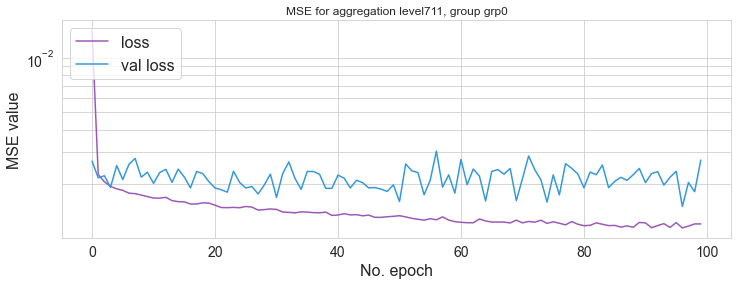

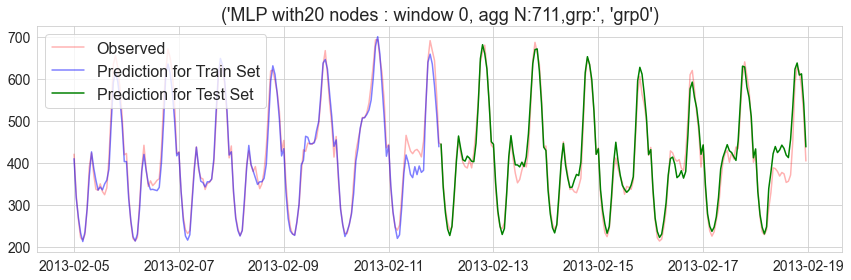

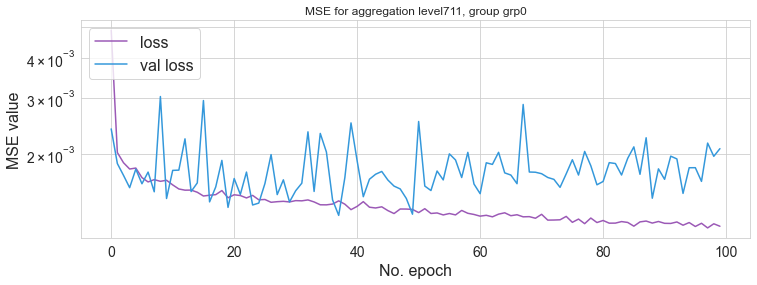

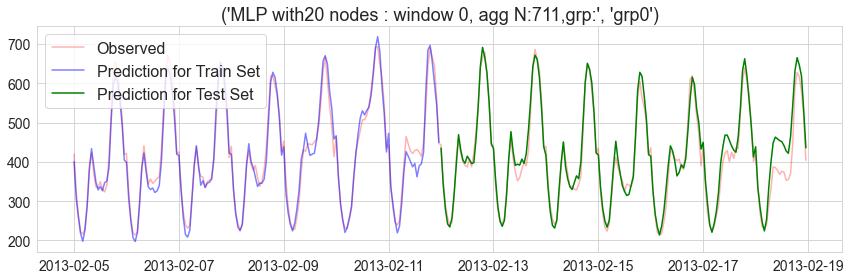

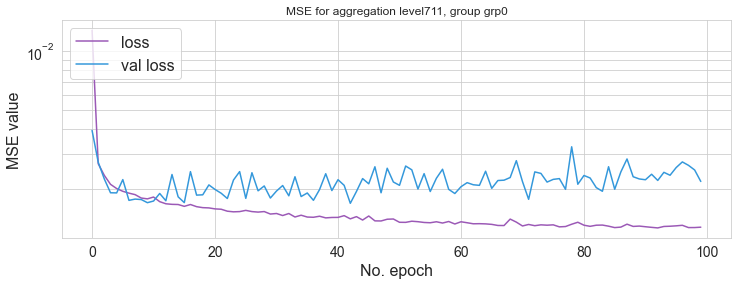

...

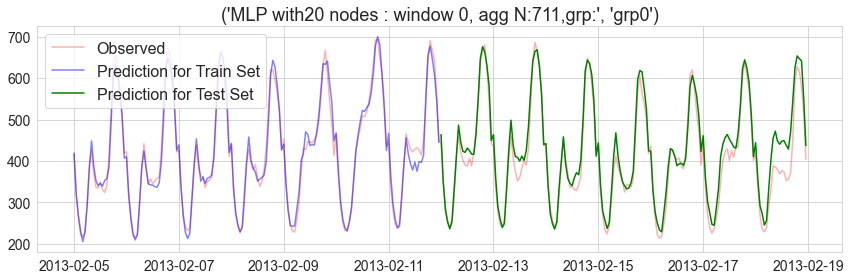

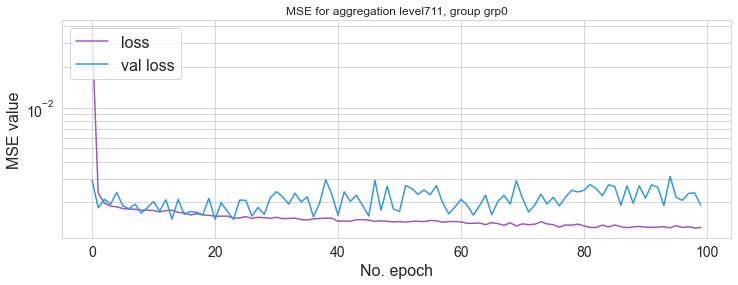

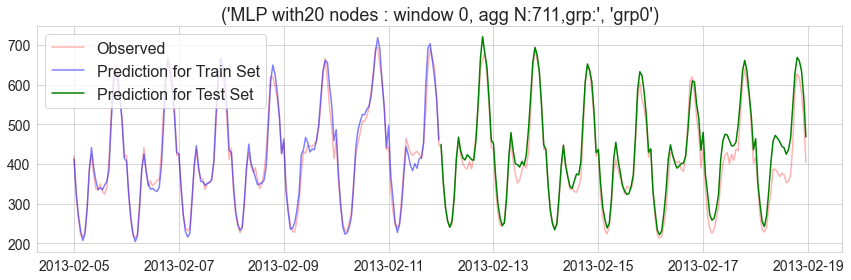

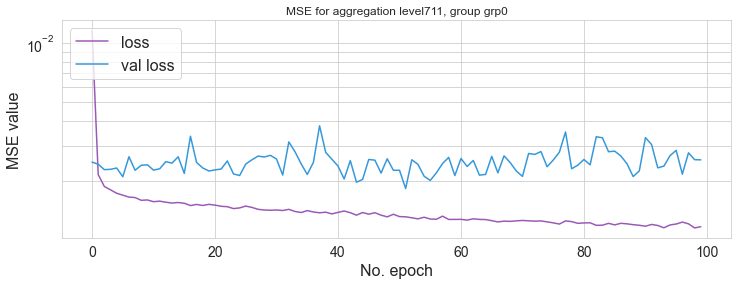

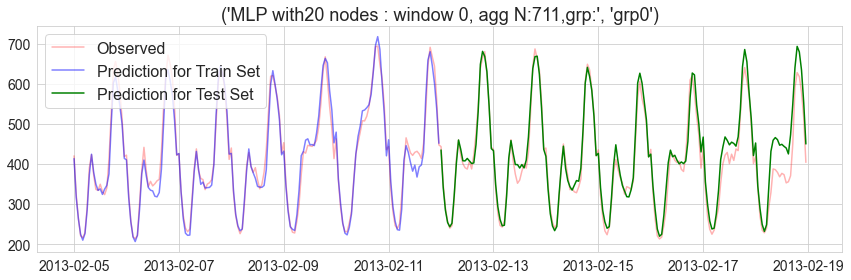

In [820]:
# Run CONFIG3: # loop through all aggregation levels *** BEST TO DO FULL RUN ON COLAB **
config3_LCL_AggMAPEs=[]
config='Config3'

for i in range(10):
    paramsDict,errorsAggANNtrain_dict,errorsAggANN_dict,annTrainPredict_dict,grpAggLoad_N_dict = \
        runAnnAllAggregations(hourly_df,windows,dayClassifier,envSeries,paramsDict,seriesNamesDefaults,\
                              seriesToExclude,loadFormParams,aggregation_N,annParams,annMLPparams)

    resultsDictionaries={'errorsAggANNtrain_dict':errorsAggANNtrain_dict,
                         'errorsAggANN_dict':errorsAggANN_dict,'annTrainPredict_dict':annTrainPredict_dict,
                         'grpAggLoad_N_dict':grpAggLoad_N_dict}
    if aggregation_N == [711]:
        config3_LCL_AggMAPEs.append([resultsDictionaries['errorsAggANNtrain_dict']['711']['MAPEs'].iloc[0,0],\
                                     resultsDictionaries['errorsAggANN_dict']['711']['MAPEs'].iloc[0,0]])
        config3_LCL_AggMAPEs


# save ***CONFIG3*** results
#root='./project_data/intermediateDataLCL/'
#globPrefix='LCL_ANN*'
#saveAnnConfigXresults(paramsDict,root,globPrefix,aggregation_N,annParams['use_Normalization'],resultsDictionaries)



# 4th configuration: 
MLR fromat inputs : linear and quadratic terms of temperature and daylight + 
    t-24,t-168 load terms (*dow classifiers)        


In [821]:
# Use this IF wish to use MLR-style input numpy array for ANN training 
# 'ALL' arg => collate train+test in one section (required for MLR input array using populate_AllFeatures function )  i.e. DON't SPLIT into train/test series.

envSeries = set_envSeries(windows,'ALL',temp=hourlyTemp,dayLight=hourlyDayLight,sunset=hourlySunset)

for k,v in envSeries.items():
    print("env series:{0},length:{1},type:{2},first val:{3}".format(k,len(v),type(v),v[0]))


env series:temp,length:7056,type:<class 'numpy.ndarray'>,first val:9.06
env series:dayLight,length:7056,type:<class 'numpy.ndarray'>,first val:9.438055555555557
env series:sunset,length:7056,type:<class 'numpy.ndarray'>,first val:16.175555555555555


In [824]:
aggregation_N

[675]

In [822]:
# define CONFIG4 inputs (MLR style inputs)

# load series list to use - ** UPDATE list FOR EACH NEW CONFIGURATION **MUST have 'yData','yDataTrain','yDataTest'
loadSeriesList = ['yData',\
                  'yDataTrain','SN24train','SN25train','SN26train','SN168train',\
                  'yDataTest','SN24test','SN25test','SN26test','SN168test']        # set load series names 

#*************************
# Next blocks only needed for standard ANN inputs BUT code requires them to be defined even if using MLR style inputs

# set default (maximal) input features lists *** UPDATE IF ADD NEW SERIES above  **
loadTrainNamesDefaults = ['yDataTrain','SN24train','SN25train','SN26train','SN168train']
loadTestNamesDefaults = [ 'yDataTest','SN24test','SN25test','SN26test','SN168test']
envTrainNamesDefaults = ['tempTrain','dayLightTrain','sunsetTrain']
envTestNamesDefaults = ['tempTest','dayLightTest','sunsetTest']
seriesNamesDefaults = {'loadTrainNamesDefaults':loadTrainNamesDefaults,'loadTestNamesDefaults':loadTestNamesDefaults,\
                           'envTrainNamesDefaults':envTrainNamesDefaults,'envTestNamesDefaults':envTestNamesDefaults}

#select any series NOT to use in training (by default, all series above will be used)
trainSeriesToExclude = ['sunsetTrain']  ## use dayLight as length of day variable
testSeriesToExclude = ['sunsetTest']
seriesToExclude = {'trainSeriesToExclude':trainSeriesToExclude,'testSeriesToExclude':testSeriesToExclude}
#*************************


# set appropriate offsets,lags, etc for load series forming
numSeries=0
for series in loadSeriesList:    # count number of train (=number of test) load series
    if ('train' in series) or ('Train' in series):
        numSeries+=1
loadSeriesOffsetsWinStart = [168] + [168]*numSeries + [0]*numSeries  # set offsets from each window start (max time lag=168)

# *** UPDATE loadSeriesLags FOR EACH NEW CONFIGURATION but ONLY if loadSeriesList changes **
#  number of elements should match loadSeriesList etc (this is before we drop any)
loadSeriesLags = [0]+[0,24,25,26,168]*2                              # set lag terms for each load series (t-lag)
loadSeriesWindows  = np.array([0,3]+[0,1]*numSeries+[2,3]*numSeries).reshape(-1,2)    # set windows for each series range
loadFormParams = {'loadSeriesList':loadSeriesList,'loadSeriesOffsetsWinStart':loadSeriesOffsetsWinStart,\
                  'loadSeriesLags':loadSeriesLags,'loadSeriesWindows':loadSeriesWindows}
 
#******* PARAMETERS FROM MLR CONFIG *******
lodSeries='dayLight'  # need defined even if not used
nEnvTerms=12          # use Temperature as only env param 
nDoWterms=6           # use t-24,t-168 loads
lags=[24,168]
h1=np.arange(0,sum(daynum[0:6])); h2=np.arange(sum(daynum[0:6]),sum(daynum[0:12]))  # PeriodOfYear :1st/2md half of year 
PoYlist=[h1,h2]   
mlrInputTerms = {'trainLength':trainLength,'predLength':predLength,'featureLength':featureLength,\
                'nDoWterms':nDoWterms,'nEnvTerms':nEnvTerms,'lodSeries':lodSeries,'lags':lags,'PoYlist':PoYlist}


# set ANN parameters
numHL=1  # 1 was fine for LCL data (grid search), 2 seemed to work better for aggregate for Irl data
nNodes = 30  # nodes for hidden ANN layers  # using 30 nodes where MLR style inputs 
nEpochs = 100 # number of training cycles in fitting
batchSize = 32  # batch size
val_split=0.2

#  select whether to use normalised or original inputs,targets
#use_Normalization=True
use_Normalization=False  # better for MLR based on aggregate forecast tests
annParams = {'numHL':numHL,'nNodes':nNodes,'nEpochs':nEpochs,'batchSize':batchSize,'val_split':val_split,\
            'use_Normalization':use_Normalization}

lossFunction = 'mean_squared_error'
optimizer = 'adam'                   # adam = gradient descent type optimizer;   
metrics = ['mean_squared_error']     # Note: can't use 'accuracy' metric since bot a classifcation problem
annMLPparams = {'lossFunction':lossFunction,'optimizer':optimizer,'metrics':metrics}

# save parameters to dictionary for saving to disk as json file - gets appended later
paramsDict = {'numHL':numHL,'nNodes':nNodes,'nEpochs':nEpochs,'batchSize':batchSize,'val_split':val_split,\
              'lossFunction':lossFunction,'optimizer':optimizer,'metrics':metrics,\
              'use_normalization':use_Normalization}

For agg level 600,grp0,-- 34.68393278121948 seconds to run ANN fit, current time17:12:34
Train Score: 427.96 MSE (20.69 RMSE) Test Score: 370.97 MSE (19.26 RMSE)
......Training window errors: Mapes: [0.04805984], MCVs: [0.0714308], MNRMSEs: [0.03843002]
......Test window errors: Mapes: [0.04621212], MCVs: [0.06807952], MNRMSEs: [0.04212139]

Directory  ./project_data/intermediateDataLCL/LCL_ANN_run7_Nsubset_HL1_Nodes30_Epochs100_BatchSize32_nFeat0  Created 
dictionary errorsAggANNtrain_dict saved to pickle file /errorsAggANNtrain_dict.pickle
dictionary errorsAggANN_dict saved to pickle file /errorsAggANN_dict.pickle
dictionary annTrainPredict_dict saved to pickle file /annTrainPredict_dict.pickle
dictionary grpAggLoad_N_dict saved to pickle file /grpAggLoad_N_dict.pickle


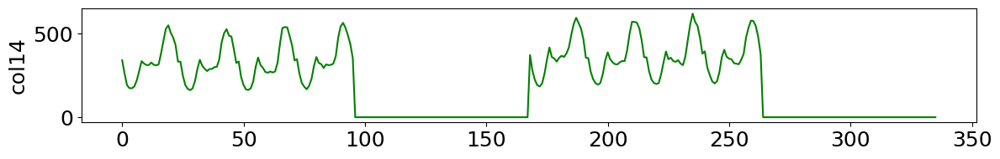

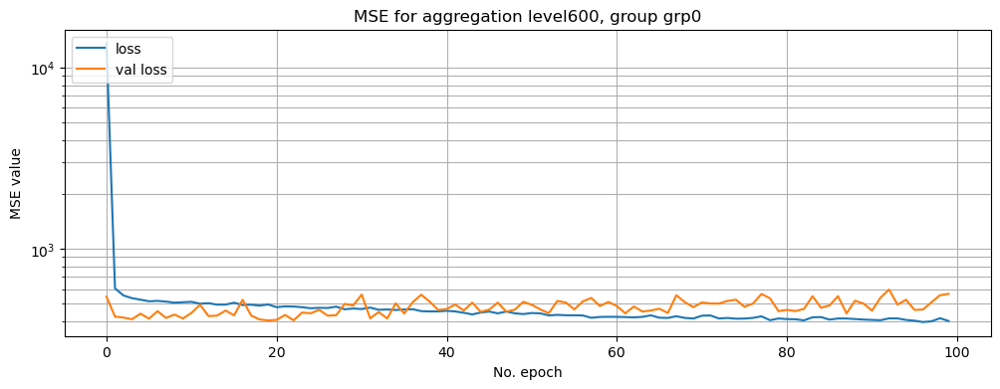

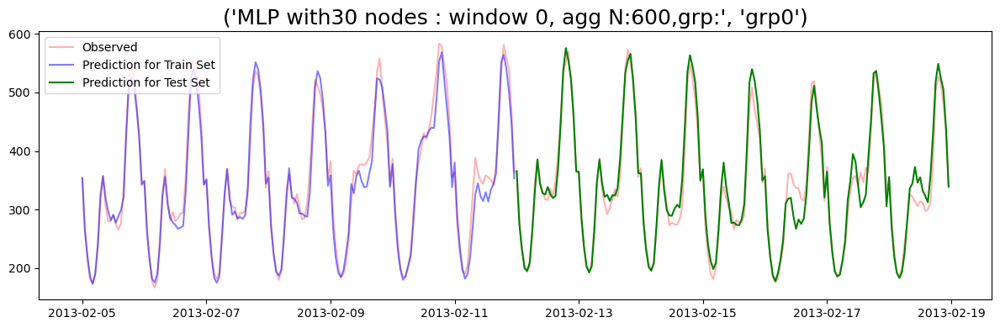

In [385]:
# Run CONFIG4  (MLR style inputs) : # loop through all aggregation levels *** BEST TO DO FULL RUN ON COLAB **


config4_LCL_AggMAPEs=[]
config='Config4'

for i in range(10):
    paramsDict,errorsAggANNtrain_dict,errorsAggANN_dict,annTrainPredict_dict,grpAggLoad_N_dict = \
        runAnnAllAggregations(hourly_df,windows,dayClassifier,envSeries,paramsDict,seriesNamesDefaults,\
                              seriesToExclude,loadFormParams,aggregation_N,annParams,annMLPparams,'MLR',mlrInputTerms=mlrInputTerms)

    resultsDictionaries={'errorsAggANNtrain_dict':errorsAggANNtrain_dict,
                         'errorsAggANN_dict':errorsAggANN_dict,'annTrainPredict_dict':annTrainPredict_dict,
                         'grpAggLoad_N_dict':grpAggLoad_N_dict}       
    
    if aggregation_N == [711]:
        config3_LCL_AggMAPEs.append([resultsDictionaries['errorsAggANNtrain_dict']['711']['MAPEs'].iloc[0,0],\
                                     resultsDictionaries['errorsAggANN_dict']['711']['MAPEs'].iloc[0,0]])
        config3_LCL_AggMAPEs




# save ***CONFIG4*** results
#root='../project_data/intermediateDataLCL/'
#globPrefix='LCL_ANN*'
#saveAnnConfigXresults(paramsDict,root,globPrefix,aggregation_N,annParams['use_Normalization'],resultsDictionaries)



In [ ]:
# download colab results NB - ensure colab website on Chrome downloads safe list (Chrome: settings/Advanced/Downloads )
#!zip -r /content/LCLFiles.zip /content/project_data/intermediateDataLCL

In [ ]:
#from google.colab import files
#files.download("/content/LCLFiles.zip") 

stop Colab run here

#### to get aggregate errors: repeat above BUT :     
a) set aggregation to 711 and run in a loop of 10 , appending to a list - then take avg  (ANN random seed for weights initialization => get slightly different result each time)    
b) comment out the results export

In [ ]:

print(config1_LCL_AggMAPEs)
print(config2_LCL_AggMAPEs)
print(config3_LCL_AggMAPEs)


In [830]:
# compile average of 10 runs at aggregate for each config:
LCL_AggMAPEs_df=pd.DataFrame()

for l,c in zip([config1_LCL_AggMAPEs,config2_LCL_AggMAPEs,config3_LCL_AggMAPEs],['config1','config2','config3']):
    df_ = pd.DataFrame(l,columns=['trainMAPE','testMAPE'])
    df_['config'] = str(c)
    LCL_AggMAPEs_df = pd.concat([LCL_AggMAPEs_df,df_],axis=0)

LCL_AggMAPEs_df.groupby('config').mean()    
#LCL_AggMAPEs_df.groupby('config').std()    


,trainMAPE,testMAPE
config,,
config1,0.050300,0.050472
config2,0.051219,0.048605
config3,0.049236,0.048756


In [234]:
# read in compiled csv of aggregate errors
aggErrors_df = pd.read_csv('../project_data/AggErrorsTable.csv')
aggErrors_df

,Model,Config,LCL Train Error,LCL Test Error,CER Train Error,CER Test Error
0,Persistence t-24,t-24,0.060832,0.058725,0.080366,0.073668
1,Persistence t-168,t-168,0.071213,0.070286,0.063246,0.064144
2,"Unaware,C1",Config1,0.050207,0.047665,0.058337,0.057608
3,"Unaware,C2",Config2,0.050034,0.047655,0.058078,0.057235
4,"Quadratic,C1","Config1,T",0.048936,0.046439,0.057528,0.057861
5,"Quadratic,C2","Config2, T",0.048798,0.046411,0.056719,0.057062
6,"Quadratic,C3","Config3, T&DL",0.048089,0.046817,0.057812,0.059372
7,"Quadratic,C4","Config4, T&DL",0.047951,0.046816,0.057125,0.058510
8,"ANN,C1",Config1,0.050300,0.050472,0.059675,0.063940
9,"ANN,C2",Config2,0.051219,0.048605,0.060122,0.064042


In [235]:
aggErrors_df_Narrow=pd.melt(aggErrors_df.drop(['Config'],axis=1), id_vars=['Model'],  value_name='errors')
#aggErrors_df_Narrow

['Persistence t-24', 'Persistence t-168', 'Unaware,C1', 'Unaware,C2', 'Quadratic,C1', 'Quadratic,C2', 'Quadratic,C3', 'Quadratic,C4', 'ANN,C1', 'ANN,C2', 'ANN,C3']
Index(['LCL Train Error', 'LCL Test Error', 'CER Train Error',
       'CER Test Error'],
      dtype='object') 11
['Persistence t-24', 'Persistence t-168', 'Unaware,C1', 'Unaware,C2', 'Quadratic,C1', 'Quadratic,C2', 'Quadratic,C3', 'Quadratic,C4', 'ANN,C1', 'ANN,C2', 'ANN,C3']


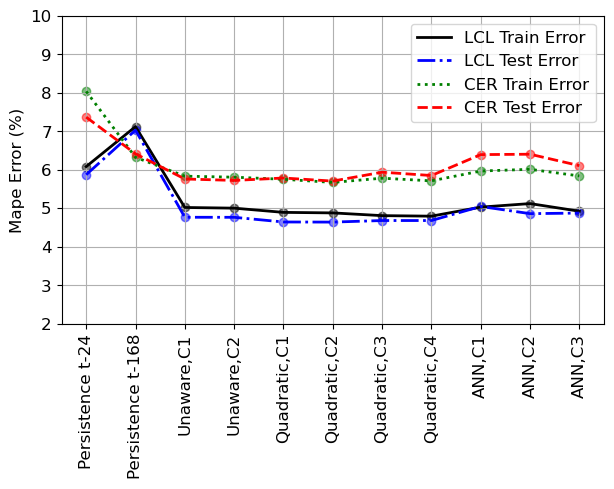

In [240]:
# Plot for report

fig = plt.figure(figsize=(7, 4))
axs = [fig.add_subplot(1,1,i+1) for i in range(1)]
nModels=aggErrors_df['Model'] #.unique()
xOrder = [str(n) for n in nModels]
print(xOrder)

lineCols = myStyles['lineColors']
lineStyles = myStyles['lineStyles']
errorCols=aggErrors_df.columns[2:]
print(errorCols,aggErrors_df.shape[0])

for i, (col) in enumerate(errorCols): 
    axs[0].plot(np.arange(aggErrors_df.shape[0]), aggErrors_df[col] * 100, color=lineCols[i % 6], lw=2, label=col,
             linestyle=lineStyles[i % 4])
    axs[0].scatter(np.arange(aggErrors_df.shape[0]), aggErrors_df[col] * 100, color=lineCols[i % 6], alpha=0.5)

    axs[0].set_xticks(np.arange(aggErrors_df.shape[0]))  # major ticks (by default)

axs[0].set_xticklabels(list(nModels), rotation='vertical')
print(list(nModels))
axs[0].tick_params(axis='both', labelsize=12)
axs[0].legend(ncol=1, fontsize=12, loc='best')

#sns.stripplot(x="Model", y='errors', hue='variable', data=aggErrors_df_Narrow, order=xOrder, ax=axs[1]) #, **stripplot_kwargs)

for ax in axs:
    ax.set_ylabel('Mape Error (%)', fontsize=12)
    ax.grid(which='both')
    #ax.set_xticks(np.array(np.arange(nModels)))
    ax.set_ylim([2,10])


# Now read results for all configs run on colab and plot results


### WARNING: from here down, may have to jump back and forth to get all input files ... cells not necessarily in order!

In [388]:
aggregation_N = [1,3,5,10,20,30,40,50,75,100]  # set aggregation levels as used in colab runs

# make categorical axis categories for swarmplots
order = [str(n) for n in aggregation_N]

For each configuration run:
1. retrieve error dictionary
2. flip dictionary nestings
3. get error percentiles and store
4. plot boxplot/swarm plot
5. plot percentiles on separate plot - combine e.g. different configs, LCL v IRL, MLR v ANN, noise level?
6. Repeat for eache errror type? 

In [389]:
sns.set_palette("tab10")  # default matplotlib color palette 
#sns.set_palette("deep")

### Box & swarm plot of ANN errors for all aggregations and configurations

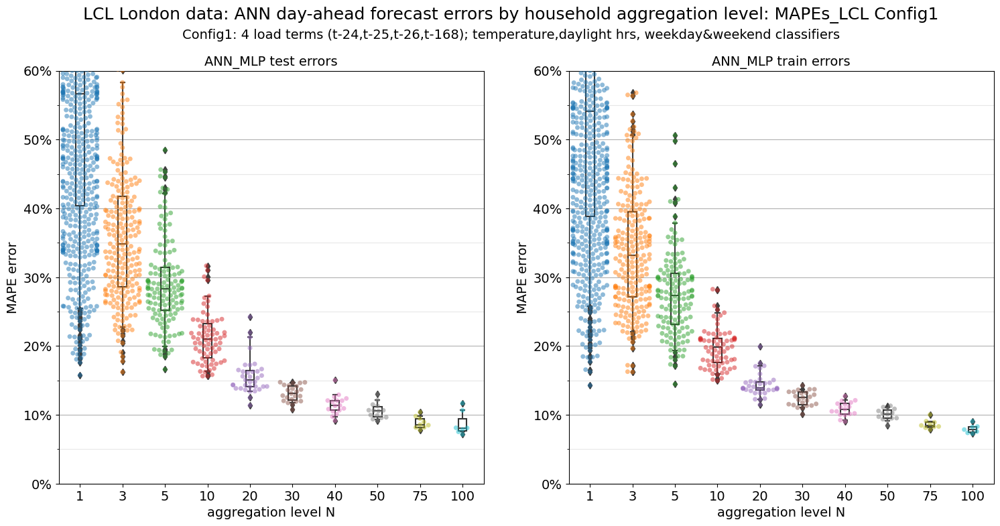

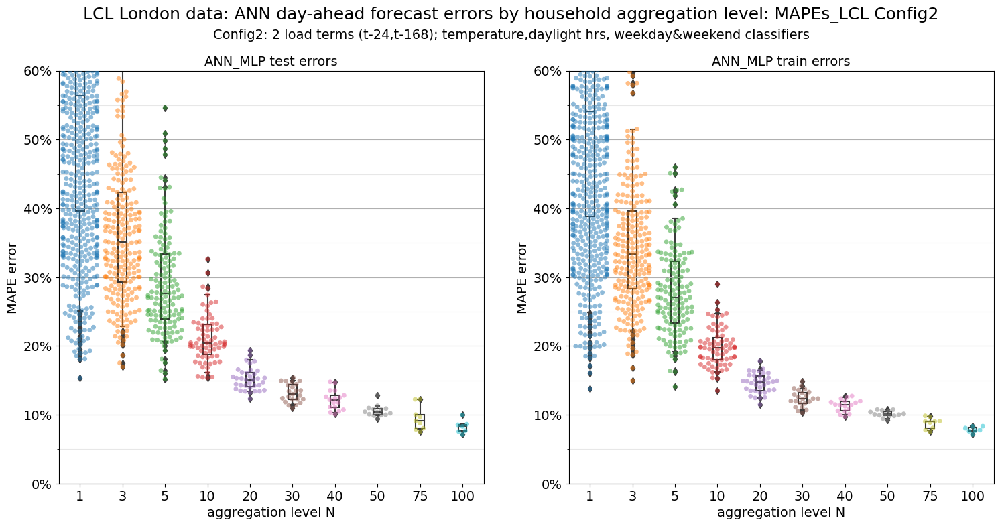

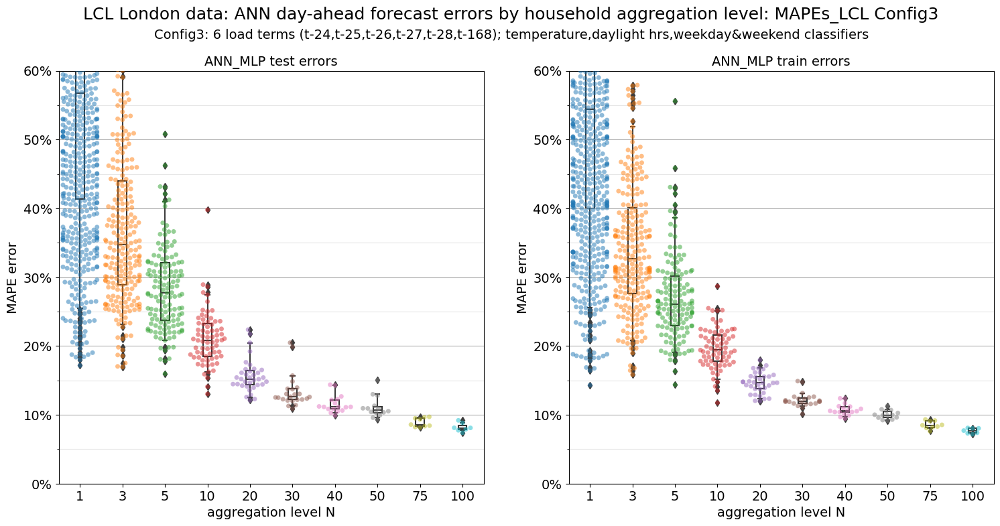

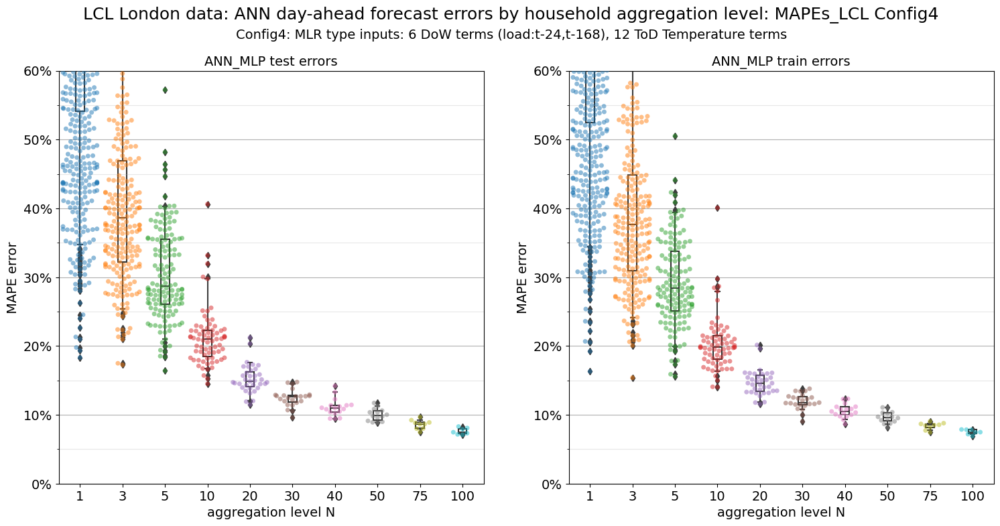

In [390]:
# plot results for all configurations where ANN forecast run for various aggregations

#config1 (load: t-24,t-25,t-26,t-168;           temperature, daylight hrs, weekday/weekend classifier)
#config2 (load: t-24,t-168;                     temperature, daylight hrs, weekday/weekend classifier)
#config3 (load: t-24,t-25,t-26,t-27,t-28,t-168; temperature, daylight hrs, weekday/weekend classifier)
#config4 (MLR input terms w/ linear and quadratic dependency on [load: t-24,t-168; temperature, weekday/weekend classifier)]

# set filenames,paths,plot titles etc to use:
figTitleBase = 'LCL London data: ANN day-ahead forecast errors by household aggregation level: '
#figSaveBase = '../LCL London ANN errors swarm plot '
figSaveBase = 'LCL_ANNerrorsSwarmPlot'

configStrings = ['LCL Config1','LCL Config2','LCL Config3','LCL Config4']

subTitleBases = [\
    'Config1: 4 load terms (t-24,t-25,t-26,t-168); temperature,daylight hrs, weekday&weekend classifiers',\
    'Config2: 2 load terms (t-24,t-168); temperature,daylight hrs, weekday&weekend classifiers',\
    'Config3: 6 load terms (t-24,t-25,t-26,t-27,t-28,t-168); temperature,daylight hrs,weekday&weekend classifiers',\
    'Config4: MLR type inputs: 6 DoW terms (load:t-24,t-168), 12 ToD Temperature terms',\
                ]
# agg levels 5 to 100
pathNamesOLD = [\
'../project_data/intermediateDataLCL/LCL_ANN_run12_ALL_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat8/',
'../project_data/intermediateDataLCL/LCL_ANN_run13_ALL_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat6/',
'../project_data/intermediateDataLCL/LCL_ANN_run14_ALL_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat10/',
'../project_data/intermediateDataLCL/LCL_ANN_run15_ALL_HL1_Nodes30_Epochs100_BatchSize32_MLR12Env6DoWTerms/']

#agg levels 1 to 100
pathNames = [\
'../project_data/intermediateDataLCL/LCL_ANN_Config1run16_ALLincl1_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat8/',
'../project_data/intermediateDataLCL/LCL_ANN_Config2run17_ALLincl1_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat6/',
'../project_data/intermediateDataLCL/LCL_ANN_Config3run18_ALLincl1_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat10/',
'../project_data/intermediateDataLCL/LCL_ANN_config4run19_ALLincl1_HL1_Nodes30_Epochs100_BatchSize32_MLR12Env6DoWTerms/']

# if wish to store fig, axes objects for later update
figures = {}
figureAxes={}

for configString,subTitleBase,pathName in zip(configStrings,subTitleBases,pathNames):

    #retrieve errors dictionaries
    errorsAggANNtrain_dict,errorsAggANN_dict = get_errorDictionary(pathName)  #,areaID='LCL'

    #flip nesting to facilitate plotting: output : 
    #    level1 key: errorType, Lev1 values: Dictionary of {level2 key: N, level2 vals: dfs for each N}
    errorsAggANN_flipped      = flip_dictionary(errorsAggANN_dict)
    errorsAggANNtrain_flipped = flip_dictionary(errorsAggANNtrain_dict)

    # merge  train and test errors into one dictionary
    errorsAggANN_flipped_TestTrain = merge_TrainTestErrors(errorsAggANN_flipped,errorsAggANNtrain_flipped)

    #calculate percentiles : 'Ann_MLP train errors' etc are df row index names - don't change!
    df_percentilesTrain = get_error_percentiles(errorsAggANN_flipped_TestTrain, 'ANN_MLP train errors',\
                                percentiles=[5,25,50,75,95])
    df_percentilesTest = get_error_percentiles(errorsAggANN_flipped_TestTrain, 'ANN_MLP test errors',\
                                percentiles=[5,25,50,75,95])
    percentilesDict = {'percentilesTrain':df_percentilesTrain,'percentilesTest':df_percentilesTest}
    percentilesOutFile = pathName+'percentilesDict.pickle'
    with open(percentilesOutFile, 'wb') as f:
        pickle.dump(percentilesDict, f, protocol=pickle.HIGHEST_PROTOCOL)


    # now plot MAPE errors in one figure
    for errorType in ['MAPEs']:        # ['MCVs','MRMSEs']
    #for errorType in ['MRMSEs']:        # ['MCVs','MRMSEs']
        figTitle =figTitleBase +str(errorType)+'_'+ configString
        figSave  = pathName + figSaveBase + str(errorType) +'_'+ configString  
        figures[configString],figureAxes[configString]=\
            sbn_plotErrors_V2(errorsAggANN_flipped_TestTrain[errorType],order,figTitle=figTitle,figSave=figSave,\
                         subTitle=subTitleBase,errorType='MAPE',yLim=[0.0,1.0])


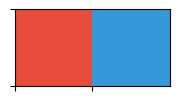

In [392]:
# Create an array with the colors you want to use : see https://xkcd.com/color/rgb/
colors = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
colors = [ "#e74c3c","#3498db"]
sns.palplot(sns.color_palette(colors))

In [393]:
# boxplot plotting aesthetics


#swarmPalette = sns.set_palette("tab10")
swarmPalette = sns.set_palette(sns.color_palette(colors))
customPalette = sns.set_palette(sns.color_palette(colors))
boxprops = {'edgecolor': 'k', 'linewidth': 1,'alpha':0.3}
lineprops = {'color': 'k', 'linewidth': 1}
medianprops = {'color': 'k', 'linewidth': 2}

hue_order = ['ANNtrain','ANNtest']

boxplot_kwargs = {'boxprops': boxprops, 'medianprops': medianprops,
                  'whiskerprops': lineprops, 'capprops': lineprops,
                  'palette': customPalette,'width':0.8,'linewidth':None,'hue_order': hue_order}

stripplot_kwargs = {'linewidth': 0.0, 'size': 2, 'alpha': 0.3,'palette': swarmPalette, 'hue_order': hue_order,'dodge':True}
swarmplot_kwargs = {'linewidth': 0.0, 'size': 2, 'alpha': 0.3,'palette': swarmPalette, 'hue_order': hue_order,'dodge':True}
#seaborn.swarmplot(x=None, y=None, hue=None, data=None, order=None, hue_order=None, dodge=False, orient=None, color=None, palette=None, size=5, edgecolor='gray', linewidth=0, ax=None, **kwargs)

# set fontsizes etc for plotting 
plt.rcParams["axes.labelsize"] = 12
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)

plt.rcParams.update({'legend.fontsize':10}) 
plt.rcParams.update({'figure.titlesize': 14}) 
plt.rcParams.update({'axes.titlesize':12})  # this is the one being used in sbn_ErrorsAllModels


LCL ANN forecast errors by household aggregation levelMAPEs_LCL Config2 

modelsList: Index(['ANNtest', 'ANNtrain'], dtype='object')
return types: <class 'pandas.core.frame.DataFrame'>,<class 'pandas.core.frame.DataFrame'>


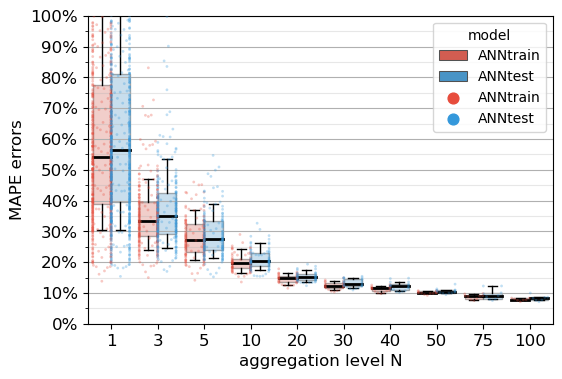

In [394]:
# instead plot as a SINGLE BOXPLOT using hue to show train v test errors (LCL)
# NB need to run cells above (swarm plot etc) first to generate required inputs

for configString,subTitleBase,pathName in zip(configStrings,subTitleBases,pathNames):
#for configString,subTitleBase,pathName in [[configStrings[1]],[subTitleBases[1]],[pathNames[1]]:
    #retrieve errors dictionaries
    errorsAggANNtrain_dict,errorsAggANN_dict = get_errorDictionary(pathName)  #,areaID='LCL'

    #flip nesting to facilitate plotting
    errorsAggANN_flipped      = flip_dictionary(errorsAggANN_dict)
    errorsAggANNtrain_flipped = flip_dictionary(errorsAggANNtrain_dict)
    
    #Rename df index to give different names to train and test df indices (both 'ANN_MLP') 
    tmpDict={}
    test_d={}
    for (k,v) in errorsAggANN_flipped[errorType].items():
        v.rename(index={'ANN_MLP': 'ANNtest'}, inplace=True)
        #print(k,v.head())
        tmpDict[k]=v
    test_d[errorType]=tmpDict

    tmpDict={}
    train_d={}    
    for (k,v) in errorsAggANNtrain_flipped[errorType].items():
        v.rename(index={'ANN_MLP': 'ANNtrain'}, inplace=True)
        #print(k,v.head())
        tmpDict[k]=v
    train_d[errorType]=tmpDict
        
    figTitleBase = 'LCL ANN forecast errors by household aggregation level'
    figSaveBase = 'LCL_ANNerrorsBoxPlot'

    figTitle =figTitleBase +str(errorType)+'_'+ configString
    figSave  = pathName + figSaveBase + str(errorType) +'_'+ configString  

    if configString == 'LCL Config2':
        print(figTitle,"\n")
        sbn_ErrorsAllModels(train_d,test_d,order,figTitle=None,figSave=figSave,errorType=errorType,\
                        dropFromPlot=[],yLim=[0.0,1.0],boxplot_kwargs=boxplot_kwargs,subPlotSize=[6,4],\
                        swarmplot_kwargs=swarmplot_kwargs)  #stripplot_kwargs=stripplot_kwargs) #

In [396]:
## TESTING - adding to existing figure 

updatedFig={}
updatedAxs={}
for configString,subTitleBase,pathName in zip(['LCL Config4'],
                                              [ 'Config4: MLR type inputs: 6 DoW terms (load:t-24,t-168), 12 ToD Temperature terms'],
                                              ['../project_data/intermediateDataLCL/LCL_ANN_config4run19_ALLincl1_HL1_Nodes30_Epochs100_BatchSize32_MLR12Env6DoWTerms/']):

    #retrieve errors dictionaries
    errorsAggANNtrain_dict,errorsAggANN_dict = get_errorDictionary(pathName)  #,areaID='LCL'

    #flip nesting to facilitate plotting
    errorsAggANN_flipped      = flip_dictionary(errorsAggANN_dict)
    errorsAggANNtrain_flipped = flip_dictionary(errorsAggANNtrain_dict)

    # merge  train and test errors into one dictionary
    errorsAggANN_flipped_TestTrain = merge_TrainTestErrors(errorsAggANN_flipped,errorsAggANNtrain_flipped)
    
    # now plot MAPE errors in one figure
    for errorType in ['MAPEs']:        # ['MCVs','MRMSEs']
        figTitle =figTitleBase +str(errorType)+'_'+ configString

        updatedFig['config4'],updatedAxs['config4'] = sbn_plotErrors_V2(errorsAggANN_flipped_TestTrain[errorType],order,figTitle=figTitle,figSave=None,\
                         subTitle=subTitleBase,errorType='MAPE',inputFig=figures['LCL Config4'],inputAxes=figureAxes['LCL Config4'])
#updatedFig['config4']

In [397]:
errorsAggANN_flipped_TestTrain['MAPEs']['100'].T

,ANN_MLP test errors,ANN_MLP train errors
grp0,0.080800,0.078252
grp1,0.078930,0.078662
grp2,0.074695,0.074796
grp3,0.073225,0.074609
grp4,0.082956,0.078384
grp5,0.071540,0.069174
grp6,0.070920,0.071881


# plot  PERCENTILEs for allconfigs on same plots :
Combine MLR and ANN results here :    
1) compare LCL ANN v MLR errors       
2) compare LCL ANN v CER ANN errors      
3) compare LCL ANN v CER MLR errors       

In [449]:
sns.set_style("whitegrid")  # white background, greyt grid lines

# set fontsizes etc for plotting 
plt.rcParams["axes.labelsize"] = 16
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)

plt.rcParams.update({'legend.fontsize':12}) 
plt.rcParams.update({'figure.titlesize': 14}) # fig title
plt.rcParams.update({'axes.titlesize':12})  # subplot title

#print(plt.rcParams)

# 1: compare LCL ANN v MLR results

In [399]:


# Step1: fill dictSet with percentile dfs 
# set config strings and pathNames again IN CASE wish to change e.g. add MLR results, IRL comparisons etc

#configStrings = ['LCL Config1','LCL Config2','LCL Config3','LCL Config4']
#configStrings = ['LCL Config1 old','LCL Config2 old','LCL Config3 old','LCL Config4 old']+['LCL Config1','LCL Config2','LCL Config3','LCL Config4']
configStrings = ['LCL Config1','LCL Config2','LCL Config3','LCL Config4']
mlrConfigStrings=['LCL MLR Config1','LCL MLR Config2','LCL MLR Config3','LCL MLR Config4']

pathNamesOLD = [\
'../project_data/intermediateDataLCL/LCL_ANN_run12_ALL_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat8/',
'../project_data/intermediateDataLCL/LCL_ANN_run13_ALL_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat6/',
'../project_data/intermediateDataLCL/LCL_ANN_run14_ALL_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat10/',
'../project_data/intermediateDataLCL/LCL_ANN_run15_ALL_HL1_Nodes30_Epochs100_BatchSize32_MLR12Env6DoWTerms/']

pathNames = [\
'../project_data/intermediateDataLCL/LCL_ANN_Config1run16_ALLincl1_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat8/',
'../project_data/intermediateDataLCL/LCL_ANN_Config2run17_ALLincl1_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat6/',
'../project_data/intermediateDataLCL/LCL_ANN_Config3run18_ALLincl1_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat10/',
'../project_data/intermediateDataLCL/LCL_ANN_config4run19_ALLincl1_HL1_Nodes30_Epochs100_BatchSize32_MLR12Env6DoWTerms/']

mlrPathNames = [
    '../project_data/intermediateDataLCL/LCL_MLR_MLRconfig1run10_ALLincl1_12envTerms_6DoWterms/',
    '../project_data/intermediateDataLCL/LCL_MLR_MLRconfig2run11_ALLincl1_12envTerms_10DoWterms/',
    '../project_data/intermediateDataLCL/LCL_MLR_MLRconfig3run12_ALLincl1_18envTerms_6DoWterms/',
    '../project_data/intermediateDataLCL/LCL_MLR_MLRconfig4run13_ALLincl1_18envTerms_10DoWterms/']

#labels for plotting: may have to truncate - as all go into each subplot..(subplot for test and train)
oldLabels = [\
        'LCL ANN Config1: OLD (4 loads,temp,daylight,dowClasses)',
        'LCL ANN Config2: OLD (t-24,t-168,temp,daylight,dowClasses)',
        'LCL ANN Config3: OLD (6 loads,temp,daylight,dowClasses)',
        'LCL ANN Config4: OLD MLRinputs 6 load/dow +12 temp terms']

labels= ['LCL ANN Config1: (4 loads,temp,daylight,dowClasses)',
        'LCL ANN Config2: (t-24,t-168,temp,daylight,dowClasses)',
        'LCL ANN Config3: (6 loads,temp,daylight,dowClasses)',
        'LCL ANN Config4: MLRinputs 6 load/dow +12 temp terms']

mlrLabels = [\
    'MLR Config1:  6 DoW terms; 12 env terms (temp)',\
    'MLR Config2: 10 DoW terms; 12 env terms (temp)',\
    'MLR Config3:  6 DoW terms; 18 env terms (temp + daylight)',\
    'MLR Config4: 10 DoW terms; 18 env terms (temp + daylight)']

#combine lists 
configStrings=configStrings+mlrConfigStrings
#pathNames = pathNamesOLD + pathNames
pathNames = pathNames + mlrPathNames 
labels=labels+mlrLabels

#reset to what want to plot
#configStrings = configStrings[4:]
#pathNames = mlrPathNames
#labels=labels[4:]

# create empty dictionary set to be populated with percentile dictionary for each config
dictSet = {}
for c in configStrings:
    dictSet[c]={}

for i,(path,config) in enumerate(zip(pathNames,configStrings)):
    #print(path+'percentilesDict.pickle')
    with open(path+'percentilesDict.pickle', 'rb') as f:
        dictSet[config] = pickle.load(f)
        
#save with unique name:
dictSet_LCL_ANNvMLR = dictSet

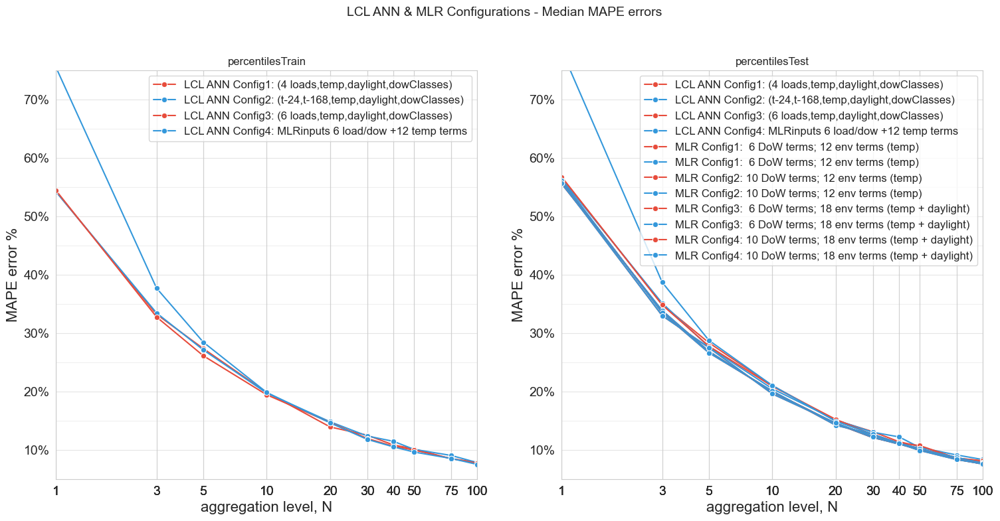

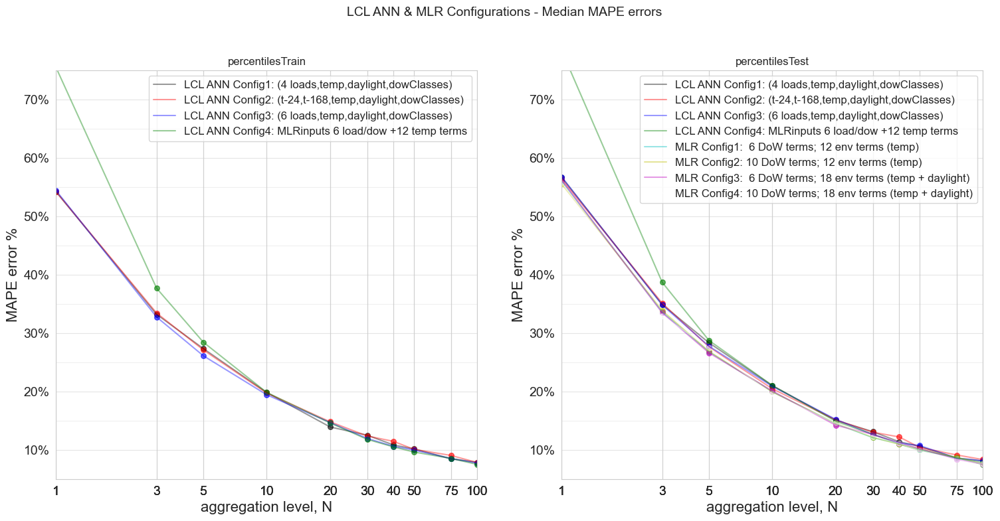

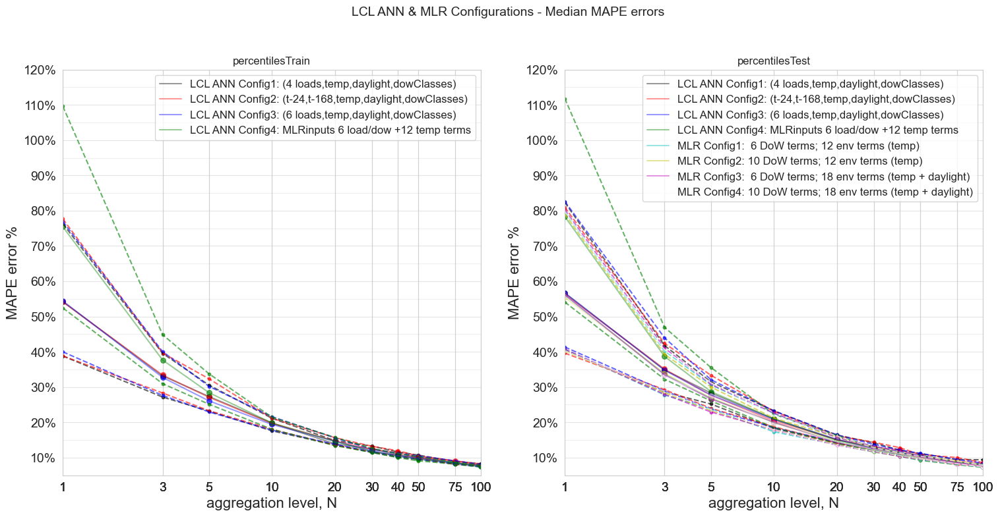

In [400]:
# plot percentiles for all Configs in above cell

#1st version: plot median percentiles using seaborn
plot_percentileTraces(dictSet_LCL_ANNvMLR,order,'sns',errorType='MAPEs',styles=None,figure=None,axs=None,\
                      percSupressList=[5,25,75,95],labels=labels,yLim=[0.05,0.75],\
                      figTitle='LCL ANN & MLR Configurations - Median MAPE errors',subTitle=None);

# 2nd version without 'sns'  : BEST
plot_percentileTraces(dictSet_LCL_ANNvMLR,order,errorType='MAPEs',styles=None,figure=None,axs=None,\
                      percSupressList=[5,25,75,95],labels=labels,yLim=[0.05,0.75],\
                      figTitle='LCL ANN & MLR Configurations - Median MAPE errors',subTitle=None);

# 3rd version without 'sns' and showing 25,50,75% percentiles
plot_percentileTraces(dictSet_LCL_ANNvMLR,order,errorType='MAPEs',styles=None,figure=None,axs=None,\
                      percSupressList=[5,95],labels=labels,yLim=[0.05,1.2],\
                      figTitle='LCL ANN & MLR Configurations - Median MAPE errors',subTitle=None);

#### compare specific configs: LCL ANN Config1 v LCL MLR Config4 

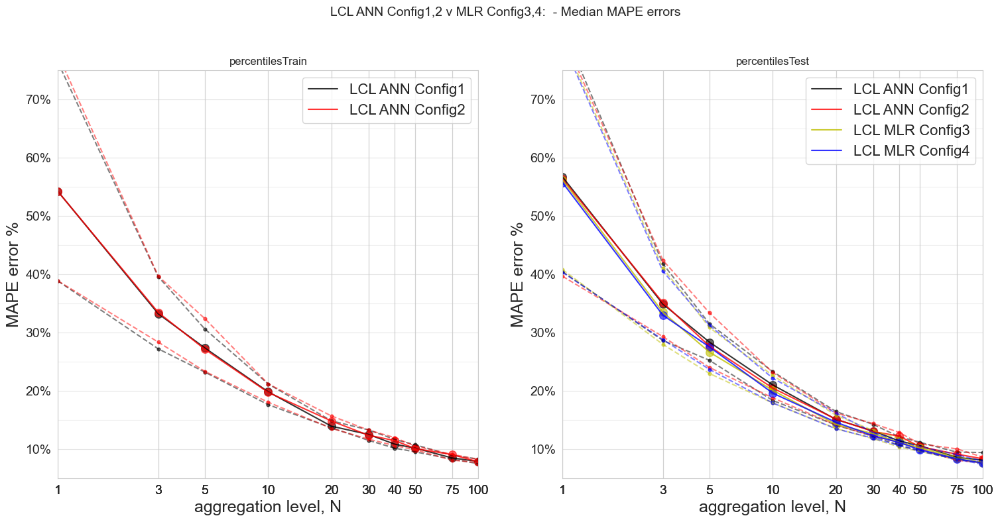

In [401]:
dictSet = dictSet_LCL_ANNvMLR
dictSubSet = dict((k,dictSet[k]) for k in ('LCL Config1','LCL Config2','LCL MLR Config3','LCL MLR Config4'))
labels= ['LCL ANN Config1','LCL ANN Config2','LCL MLR Config3','LCL MLR Config4'] 

plt.rcParams.update({'legend.fontsize':16}) 
plt.rcParams["axes.labelsize"] = 18

styles = {'lSty': ['dashdot', 'dotted', 'dashed', 'solid'],
          'lAlpha': [0.3, 0.3, 0.5, 0.8],
          'symS': [7, 7, 12, 70]}

# version without 'sns' and showing 25,50,75% percentiles

# version without 'sns' and showing 25,50,75% percentiles
plot_percentileTraces(dictSubSet,order,errorType='MAPEs',styles=styles,figure=None,axs=None,\
                      percSupressList=[5,95],labels=labels,yLim=[0.05,0.75],\
                      figTitle='LCL ANN Config1,2 v MLR Config3,4:  - Median MAPE errors',subTitle=None,colset=['k','r','y','b']);



# 2.  compare LCL and Ireland ANN results

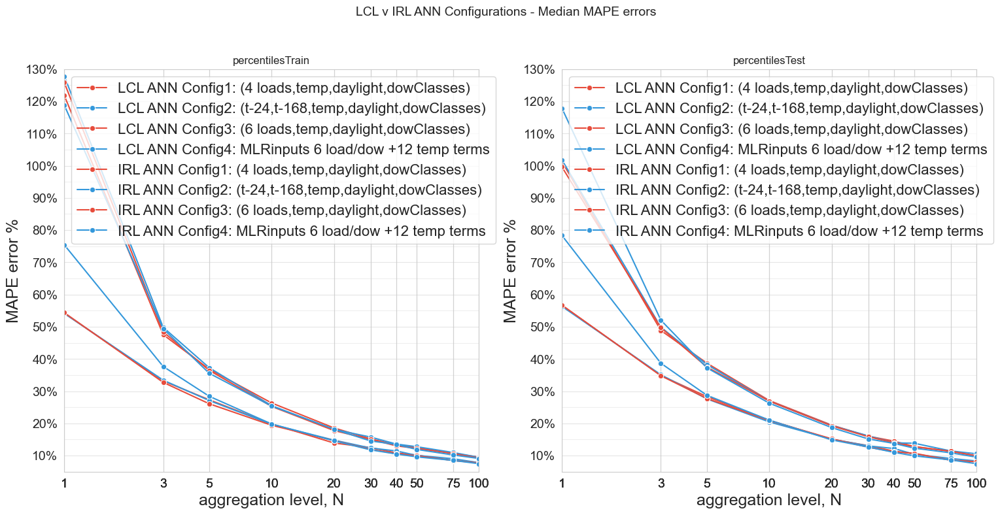

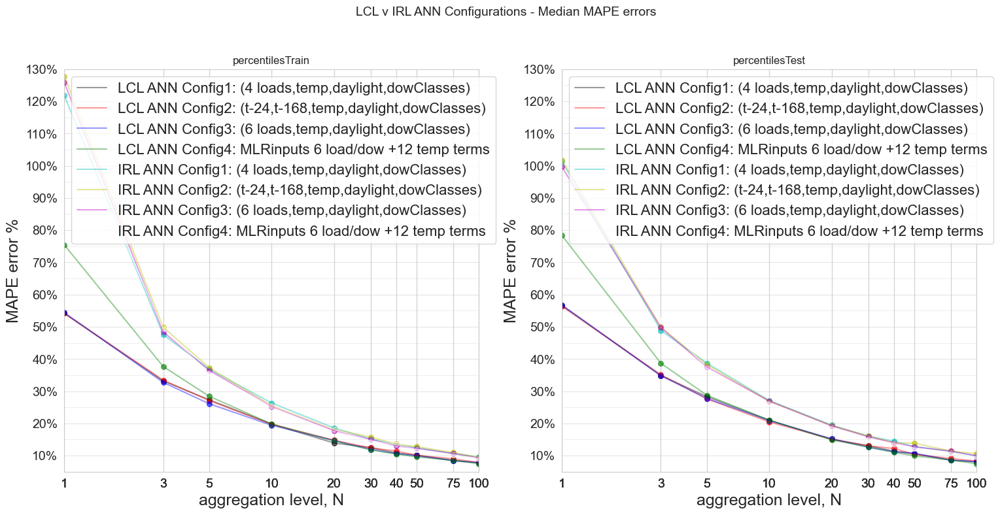

In [402]:


configStrings = ['LCL Config1','LCL Config2','LCL Config3','LCL Config4']
configStringsIRL = ['CER Config1','CER Config2','CER Config3','CER Config4']

pathNames = [\
'../project_data/intermediateDataLCL/LCL_ANN_Config1run16_ALLincl1_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat8/',
'../project_data/intermediateDataLCL/LCL_ANN_Config2run17_ALLincl1_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat6/',
'../project_data/intermediateDataLCL/LCL_ANN_Config3run18_ALLincl1_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat10/',
'../project_data/intermediateDataLCL/LCL_ANN_config4run19_ALLincl1_HL1_Nodes30_Epochs100_BatchSize32_MLR12Env6DoWTerms/']

pathNamesIRL = [\
'../project_data/intermediateDataIreland/IRL_ANN_config1run5_ALLincl1_Normalised_HL2_Nodes20_Epochs100_BatchSize32_nFeat8/',
'../project_data/intermediateDataIreland/IRL_ANN_config2run6_ALLincl1_Normalised_HL2_Nodes20_Epochs100_BatchSize32_nFeat6/',
'../project_data/intermediateDataIreland/IRL_ANN_config3run7_ALLincl1_Normalised_HL2_Nodes20_Epochs100_BatchSize32_nFeat10/',
'../project_data/intermediateDataIreland/IRL_ANN_config4run8_ALLincl1_HL1_Nodes30_Epochs100_BatchSize32_MLR12Env6DoWTerms/']

#labels for plotting: may have to truncate - as all go into each subplot..(subplot for test and train)
labels= ['LCL ANN Config1: (4 loads,temp,daylight,dowClasses)',
        'LCL ANN Config2: (t-24,t-168,temp,daylight,dowClasses)',
        'LCL ANN Config3: (6 loads,temp,daylight,dowClasses)',
        'LCL ANN Config4: MLRinputs 6 load/dow +12 temp terms']
labelsIRL= ['IRL ANN Config1: (4 loads,temp,daylight,dowClasses)',
        'IRL ANN Config2: (t-24,t-168,temp,daylight,dowClasses)',
        'IRL ANN Config3: (6 loads,temp,daylight,dowClasses)',
        'IRL ANN Config4: MLRinputs 6 load/dow +12 temp terms']

# now combine as wish to plot:

configStrings = configStrings+configStringsIRL
#mlrConfigStrings=mlrConfigStrings+mlrConfigStringsIRL
pathNames = pathNames + pathNamesIRL 
labels=labels+labelsIRL

# create empty dictionary set to be populated with percentile dictionary for each config
dictSet = {}
for c in configStrings:
    dictSet[c]={}

for i,(path,config) in enumerate(zip(pathNames,configStrings)):
    #print(path+'percentilesDict.pickle')
    with open(path+'percentilesDict.pickle', 'rb') as f:
        dictSet[config] = pickle.load(f)
        
#save with unique name:
dictSet_LCLvIRL_ANN = dictSet

# plot median percentiles using seaborn
plot_percentileTraces(dictSet_LCLvIRL_ANN,order,'sns',errorType='MAPEs',styles=None,figure=None,axs=None,\
                      percSupressList=[5,25,75,95],labels=labels,yLim=[0.05,1.30],\
                      figTitle='LCL v IRL ANN Configurations - Median MAPE errors',subTitle=None);
# plot median percentiles using matplotlib
plot_percentileTraces(dictSet_LCLvIRL_ANN,order,errorType='MAPEs',styles=None,figure=None,axs=None,\
                      percSupressList=[5,25,75,95],labels=labels,yLim=[0.05,1.30],\
                      figTitle='LCL v IRL ANN Configurations - Median MAPE errors',subTitle=None);


# 3. compare LCL v IRL MLR results

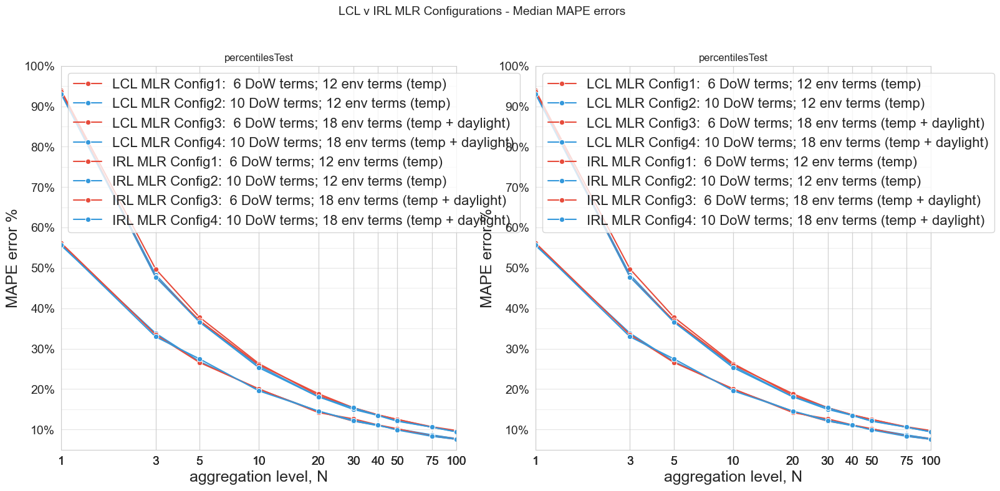

In [403]:

mlrConfigStrings=['LCL MLR Config1','LCL MLR Config2','LCL MLR Config3','LCL MLR Config4']
mlrConfigStringsIRL = ['CER MLR Config1','CER MLR Config2','CER MLR Config3','CER MLR Config4']

mlrPathNames = [
    '../project_data/intermediateDataLCL/LCL_MLR_MLRconfig1run10_ALLincl1_12envTerms_6DoWterms/',
    '../project_data/intermediateDataLCL/LCL_MLR_MLRconfig2run11_ALLincl1_12envTerms_10DoWterms/',
    '../project_data/intermediateDataLCL/LCL_MLR_MLRconfig3run12_ALLincl1_18envTerms_6DoWterms/',
    '../project_data/intermediateDataLCL/LCL_MLR_MLRconfig4run13_ALLincl1_18envTerms_10DoWterms/']
mlrPathNamesIRL = [\
'../project_data/intermediateDataIreland/IRL_MLR_MLRconfig1run1_ALLincl1_12envTerms_6DoWterms/',
'../project_data/intermediateDataIreland/IRL_MLR_MLRconfig2run2_ALLincl1_12envTerms_10DoWterms/',
'../project_data/intermediateDataIreland/IRL_MLR_MLRconfig3run3_ALLincl1_18envTerms_6DoWterms/',
'../project_data/intermediateDataIreland/IRL_MLR_MLRconfig4run4_ALLincl1_18envTerms_10DoWterms/']


mlrLabels = [\
    'LCL MLR Config1:  6 DoW terms; 12 env terms (temp)',\
    'LCL MLR Config2: 10 DoW terms; 12 env terms (temp)',\
    'LCL MLR Config3:  6 DoW terms; 18 env terms (temp + daylight)',\
    'LCL MLR Config4: 10 DoW terms; 18 env terms (temp + daylight)']
mlrLabelsIRL = [\
    'IRL MLR Config1:  6 DoW terms; 12 env terms (temp)',\
    'IRL MLR Config2: 10 DoW terms; 12 env terms (temp)',\
    'IRL MLR Config3:  6 DoW terms; 18 env terms (temp + daylight)',\
    'IRL MLR Config4: 10 DoW terms; 18 env terms (temp + daylight)']

mlrConfigStrings=mlrConfigStrings+mlrConfigStringsIRL
pathNames = mlrPathNames + mlrPathNamesIRL 
labels=mlrLabels+mlrLabelsIRL

# create empty dictionary set to be populated with percentile dictionary for each config
dictSet = {}
for c in configStrings:
    dictSet[c]={}

for i,(path,config) in enumerate(zip(pathNames,configStrings)):
    #print(path+'percentilesDict.pickle')
    with open(path+'percentilesDict.pickle', 'rb') as f:
        dictSet[config] = pickle.load(f)
        
#save with unique name:
dictSet_LCLvIRL_MLR = dictSet

# plot percentiles 
plot_percentileTraces(dictSet_LCLvIRL_MLR,order,'sns',errorType='MAPEs',styles=None,figure=None,axs=None,\
                      percSupressList=[5,25,75,95],labels=labels,yLim=[0.05,1.0],\
                      figTitle='LCL v IRL MLR Configurations - Median MAPE errors',subTitle=None);


# 4. compare IRL ANN v MLR results

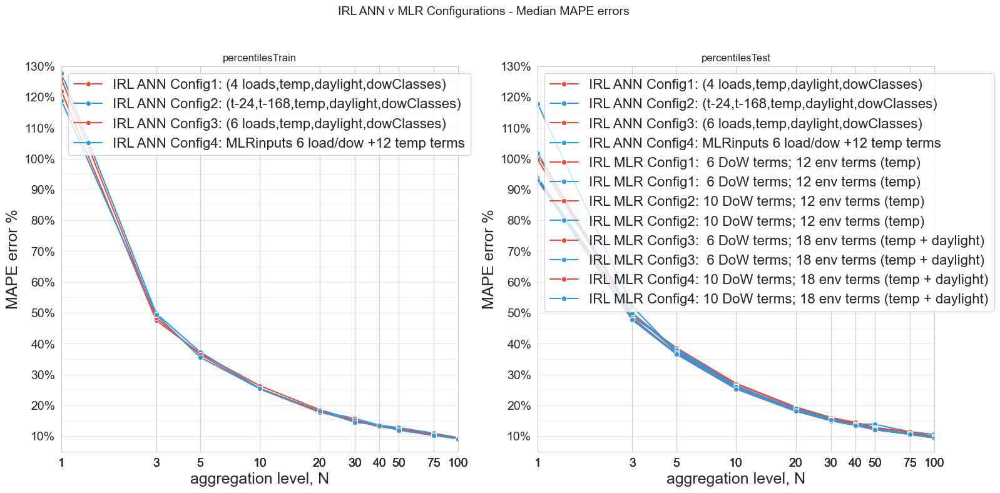

In [404]:
configStringsIRL = ['CER Config1','CER Config2','CER Config3','CER Config4']
mlrConfigStringsIRL = ['CER MLR Config1','CER MLR Config2','CER MLR Config3','CER MLR Config4']

pathNamesIRL = [\
'../project_data/intermediateDataIreland/IRL_ANN_config1run5_ALLincl1_Normalised_HL2_Nodes20_Epochs100_BatchSize32_nFeat8/',
'../project_data/intermediateDataIreland/IRL_ANN_config2run6_ALLincl1_Normalised_HL2_Nodes20_Epochs100_BatchSize32_nFeat6/',
'../project_data/intermediateDataIreland/IRL_ANN_config3run7_ALLincl1_Normalised_HL2_Nodes20_Epochs100_BatchSize32_nFeat10/',
'../project_data/intermediateDataIreland/IRL_ANN_config4run8_ALLincl1_HL1_Nodes30_Epochs100_BatchSize32_MLR12Env6DoWTerms/']

mlrPathNamesIRL = [\
'../project_data/intermediateDataIreland/IRL_MLR_MLRconfig1run1_ALLincl1_12envTerms_6DoWterms/',
'../project_data/intermediateDataIreland/IRL_MLR_MLRconfig2run2_ALLincl1_12envTerms_10DoWterms/',
'../project_data/intermediateDataIreland/IRL_MLR_MLRconfig3run3_ALLincl1_18envTerms_6DoWterms/',
'../project_data/intermediateDataIreland/IRL_MLR_MLRconfig4run4_ALLincl1_18envTerms_10DoWterms/']


labelsIRL= ['IRL ANN Config1: (4 loads,temp,daylight,dowClasses)',
        'IRL ANN Config2: (t-24,t-168,temp,daylight,dowClasses)',
        'IRL ANN Config3: (6 loads,temp,daylight,dowClasses)',
        'IRL ANN Config4: MLRinputs 6 load/dow +12 temp terms']

mlrLabelsIRL = [\
    'IRL MLR Config1:  6 DoW terms; 12 env terms (temp)',\
    'IRL MLR Config2: 10 DoW terms; 12 env terms (temp)',\
    'IRL MLR Config3:  6 DoW terms; 18 env terms (temp + daylight)',\
    'IRL MLR Config4: 10 DoW terms; 18 env terms (temp + daylight)']

#combine lists 
configStrings=configStringsIRL+mlrConfigStringsIRL
pathNames = pathNamesIRL + mlrPathNamesIRL 
labels=labelsIRL+mlrLabelsIRL

# create empty dictionary set to be populated with percentile dictionary for each config
dictSet = {}
for c in configStrings:
    dictSet[c]={}

for i,(path,config) in enumerate(zip(pathNames,configStrings)):
    #print(path+'percentilesDict.pickle')
    with open(path+'percentilesDict.pickle', 'rb') as f:
        dictSet[config] = pickle.load(f)
        
#save with unique name:
dictSet_IRL_ANNvMLR = dictSet


# plot median percentiles using seaborn
plot_percentileTraces(dictSet_IRL_ANNvMLR,order,'sns',errorType='MAPEs',styles=None,figure=None,axs=None,\
                      percSupressList=[5,25,75,95],labels=labels,yLim=[0.05,1.30],\
                      figTitle='IRL ANN v MLR Configurations - Median MAPE errors',subTitle=None);

#### compare specific configs:IRL ANN Config1 v LCL MLR Config4 

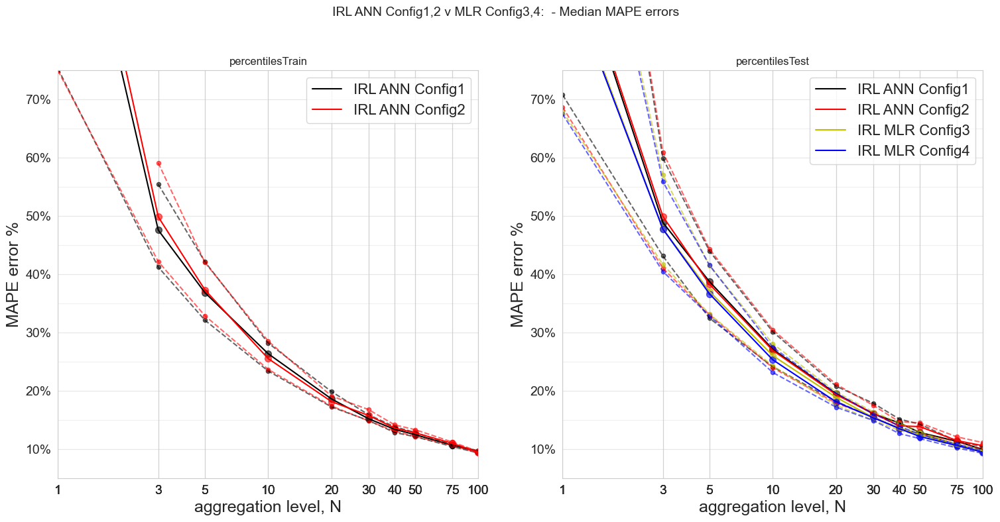

In [405]:
dictSet = dictSet_IRL_ANNvMLR
dictSubSet = dict((k,dictSet[k]) for k in ('CER Config1','CER Config2','CER MLR Config3','CER MLR Config4'))
labels= ['IRL ANN Config1','IRL ANN Config2','IRL MLR Config3','IRL MLR Config4'] 
plt.rcParams.update({'legend.fontsize':16}) 
plt.rcParams["axes.labelsize"] = 18

styles = {'lSty': ['dashdot', 'dotted', 'dashed', 'solid'],
          'lAlpha': [0.3, 0.3, 0.6,1],
          'symS': [7, 7, 20, 50]}

# version without 'sns' and showing 25,50,75% percentiles
plot_percentileTraces(dictSubSet,order,errorType='MAPEs',styles=styles,figure=None,axs=None,\
                      percSupressList=[5,95],labels=labels,yLim=[0.05,0.75],\
                      figTitle='IRL ANN Config1,2 v MLR Config3,4:  - Median MAPE errors',subTitle=None,colset=['k','r','y','b']);

dictionaries of percentiles:      
dictSet_LCLvIRL_ANN     
dictSet_LCL_ANNvMLR      
dictSet_LCLvIRL_MLR       

# try fitting exp. curve to results for LCL and Ireland           
take for  LCL, CER :         
MLR Config 4  v ANN config 1 (t-24,t-25,t-26,t-168, temp, daylight, dow)  OR       
MLR Config 3  v ANN config 2 (t-24,t-168, temp, daylight, dow)

dictionary list (above) :         
dictSet_LCL_ANNvMLR   
dictSet_LCLvIRL_ANN    
dictSet_LCLvIRL_MLR    

In [450]:
# apply function form from Rajagopal 2018 paper (theoretical)
def func2(x, a, b):
    return (np.sqrt(a/(x) + b))

In [451]:
# apply function form from Rajagopal 2018 paper (empirical version)
def func3(x, a, b,c):
    return (np.sqrt((a/(x**c)) + b))

In [453]:
dictSet = dictSet_LCLvIRL_ANN          
errorType = 'MAPEs'
configString = 'LCL Config1'
configStringIRL = 'CER Config1'
percentilesDf = 'percentilesTest'  # select TEST window errors (not TRAIN errors!)

medianMapeANNerrorsLCL_df = dictSet[configString][percentilesDf].loc[errorType][['N','50']]
medianMapeANNerrorsLCL_df.reset_index(drop=True,inplace=True)
print(medianMapeANNerrorsLCL_df)

medianMapeANNerrorsIRL_df = dictSet[configStringIRL][percentilesDf].loc[errorType][['N','50']]
medianMapeANNerrorsIRL_df.reset_index(drop=True,inplace=True)
print(medianMapeANNerrorsIRL_df)


     N        50
0    1  0.566538
1    3  0.348629
2    5  0.283186
3   10  0.209750
4   20  0.150577
5   30  0.130901
6   40  0.113665
7   50  0.105766
8   75  0.085584
9  100  0.080815
     N        50
0    1  1.012607
1    3  0.488499
2    5  0.387009
3   10  0.271012
4   20  0.194664
5   30  0.160306
6   40  0.144699
7   50  0.128191
8   75  0.113181
9  100  0.098916


##### LCL & IRL Ann errors curve fit 

LCL fit params:  [3.20361351e-01 4.71826327e-04 8.75061032e-01]
CER fit params:  [1.00239291 0.00900209 1.23886519]


C:\Users\fmurphy\Miniconda3\envs\fm_ANN\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in sqrt
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\fmurphy\Miniconda3\envs\fm_ANN\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in sqrt
  This is separate from the ipykernel package so we can avoid doing imports until


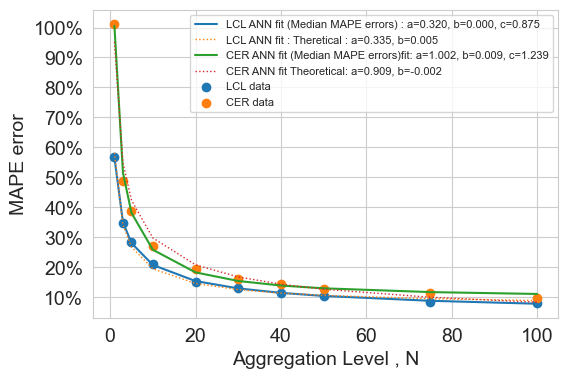

In [454]:
dictSet = dictSet_LCLvIRL_ANN          
errorType = 'MAPEs'
configString = 'LCL Config1'
configStringIRL = 'CER Config1'
percentilesDf = 'percentilesTest'  # select TEST window errors (not TRAIN errors!)


fig = plt.figure(figsize=(6,4))
axs = fig.add_subplot(1,1,1)

#LCL
x_data=dictSet[configString][percentilesDf].loc[errorType]['N'].values  # get x axis ie N values
y_data=dictSet[configString][percentilesDf].loc[errorType]['50'].values # get 50th percentile of error distribution for each N
axs.scatter(x_data, y_data, label='LCL data')

popt, pcov = curve_fit(func3, x_data, y_data)
popt2, pcov2 = curve_fit(func2, x_data, y_data)
print("LCL fit params: ",popt)
fitted_curve = func3(x_data,popt[0],popt[1],popt[2])
fitted_curve2 = func2(x_data,popt2[0],popt2[1])
axs.plot(x_data, fitted_curve,label='LCL ANN fit (Median MAPE errors) : a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt))
axs.plot(x_data, fitted_curve2,label='LCL ANN fit : Theretical : a=%5.3f, b=%5.3f' % tuple(popt2),lw=1,linestyle='dotted')


# IRL 
x_data=dictSet[configStringIRL][percentilesDf].loc[errorType]['N'].values  # get x axis ie N values
y_data=dictSet[configStringIRL][percentilesDf].loc[errorType]['50'].values # get 50th percentile of error distribution for each N
axs.scatter(x_data, y_data,label='CER data')

popt_IRL, pcov_IRL = curve_fit(func3, x_data, y_data)
popt_IRL2, pcov_IRL2 = curve_fit(func2, x_data, y_data)
print("CER fit params: ",popt_IRL)
fitted_curveIRL = func3(x_data,popt_IRL[0],popt_IRL[1],popt_IRL[2])
fitted_curveIRL2 = func2(x_data,popt_IRL2[0],popt_IRL2[1])
axs.plot(x_data, fitted_curveIRL,label='CER ANN fit (Median MAPE errors)fit: a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt_IRL))
axs.plot(x_data, fitted_curveIRL2,label='CER ANN fit Theoretical: a=%5.3f, b=%5.3f' % tuple(popt_IRL2),lw=1,linestyle='dotted')

axs.set_xlabel("Aggregation Level , N",fontsize=14)
axs.set_ylabel("MAPE error",fontsize=14)

axs.yaxis.set_major_locator(MultipleLocator(0.1))
axs.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
axs.yaxis.set_major_formatter(PercentFormatter(1.0))

axs.legend(fontsize=8)


### Now plot error against average load per aggregation level ie avg load of each grp in level N       
#### Read in input files :    This bit reads in ALL INPUTS REQUIRED FURTHER DOWN

LCL: grpAggLoad_N_dictLCL, annTrainPredict_dictLCL, mlrTest_dictLCL, errorsAggLCLallModels       
IRL: grpAggLoad_N_dictIRL, annTrainPredict_dictIRL, mlrTest_dictIRL, errorsAggIRLallModels

In [610]:
# merge errors from MLR and ANN models from dictionaries - same as sbn_ErrosAllModels but no plotting 

def errorsAllModels(MLRerrorsAgg_flipped_error, ANNerrorsAgg_flipped_error,  errorType):

    dfErrors = pd.DataFrame()
    for (k1, v1), (k2, v2) in zip(MLRerrorsAgg_flipped_error[errorType].items(),
                                  ANNerrorsAgg_flipped_error[errorType].items()):
        # print(k1,k2)
        v1 = v1.T
        v2 = v2.T
        v1['N'] = k1
        v1 = pd.concat([v2, v1], axis=1)
        dfErrors = pd.concat([dfErrors, v1], axis=0)

    # convert merged df to long (narrow) form:
    dfErrorsAllModels = pd.melt(dfErrors, id_vars=['N'], var_name='model', value_name='errors')

    modelsList = dfErrors.columns[:-1]
    print("modelsList:", modelsList)

    print("return types: {0},{1}".format(type(dfErrors), type(dfErrorsAllModels)))

    return (dfErrors, dfErrorsAllModels)    # wide and narrow forms of same data



In [611]:
# Get input files LCL

# open saved aggregate group load, userID lists, model forecasts
errorType = 'MAPEs'

pathName = '../project_data/intermediateDataLCL/LCL_ANN_Config2run17_ALLincl1_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat6/'
mlrPathName = '../project_data/intermediateDataLCL/LCL_MLR_MLRconfig3run14_ALLincl1_18envTerms_6DoWterms/'  # now includes saved fc 

# Get Load and Grp/UserID (same grps for ANN and MLR) Dictionary
inputFile = str(pathName) + 'grpAggLoad_N_dict.pickle'
with open(inputFile, 'rb') as pickleFile:
    grpAggLoad_N_dictLCL = pickle.load(pickleFile, encoding='latin-1')

# Get MLR Load and UserID Dictionary  - should now be same as ANN version since I re-ran ANN config2 and MLR config3 for LCL and IRL
#inputFile = str(mlrPathName) + 'grpAggLoad_N_dict.pickle'
#with open(inputFile, 'rb') as pickleFile:
#    mlr_grpAggLoad_N_dictLCL = pickle.load(pickleFile, encoding='latin-1')  # should be the same as ANN one - just verifying

# Get ANN model forecasts
inputFile = str(pathName) + 'annTrainPredict_dict.pickle'
with open(inputFile, 'rb') as pickleFile:
    annTrainPredict_dictLCL = pickle.load(pickleFile, encoding='latin-1')

#Get MLR, Unware and persistance model forecasts
inputFile = str(mlrPathName) + 'mlrTestPredict_dict.pickle'
with open(inputFile, 'rb') as pickleFile:
    mlrTest_dictLCL = pickle.load(pickleFile, encoding='latin-1')
    
#retrieve ANN errors dictionaries and flip nesting (keep only test errors)
errorsAggANNtrain_dict,errorsAggANN_dict = get_errorDictionary(pathName)  #,areaID='LCL'
errorsAggANN_flipped = flip_dictionary(errorsAggANN_dict)

#retrieve MLR errors dictionaries & flip
errorsAgg = get_MLRerrorDictionary(mlrPathName)
errorsAgg_flipped = flip_dictionary(errorsAgg)

errorsAggLCLallModelsWide,errorsAggLCLallModels = errorsAllModels(errorsAgg_flipped, errorsAggANN_flipped, errorType)

modelsList: Index(['ANN_MLP', 'quadratic', 'unAware', 'SN24test', 'SN168test'], dtype='object')
return types: <class 'pandas.core.frame.DataFrame'>,<class 'pandas.core.frame.DataFrame'>


In [612]:

# Get input files Ireland  

# open saved aggregate group load, userID lists, model forecasts
errorType = 'MAPEs'

pathNameIRL = '../project_data/intermediateDataIreland/IRL_ANN_config2run6_ALLincl1_Normalised_HL2_Nodes20_Epochs100_BatchSize32_nFeat6/'
mlrPathNameIRL = '../project_data/intermediateDataIreland/IRL_MLR_MLRconfig3run6_ALLincl1_18envTerms_6DoWterms/'  # now includes saved fc 
    
inputFile = str(pathNameIRL) + 'grpAggLoad_N_dict.pickle'
with open(inputFile, 'rb') as pickleFile:
    grpAggLoad_N_dictIRL = pickle.load(pickleFile, encoding='latin-1')

inputFile = str(pathNameIRL) + 'annTrainPredict_dict.pickle'
with open(inputFile, 'rb') as pickleFile:
    annTrainPredict_dictIRL = pickle.load(pickleFile, encoding='latin-1')
    
inputFile = str(mlrPathNameIRL) + 'mlrTestPredict_dict.pickle'
with open(inputFile, 'rb') as pickleFile:
    mlrTest_dictIRL = pickle.load(pickleFile, encoding='latin-1')
    
#retrieve ANN errors dictionaries and flip nesting (keep only test errors)
errorsAggANNtrain_dict,errorsAggANN_dict = get_errorDictionary(pathNameIRL)  
errorsAggANN_flipped = flip_dictionary(errorsAggANN_dict)

#retrieve MLR errors dictionaries & flip
errorsAgg = get_MLRerrorDictionary(mlrPathNameIRL)
errorsAgg_flipped = flip_dictionary(errorsAgg)

errorsAggIRLallModelsWide,errorsAggIRLallModels = errorsAllModels(errorsAgg_flipped, errorsAggANN_flipped, errorType)

modelsList: Index(['ANN_MLP', 'quadratic', 'unAware', 'SN24test', 'SN168test'], dtype='object')
return types: <class 'pandas.core.frame.DataFrame'>,<class 'pandas.core.frame.DataFrame'>


In [613]:
aggregation_N = [1,3,5,10,20,30,40,50,75,100]  # set aggregation levels as used in colab runs

# make categorical axis categories for swarmplots
order = [str(n) for n in aggregation_N]

In [614]:
# get grp loads for LCL - need to generate medianMapeANNerrorsLCL_df first (above)

grpMeansLCL=[]

for N in aggregation_N:
    wMean = grpAggLoad_N_dictLCL[str(N)]['grpAggLoad_N'].sum(axis=0).mean()  # get mean annual aggregate for each N level in kWh
    w     = grpAggLoad_N_dictLCL[str(N)]['grpAggLoad_N'].sum(axis=0)         # annual aggregate for each N level  - not needed
    wMeanHourly = wMean/(365*24)
    grpMeansLCL.append([N,wMeanHourly*1000])    # convert to Wh and append to list
    print("N: {0}, mean annual Load (kWh) : {1:8.2f}, mean hourly load (kWh): {2:5.2f}".\
          format(N,wMean,wMean/(365*24)))
    #print(w.head(1))

grpMeansLCL_df = pd.concat([pd.DataFrame(grpMeansLCL,columns=['N','grpHourlyMean']),medianMapeANNerrorsLCL_df],axis=1)
grpMeansLCL_df = grpMeansLCL_df.loc[:,~grpMeansLCL_df.columns.duplicated()]
grpMeansLCL_df.columns = ['N','grpHourlyMean_Wh','medianANN_MAPEerror']


#add row for aggregate case (all users) manually :

errorsAgg_df=pd.DataFrame([int(711),1000*aggLoadAnnual/(365*24),0.0484]) 
errorsAgg_df = errorsAgg_df.T
errorsAgg_df.columns = grpMeansLCL_df.columns
errorsAgg_df['grp']='AggregateALL' 
errorsAgg_df.set_index('grp',inplace=True)
#print(errorsAgg_df)
grpMeansLCL_df = pd.concat([grpMeansLCL_df ,errorsAgg_df],axis=0)
grpMeansLCL_df

N: 1, mean annual Load (kWh) :  4272.96, mean hourly load (kWh):  0.49
N: 3, mean annual Load (kWh) : 12818.87, mean hourly load (kWh):  1.46
N: 5, mean annual Load (kWh) : 21354.18, mean hourly load (kWh):  2.44
N: 10, mean annual Load (kWh) : 42738.24, mean hourly load (kWh):  4.88
N: 20, mean annual Load (kWh) : 85631.01, mean hourly load (kWh):  9.78
N: 30, mean annual Load (kWh) : 128385.79, mean hourly load (kWh): 14.66
N: 40, mean annual Load (kWh) : 171469.47, mean hourly load (kWh): 19.57
N: 50, mean annual Load (kWh) : 214120.82, mean hourly load (kWh): 24.44
N: 75, mean annual Load (kWh) : 320062.87, mean hourly load (kWh): 36.54
N: 100, mean annual Load (kWh) : 428595.66, mean hourly load (kWh): 48.93


,N,grpHourlyMean_Wh,medianANN_MAPEerror
0,1.0,487.780393,0.566538
1,3.0,1463.341180,0.348629
2,5.0,2437.692171,0.283186
3,10.0,4878.794191,0.209750
4,20.0,9775.229191,0.150577
5,30.0,14655.912254,0.130901
6,40.0,19574.140182,0.113665
7,50.0,24443.016258,0.105766
8,75.0,36536.857571,0.085584
9,100.0,48926.444715,0.080815


In [615]:
# get grp loads for Ireland
grpMeansIRL = []

for N in aggregation_N:
    wMean = grpAggLoad_N_dictIRL[str(N)]['grpAggLoad_N'].sum(axis=0).mean()
    wMeanHourly = wMean/(365*24)
    grpMeansIRL.append([N,wMeanHourly*1000])    # convert to Wh and append to list
    print("N: {0}, mean annual Load (kWh) : {1:8.2f}, mean hourly load (kWh): {2:5.2f}".\
          format(N,wMean/1000,wMean/(365*24)))
    
grpMeansIRL_df = pd.concat([pd.DataFrame(grpMeansIRL,columns=['N','grpHourlyMean']),medianMapeANNerrorsIRL_df],axis=1)
grpMeansIRL_df = grpMeansIRL_df.loc[:,~grpMeansIRL_df.columns.duplicated()]
grpMeansIRL_df.columns = ['N','grpHourlyMean_Wh','medianANN_MAPEerror']
grpMeansIRL_df

#add row for aggregate case (all users) manually :
aggLoadAnnualIRL = 2992476.4614999997     # kWh : see IRL_ANN_MAIN notebook for calculation
nUsersIRL = 675                           #       see above ref
errorsAgg_df=pd.DataFrame([int(nUsersIRL),1000*aggLoadAnnualIRL/(365*24),0.06088553])   # nUsers, aggLoad/hr mean, ANN agg error
errorsAgg_df = errorsAgg_df.T
errorsAgg_df.columns = grpMeansIRL_df.columns
errorsAgg_df['grp']='AggregateALL' 
errorsAgg_df.set_index('grp',inplace=True)
#print(errorsAgg_df)
grpMeansIRL_df = pd.concat([grpMeansIRL_df ,errorsAgg_df],axis=0)
grpMeansIRL_df


N: 1, mean annual Load (kWh) :     4.43, mean hourly load (kWh):  0.51
N: 3, mean annual Load (kWh) :    13.30, mean hourly load (kWh):  1.52
N: 5, mean annual Load (kWh) :    22.17, mean hourly load (kWh):  2.53
N: 10, mean annual Load (kWh) :    44.30, mean hourly load (kWh):  5.06
N: 20, mean annual Load (kWh) :    89.15, mean hourly load (kWh): 10.18
N: 30, mean annual Load (kWh) :   133.74, mean hourly load (kWh): 15.27
N: 40, mean annual Load (kWh) :   178.10, mean hourly load (kWh): 20.33
N: 50, mean annual Load (kWh) :   221.60, mean hourly load (kWh): 25.30
N: 75, mean annual Load (kWh) :   332.50, mean hourly load (kWh): 37.96
N: 100, mean annual Load (kWh) :   451.18, mean hourly load (kWh): 51.50


,N,grpHourlyMean_Wh,medianANN_MAPEerror
0,1.0,506.084299,1.012607
1,3.0,1518.252898,0.488499
2,5.0,2530.421496,0.387009
3,10.0,5057.450808,0.271012
4,20.0,10176.675801,0.194664
5,30.0,15267.154027,0.160306
6,40.0,20330.762960,0.144699
7,50.0,25297.097221,0.128191
8,75.0,37956.322444,0.113181
9,100.0,51504.086806,0.098916


#### need all dictionaries of loads, forecasts, errors as inputs 

In [616]:
errorsAggLCLallModels  # narrow form df with ALL mape errrors for EVERY model type for N=1 to 100
errorsAggIRLallModels
#grpAggLoad_N_dictIRL

,N,model,errors
0,1,ANN_MLP,0.282836
1,1,ANN_MLP,0.618706
2,1,ANN_MLP,0.675380
3,1,ANN_MLP,0.724028
4,1,ANN_MLP,3.542516
...,...,...,...
6000,100,SN168test,0.115489
6001,100,SN168test,0.109104
6002,100,SN168test,0.106525
6003,100,SN168test,0.105270


# Re-link forecast errors by aggregation groups with group load series and userIds in each group etc

Import forecast data and aggregation groups (aggregated load and userID info) for selecting sample results for plotting - done above

#### now have these files:
LCL: grpAggLoad_N_dictLCL, annTrainPredict_dictLCL, mlrTest_dictLCL, errorsAggLCLallModels       
IRL: grpAggLoad_N_dictIRL, annTrainPredict_dictIRL, mlrTest_dictIRL, errorsAggIRLallModels

In [617]:
# testing regeneration of errors
for (N,v), (N2,v2),(N3,v3) in zip(grpAggLoad_N_dictLCL.items(),mlrTest_dictLCL.items(),annTrainPredict_dictLCL.items()):
    print(N,v.keys(),N2,v2.keys(),N3,v3.keys())
    for (subk,subv),(subk2,subv2),(subk3,subv3) in zip(v.items(),v2.items(),v3.items()):    # issue here subv has 2 keys, subv2 has 4 keys .. so last 2 dfs of subv2 dont get updated
        print(subk,subk2,subk3)
        #print(subk,subv.columns,subk2,subv2.columns,subk3,subv3.columns)
 
# for i,(N2,v2) in enumerate(mlrTest_dictLCL.items()):   # lopp through N values
#    print(N2,v2.keys())
#    for j,(subk2,subv2) in enumerate(v2.items()):      # loop through 4 model dfs
#        print(subk2,subv2.columns)

#loop thro N
#    loop thro grps

1 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 1 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test']) 1 dict_keys(['trainPredictSeries', 'testPredictSeries'])
randIDgrps_N quadraticTest trainPredictSeries
grpAggLoad_N unawareTest testPredictSeries
3 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 3 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test']) 3 dict_keys(['trainPredictSeries', 'testPredictSeries'])
randIDgrps_N quadraticTest trainPredictSeries
grpAggLoad_N unawareTest testPredictSeries
5 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 5 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test']) 5 dict_keys(['trainPredictSeries', 'testPredictSeries'])
randIDgrps_N quadraticTest trainPredictSeries
grpAggLoad_N unawareTest testPredictSeries
10 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 10 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test']) 10 dict_keys(['trainPredictSeries', 'testPredictSeries'])
randIDgrps_N quadraticTest trainPr

In [618]:
# add grp labels to columns of forecast dfs - forgot to add in code (now fixed in LCL_MLR_Main etc)
#LCL data

# need to do 2 lots of itearting through dictionaries due to differing numbers of keys :
# transfer grpID values from grpAggLoad_N_dict to mlrTest_dict

for (N,v), (N2,v2) in zip(grpAggLoad_N_dictLCL.items(),mlrTest_dictLCL.items()):
    print(N,v.keys(),N2,v2.keys())
    for (subk,subv),(subk2,subv2) in zip(v.items(),v2.items()):    # issue here subv has 2 keys, subv2 has 4 keys .. so last 2 dfs of subv2 dont get updated
        #print(subk,subv.columns,subk2,subv2.columns)
        cols=subv.columns
        subv2.columns=cols                   # only quadratic and unaware dfs get updated..
        #print("subk2 (Model):{0} \n Header of v2 model: {1}".format(subk2,subv2.head(1)))

for i,(N2,v2) in enumerate(mlrTest_dictLCL.items()):   # lopp through N values
    print(N2,v2.keys())
    for j,(subk2,subv2) in enumerate(v2.items()):      # loop through 4 model dfs
        #print(subk2,subv2.columns)
        if j==0:
            cols=subv2.columns
        #grpNames_dict[N]=cols
        if j >=2:
            subv2.columns=cols                   # only quadratic and unaware dfs get updated in above section so now update sn24,sn168 col names
        #print("i: {2},j: {3},subk2 (Model):{0} \n Header of v2 model: {1}, len cols {4}".format(subk2,subv2.head(1),i,j,len(cols)))
        #print("Header of subv2 ({0} model) and i,N2 : {1},{2} is \n {3}".format(subk2,i,N2,subv2.head(1)))


1 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 1 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
3 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 3 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
5 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 5 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
10 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 10 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
20 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 20 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
30 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 30 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
40 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 40 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
50 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 50 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
75 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 75 dict

In [619]:
#Irl data

# need to do 2 lots of iterting through dictionaries due to differing numbers of keys :transfer grpID values from grpAggLoad_N_dict to mlrTest_dict

for (N,v), (N2,v2) in zip(grpAggLoad_N_dictIRL.items(),mlrTest_dictIRL.items()):
    print(N,v.keys(),N2,v2.keys())
    for (subk,subv),(subk2,subv2) in zip(v.items(),v2.items()):    # issue here subv has 2 keys, subv2 has 4 keys .. so last 2 dfs of subv2 dont get updated
        #print(subk,subv.columns,subk2,subv2.columns)
        cols=subv.columns
        subv2.columns=cols                   # only quadratic and unaware dfs get updated..
        #print("subk2 (Model):{0} \n Header of v2 model: {1}".format(subk2,subv2.head(1)))

for i,(N2,v2) in enumerate(mlrTest_dictIRL.items()):   # lopp through N values
    print(N2,v2.keys())
    for j,(subk2,subv2) in enumerate(v2.items()):      # loop through 4 model dfs
        #print(subk2,subv2.columns)
        if j==0:
            cols=subv2.columns
        #grpNames_dict[N]=cols
        if j >=2:
            subv2.columns=cols                   # only quadratic and unaware dfs get updated in above section so now update sn24,sn168 col names
        #print("i: {2},j: {3},subk2 (Model):{0} \n Header of v2 model: {1}, len cols {4}".format(subk2,subv2.head(1),i,j,len(cols)))
        #print("Header of subv2 ({0} model) and i,N2 : {1},{2} is \n {3}".format(subk2,i,N2,subv2.head(1)))


1 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 1 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
3 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 3 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
5 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 5 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
10 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 10 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
20 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 20 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
30 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 30 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
40 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 40 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
50 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 50 dict_keys(['quadraticTest', 'unawareTest', 'SN24test', 'SN168test'])
75 dict_keys(['randIDgrps_N', 'grpAggLoad_N']) 75 dict

In [620]:
#mlrTest_dictLCL[str(N)]['quadraticTest']
#mlrTest_dictLCL[str(N)]['unawareTest']
mlrTest_dictLCL[str('3')]['SN24test']
#mlrTest_dictLCL[str(N)]['SN168test']

,grp0,grp1,grp2,grp3,grp4,grp5,grp6,grp7,grp8,grp9,grp10,grp11,grp12,grp13,grp14,grp15,grp16,grp17,grp18,grp19,grp20,grp21,grp22,grp23,grp24,grp25,grp26,grp27,grp28,grp29,grp30,grp31,grp32,grp33,grp34,grp35,grp36,grp37,grp38,grp39,grp40,grp41,grp42,grp43,grp44,grp45,grp46,grp47,grp48,grp49,...,grp187,grp188,grp189,grp190,grp191,grp192,grp193,grp194,grp195,grp196,grp197,grp198,grp199,grp200,grp201,grp202,grp203,grp204,grp205,grp206,grp207,grp208,grp209,grp210,grp211,grp212,grp213,grp214,grp215,grp216,grp217,grp218,grp219,grp220,grp221,grp222,grp223,grp224,grp225,grp226,grp227,grp228,grp229,grp230,grp231,grp232,grp233,grp234,grp235,grp236
2013-02-11 00:00:00,0.853,1.561,1.713,1.156,0.487,0.996,1.039,1.788,0.661,6.458,0.970,0.431,1.907,0.533,0.444,1.310,7.532,0.373,0.452,1.021,6.034,0.659,1.302,10.561,0.801,3.590,2.504,1.172,0.757,1.344,0.760,1.313,1.171,0.837,0.472,0.351,1.784,0.590,1.319,2.486,8.384,2.583,5.846,1.001,0.502,1.661,12.251,5.205,0.679,3.268,...,7.578,1.900,0.732,1.103,1.518,0.313,2.097,1.162,1.268,2.774,1.054,0.321,0.977,4.398,0.378,1.198,0.858,1.015,0.987,1.527,0.990,2.960,2.149,2.043,8.707,0.885,1.053,0.489,2.168,1.352,1.593,0.489,1.026,1.066,2.329,2.139,0.921,0.229,1.539,1.031,0.948,0.623,1.131,1.315,2.335,2.793,0.997,1.908,0.937,0.751
2013-02-11 01:00:00,0.731,1.005,1.114,0.732,0.414,0.794,0.476,1.613,0.573,5.713,0.388,0.321,0.675,0.414,0.333,0.690,7.464,0.249,0.492,0.522,3.724,0.524,0.967,8.826,0.437,1.605,2.400,0.475,0.508,0.530,0.369,1.312,1.075,0.484,0.381,0.304,1.605,0.558,1.094,2.085,5.790,1.048,5.515,0.523,0.475,1.367,10.417,3.769,0.679,3.724,...,6.503,0.732,0.519,1.213,1.487,0.301,2.170,0.945,1.027,1.681,0.931,0.253,0.614,4.404,0.333,1.055,0.851,0.652,1.131,1.732,0.797,2.882,1.935,1.007,8.287,0.645,0.910,0.450,1.734,1.064,1.286,0.429,0.783,0.816,0.948,1.430,0.557,0.238,1.556,0.604,0.822,0.705,1.111,1.555,1.386,0.935,0.816,1.710,0.989,0.674
2013-02-11 02:00:00,0.572,0.936,0.639,0.724,0.396,0.799,0.354,1.566,0.600,4.207,0.353,0.444,0.527,0.430,0.335,0.978,5.781,0.253,0.496,0.461,4.412,0.583,0.671,5.798,0.427,1.052,1.028,0.449,0.635,1.060,0.378,1.038,0.994,0.407,0.423,0.374,1.261,0.335,1.140,1.623,4.858,0.721,5.778,0.427,0.395,1.995,8.385,2.720,0.641,3.151,...,3.680,0.537,0.371,0.909,3.938,0.378,2.453,0.927,0.954,1.541,0.812,0.221,0.755,3.260,0.249,0.994,0.858,0.570,1.185,1.471,0.661,2.509,2.040,0.768,5.318,0.710,0.970,0.430,1.522,0.804,1.027,0.588,0.643,1.227,1.690,1.163,0.631,0.228,1.224,0.513,0.799,0.663,0.589,1.355,1.469,1.023,0.727,1.596,0.986,0.688
2013-02-11 03:00:00,0.484,1.021,0.591,0.662,0.387,0.812,0.332,1.610,0.343,4.288,0.375,0.256,0.562,0.310,0.296,1.398,3.856,0.299,0.469,0.437,2.478,0.404,0.721,1.935,0.483,0.921,0.731,0.457,0.445,1.240,0.310,1.135,0.937,0.465,0.360,0.283,1.145,0.318,0.838,1.619,5.796,0.891,5.414,0.369,0.426,1.214,4.186,2.657,0.856,3.642,...,1.191,0.469,0.305,0.279,2.205,0.294,2.441,0.979,1.098,1.732,0.701,0.310,0.530,3.367,0.215,1.013,0.884,0.381,0.992,1.025,0.569,2.468,1.962,0.841,3.146,0.709,0.960,0.697,1.124,0.634,0.903,0.483,0.696,1.304,1.559,1.038,0.540,0.242,1.268,0.513,0.917,0.612,0.585,1.304,1.418,1.016,0.703,1.428,0.996,0.732
2013-02-11 04:00:00,0.494,0.888,0.573,0.752,0.487,0.804,0.329,1.564,0.322,3.354,1.569,0.328,0.589,0.345,0.317,1.442,0.658,2.339,0.497,0.471,1.194,0.523,0.731,0.792,0.595,0.886,0.687,0.368,0.517,0.475,0.418,1.258,0.944,0.458,0.382,0.342,1.051,0.316,0.687,1.423,4.480,0.782,5.813,0.376,0.428,0.863,3.714,2.629,0.842,3.105,...,1.634,0.464,0.376,0.307,1.276,0.285,2.054,0.949,0.998,1.667,1.025,0.219,0.437,3.439,0.208,0.971,0.873,0.333,0.901,1.072,0.570,2.351,2.186,0.730,1.226,0.586,0.858,0.726,0.906,0.602,0.891,0.470,0.630,1.289,1.169,2.084,0.417,0.243,3.564,0.528,0.700,0.756,0.498,1.379,1.702,1.167,0.768,1.417,0.993,0.758
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

deal with LCL data first ..    


 errorsAggLCLallModelsWide :
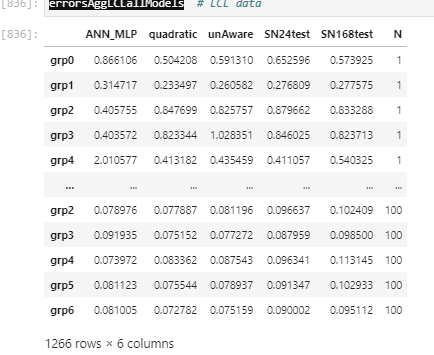

In [621]:
#simpler version - define here for once off use - just get load for grp : for report/ppt

def getLoadByGrp2(N,loadDicts):
    #df_2 = loadDicts[N]['randIDgrps_N']
    #df_2 = df_2.set_index([pd.Index(int(N)*['userID'])])

    # get userID infor for this group from temporary df df_2 above
    #uIDsList = df_2.values.tolist()
    #uIDsList = [val for sublist in uIDsList for val in sublist]
    
    #to get agg load in aggregation grp for selected grp
    load_df = loadDicts[N]['grpAggLoad_N']
   
    return(load_df);


In [622]:
## some plots for report etc - aggregate load examples
aggLoad
df_=pd.DataFrame()
#load_df_ = getLoadByGrp2('100', grpAggLoad_N_dictLCL)
#load_df_100  = load_df_['grp0']
load_df_ = getLoadByGrp2('20', grpAggLoad_N_dictLCL)
load_df_20  = load_df_['grp0']
load_df_ = getLoadByGrp2('1', grpAggLoad_N_dictLCL)
load_df_1  = load_df_['grp5']

for df in (aggLoad,load_df_20,load_df_1):
    df_ = pd.concat([df_,df],axis=1)

df_.columns = ['700','20','1']


df_

,700,20,1
2013-01-01 00:00:00,458.542,19.522,0.292
2013-01-01 01:00:00,379.255,17.080,0.279
2013-01-01 02:00:00,295.068,16.026,0.293
2013-01-01 03:00:00,252.970,13.259,0.297
2013-01-01 04:00:00,230.669,12.846,0.306
...,...,...,...
2013-12-31 19:00:00,637.441,14.767,0.549
2013-12-31 20:00:00,583.995,11.826,0.455
2013-12-31 21:00:00,517.485,15.515,0.505
2013-12-31 22:00:00,479.429,13.190,0.350


In [623]:
plt.rcParams["axes.labelsize"] = 12
plt.rc('legend',fontsize=11) # using a size in points
matplotlib.rc('xtick', labelsize=6) 
matplotlib.rc('ytick', labelsize=6) 
plt.rcParams["legend.framealpha"] = 0.8

In [624]:
# plot load profiles for sample users from each class
startDay=42
smplsPerDay=24
startIndexToPlot=(startDay*smplsPerDay)
nDays=7
labelTitle=''
#plotSectionOfLoadProf(df_, startIndexToPlot, nDays, labelTitle, smplsPerDay)


index data:2013-02-12 00:00:00 hr:0,startTick:1008,Window:[1008, 1176],Length(hrs) 168.0
700
20
1


Text(0.5, 1.0, '')

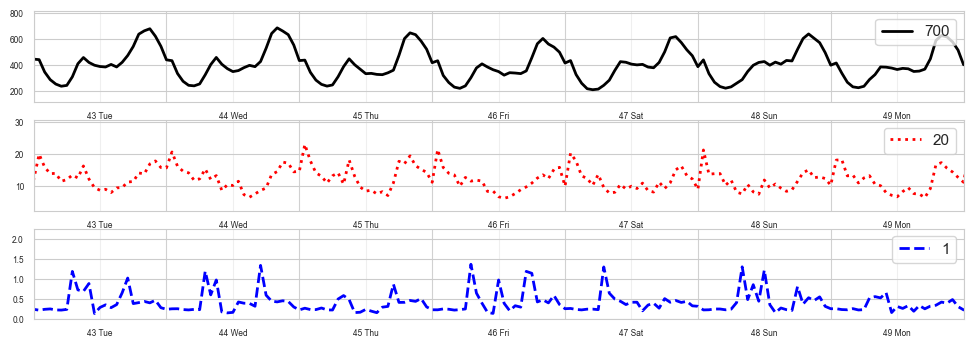

In [625]:
numPlots=3
fig = plt.figure(figsize=(12, 4))
axs = [fig.add_subplot(numPlots, 1, i + 1) for i in range(numPlots)]

lineCols = ['k', 'r', 'b', 'g', 'm', 'y']
lineStyles = ['solid', 'dotted', 'dashed', 'solid']
alpha = [1, 1, 1, 1, 1, 1]
startIndex = startIndexToPlot
timePlot = np.arange(1, df_.shape[0] + 1)  # index series for x axis

window = [startIndex,startIndex + (smplsPerDay * nDays)]  # start and end index on load array eg 1hr or 30min indices
dayLabels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']  # for axis labelling
indexVals = load_df.index  # index = hr in datetime64ns format : generally 1st value will be at midnight
proxys = []  # for legend

# find the first tick  (will be at start of window usually)
for j, ind in enumerate(indexVals):  # counter j, index ind  (tuple)
    if j >= window[0]:
        if ind.hour == 0:
            startTick = 0 + j  # find first midnight in range
            print("index data:{0} hr:{1},startTick:{3},Window:{2},Length(hrs) {4}".format \
                      (ind, ind.hour, window, startTick, (window[1] - window[0]) / (smplsPerDay / 24)))
            break
    else:
        startTick = 0

# plot load profiles in load_df columns
for i,colName in enumerate(df_.columns):
    plotVals = df_[colName].values
    idx = df_.columns.to_list().index(colName)
    l, = axs[i].plot(timePlot, plotVals, color=lineCols[idx % len(lineCols)],
                     linestyle=lineStyles[idx % len(lineStyles)], \
                     lw=2, alpha=alpha[idx % len(alpha)],\
                     label=str(colName))  # returns list of lines representing the plotted data; ',' turns off warning
    proxys.append(l)

    axs[i].set_xlim(window)

    # set tick mark positions and spacing, labels
    axs[i].set_xticks(np.arange(startTick + int(smplsPerDay / 2), window[1] + int(smplsPerDay / 2), smplsPerDay))  # major ticks (by default)
    axs[i].set_xticks(np.arange(startTick, window[1], smplsPerDay), minor=True)
    tickLabs = []
    for ti in np.arange(startTick, window[1], smplsPerDay):
        tickLabs.append(str(indexVals[ti].dayofyear) + ' ' + str(dayLabels[indexVals[ti].dayofweek]))
    axs[i].xaxis.set_minor_locator(
        ticker.MultipleLocator(12))  # minor tick location every 12 hrs (but not shown or labelled)
    axs[i].grid(b=True, which='major', axis='x', alpha=0.3)  # keep v faint grid at 12 noon where ticklabels are
    axs[i].grid(b=True, which='minor', axis='x', alpha=0.9)  # want prominent grid lines at midnight

    axs[i].set_xticklabels(tickLabs)
    print(colName)
    axs[i].legend(ncol=1,loc='upper right')
axs[0].set_title(labelTitle)



In [626]:
#narrow form df with median MAPE errors for all models and N values {1 to 100}
errorsAggLCLallModelsWide

,ANN_MLP,quadratic,unAware,SN24test,SN168test,N
grp0,1.285552,1.402695,1.596610,1.331808,1.603353,1
grp1,1.481329,1.294302,1.445968,1.279943,1.233088,1
grp2,0.783423,0.930937,1.003333,0.960252,0.889885,1
grp3,0.773435,0.502715,0.589300,0.586473,0.584826,1
grp4,0.223133,0.226055,0.236964,0.250504,0.253227,1
...,...,...,...,...,...,...
grp2,0.083133,0.081429,0.083962,0.098449,0.107077,100
grp3,0.071373,0.069897,0.070803,0.079382,0.092292,100
grp4,0.076922,0.072749,0.075980,0.088312,0.098841,100
grp5,0.085387,0.083561,0.084623,0.104595,0.106371,100


In [627]:
# LCL:
# get grp aggregate loads and merge with N and (MAPE) error values 

grpLoad_df=pd.DataFrame()
#errorsAllModels_df = errorsAggLCLallModels  # narrow form df of median errors 
errorsAllModels_df = errorsAggLCLallModelsWide  # wide form df of median errors 


for (N,v) in grpAggLoad_N_dictLCL.items():
    for (subk,subv) in v.items():
        if (subk == 'grpAggLoad_N'):
            #print(N,subk,subv.shape[1])
            load,uIDsList=getLoadByGrp(N,errorsAllModels_df,grpAggLoad_N_dictLCL)
            df_1 = pd.DataFrame(load.sum(axis=0)*1000/(365*24),columns=['grpAggLoad_Wh'])  # load average per hour in Wh
            df_2 = pd.DataFrame(errorsAllModels_df.loc[errorsAllModels_df['N']==str(N)])
            
            df_3 = pd.concat([df_1,df_2],axis=1)
            grpLoad_df = pd.concat([grpLoad_df,df_3],axis=0)
            del (df_1,df_2,df_3)

grpLoadLCL_df = grpLoad_df

# add errors for aggregate case (711 users) manually (see MLR&ANN_errrors.xlsx )
nUsersLCL = 711
print(aggLoadAnnual)   # computed earlier (LCL)
errorList = [1000*aggLoadAnnual/(365*24),0.0484,0.0468,0.0477,0.0587,0.0703,int(nUsersLCL)] # load in Wh, ANN,quadratic,unaware,t-24,t-168 errors  - copied from aggregate runs (MAPE  value for test)
errorsAgg_df=pd.DataFrame(errorList) #,columns=grpLoadLCL_df.columns)
errorsAgg_df = errorsAgg_df.T

print(grpLoadLCL_df.columns)
errorsAgg_df.columns = grpLoadLCL_df.columns
errorsAgg_df['grp']='AggregateALL' #index.rename('Aggregate',inplace=True)
errorsAgg_df.set_index('grp',inplace=True)
grpLoadLCL_df = pd.concat([grpLoadLCL_df ,errorsAgg_df],axis=0)
grpLoadLCL_df

3038071.8909247005
Index(['grpAggLoad_Wh', 'ANN_MLP', 'quadratic', 'unAware', 'SN24test',
       'SN168test', 'N'],
      dtype='object')


,grpAggLoad_Wh,ANN_MLP,quadratic,unAware,SN24test,SN168test,N
grp0,791.626826,1.285552,1.402695,1.596610,1.331808,1.603353,1
grp1,211.163584,1.481329,1.294302,1.445968,1.279943,1.233088,1
grp2,346.381963,0.783423,0.930937,1.003333,0.960252,0.889885,1
grp3,254.051370,0.773435,0.502715,0.589300,0.586473,0.584826,1
grp4,339.544635,0.223133,0.226055,0.236964,0.250504,0.253227,1
...,...,...,...,...,...,...,...
grp3,50279.030479,0.071373,0.069897,0.070803,0.079382,0.092292,100
grp4,51404.870890,0.076922,0.072749,0.075980,0.088312,0.098841,100
grp5,50913.208331,0.085387,0.083561,0.084623,0.104595,0.106371,100
grp6,44210.059359,0.075719,0.072666,0.076581,0.086262,0.098487,100


In [768]:
 grpLoad_df

,grpAggLoad_Wh,ANN_MLP,quadratic,unAware,SN24test,SN168test,N
grp0,709.578596,0.282836,0.318032,0.388459,0.402338,0.388998,1
grp1,662.539840,0.618706,0.587214,0.664573,0.596780,0.602998,1
grp2,642.063699,0.675380,0.692374,0.855098,0.783041,0.684421,1
grp3,896.204509,0.724028,0.628029,0.720777,0.644225,0.666047,1
grp4,283.439783,3.542516,2.832668,3.367636,2.780451,2.516669,1
...,...,...,...,...,...,...,...
grp1,52847.886473,0.100979,0.102029,0.101252,0.121828,0.115489,100
grp2,50646.978482,0.098669,0.097654,0.098640,0.118812,0.109104,100
grp3,51051.592237,0.093468,0.091343,0.092502,0.111814,0.106525,100
grp4,52788.979452,0.117886,0.095129,0.094676,0.114055,0.105270,100


In [629]:
# IRL:
# get grp aggregate loads and merge with N and (MAPE) error values 

grpLoad_df=pd.DataFrame()
errorsAllModels_df = errorsAggIRLallModelsWide  # wide form df of median errors 


for (N,v) in grpAggLoad_N_dictIRL.items():
    for (subk,subv) in v.items():
        if (subk == 'grpAggLoad_N'):
            #print(N,subk,subv.shape[1])
            load,uIDsList=getLoadByGrp(N,errorsAllModels_df,grpAggLoad_N_dictIRL)
            df_1 = pd.DataFrame(load.sum(axis=0)*1000/(365*24),columns=['grpAggLoad_Wh'])  # load average per hour in Wh
            df_2 = pd.DataFrame(errorsAllModels_df.loc[errorsAllModels_df['N']==N])
            #print(df_1.shape,df_2.shape)
            
            df_3 = pd.concat([df_1,df_2],axis=1)
            grpLoad_df = pd.concat([grpLoad_df,df_3],axis=0)
            del (df_1,df_2,df_3)

grpLoadIRL_df = grpLoad_df
#print(grpLoadIRL_df)  


# add errors for aggregate case manually (see MLR&ANN_errrors.xlsx )
errorList = [1000*aggLoadAnnualIRL/(365*24),0.06088553,0.05937248,0.0576,0.0737,0.0641,int(nUsersIRL)] # load in Wh, quadratic,unaware,t-24,t-168,ANN errors 
errorsAgg_df=pd.DataFrame(errorList) #,columns=grpLoadLCL_df.columns)
errorsAgg_df = errorsAgg_df.T
errorsAgg_df.columns = grpLoadIRL_df.columns
errorsAgg_df['grp']='AggregateALL' 
errorsAgg_df.set_index('grp',inplace=True)
#print(errorsAgg_df)
grpLoadIRL_df = pd.concat([grpLoadIRL_df ,errorsAgg_df],axis=0)
grpLoadIRL_df

,grpAggLoad_Wh,ANN_MLP,quadratic,unAware,SN24test,SN168test,N
grp0,709.578596,0.282836,0.318032,0.388459,0.402338,0.388998,1
grp1,662.539840,0.618706,0.587214,0.664573,0.596780,0.602998,1
grp2,642.063699,0.675380,0.692374,0.855098,0.783041,0.684421,1
grp3,896.204509,0.724028,0.628029,0.720777,0.644225,0.666047,1
grp4,283.439783,3.542516,2.832668,3.367636,2.780451,2.516669,1
...,...,...,...,...,...,...,...
grp2,50646.978482,0.098669,0.097654,0.098640,0.118812,0.109104,100
grp3,51051.592237,0.093468,0.091343,0.092502,0.111814,0.106525,100
grp4,52788.979452,0.117886,0.095129,0.094676,0.114055,0.105270,100
grp5,50175.349715,0.110088,0.101124,0.102331,0.126646,0.116168,100


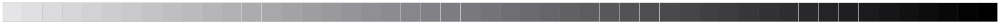

In [630]:
plt.rcParams['legend.scatterpoints']=1
sns.palplot(sns.cubehelix_palette(50, hue=0.05, rot=0, light=0.9, dark=0))

C:\Users\fmurphy\Miniconda3\envs\fm_ANN\lib\site-packages\pandas\core\series.py:679: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


LCL fit params:  [1.65424362e+02 3.60871318e-03]
LCL fit params:  [1.65424362e+02 3.60871318e-03]
IRL fit params:  [4.52941860e+02 4.82944867e-04]


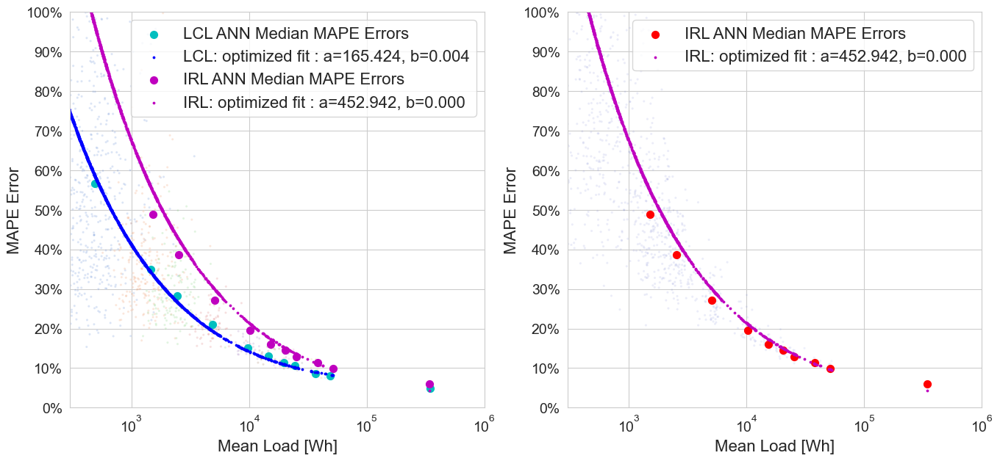

In [631]:
# LCL & IRL Ann errors curve fit  (X = MEAN LOAD FOR AGGREGATION LEVEL in Wh)

# Mean load by N level grps and median ANN errors : grpMeansLCL_df,grpMeansIRL_df
# Load and errors (all models) for all grps :                grpLoadLCL_df; grpLoadIRL_df; 

#popt_RandS2018 = [45**2,1.42**2,0.94]
#popt_theory = [1,0,1]
modelError = 'ANN_MLP'

fig = plt.figure(figsize=(16,7))
axs = [fig.add_subplot(1,2,i+1) for i in range(2)]


#LCL
x_data=grpLoadLCL_df['grpAggLoad_Wh'].values  # get x axis ie agg. load for each grp
y_data=grpLoadLCL_df[modelError].values       # get (MAPE) errors for all aggregation grps


x2 = grpMeansLCL_df['grpHourlyMean_Wh']       # get mean agg load per grp for each N level 
y2 = grpMeansLCL_df['medianANN_MAPEerror']    # get median MAPE ANN error for each N level
#y_data_log = np.log10(y_data)  
sns.scatterplot(x='grpAggLoad_Wh', y=modelError,hue='N',data=grpLoadLCL_df,palette='muted',\
                legend=False, ax=axs[0],s=5,alpha=0.2)   
#axs[0].scatter(x_data, y_data,s=5,label='MAPE errors by Agg. Group',color='g',alpha=0.3)
axs[0].scatter(x2, y2,s=50,label='LCL ANN Median MAPE Errors',color='c')

popt, pcov = curve_fit(func2, x2, y2)
print("LCL fit params: ",popt)
fitted_curve = func2(x_data,popt[0],popt[1]) #,popt[2])
axs[0].scatter(x_data, fitted_curve,label='LCL: optimized fit : a=%5.3f, b=%5.3f' % tuple(popt),s=3,color='b')

#add approx curve from R&S paper
#curveRSpaper = func3(x2,popt_RandS2018[0],popt_RandS2018[1],popt_RandS2018[2])
#axs[0].scatter(x2, curveRSpaper,s=50,label='R&S2018',color='y')
#print(curveRSpaper)

#theoretical = func3(x2,popt_theory[0],popt_theory[1],popt_theory[2])
#axs[0].scatter(x2, theoretical,s=50,label='theory',color='r')
#print(theoretical)

#popt, pcov = curve_fit(func3, x2, y2,bounds=((-np.inf,np.inf), (-np.inf,np.inf), (0.99,1.01)))
print("LCL fit params: ",popt)
#fitted_curve = func3(x_data,popt[0],popt[1],popt[2])
#axs[0].scatter(x_data, fitted_curve,label='LCL: MAPE errors : optimized fit : a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt),s=3,color='b')


# IRL 
x_data=grpLoadIRL_df['grpAggLoad_Wh'].values  # get x axis ie agg. load for each grp
y_data=grpLoadIRL_df[modelError].values       # get (MAPE) errors for all aggregation grps


x2 = grpMeansIRL_df['grpHourlyMean_Wh']
y2 = grpMeansIRL_df['medianANN_MAPEerror']
sns.scatterplot(x='grpAggLoad_Wh', y=modelError,hue='N',data=grpLoadIRL_df,palette='coolwarm',\
                legend=False, ax=axs[1],s=5,alpha=0.1)   # sizes=(40, 200),s=15) #,sizes=(10, 10),size='N',

#axs[1].scatter(x_data, y_data,s=5,label='IRL MAPE errors',color='g',alpha=0.3)
axs[1].scatter(x2, y2,s=50,label='IRL ANN Median MAPE Errors',color='r')
popt_IRL, pcov_IRL = curve_fit(func2, x2, y2)
print("IRL fit params: ",popt_IRL)
fitted_curve_IRL = func2(x_data,popt_IRL[0],popt_IRL[1]) #,popt_IRL[2])
fitted_curve_wLCLpopt = func2(x_data,popt[0],popt[1]) #,popt[2])
axs[1].scatter(x_data, fitted_curve_IRL,label='IRL: optimized fit : a=%5.3f, b=%5.3f' % tuple(popt_IRL),s=3,color='m')
#axs[1].plot(x_data[, fitted_curve_IRL,label='IRL: optimized fit : a=%5.3f, b=%5.3f' % tuple(popt_IRL),color='m')

#axs[1].scatter(x_data, fitted_curve_IRL,label='IRL: MAPE errors : optimized fit : a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt_IRL),s=3,color='b')
axs[0].scatter(x2, y2,s=50,label='IRL ANN Median MAPE Errors',color='m')

#axs[0].plot(x2[0:5], y2[0:5],lw=2,label='IRL ANN Median MAPE Errors',color='m')

axs[0].scatter(x_data, fitted_curve_IRL,label='IRL: optimized fit : a=%5.3f, b=%5.3f' % tuple(popt_IRL),s=3,color='m')


#plot IRL results on LCXL subplot for report

for ax in axs:
    ax.set_xlabel("Mean Load [Wh]",fontsize=16)
    ax.set_ylabel("MAPE Error",fontsize=16)
    ax.set(xscale='log')
    #ax.set(yscale='log')
    ax.set_ylim(0,1.0)
    ax.set_xlim(300,1000000)
    ax.tick_params(labelsize=14)
    ax.yaxis.set_major_locator(MultipleLocator(0.1))
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.yaxis.set_major_formatter(PercentFormatter(1.0))


    ax.legend(fontsize=16);


## Plot ALL models on one BOXPLOT

Recall:
for each MLR config: 
errsAgg dict contains : quadratic,unaware, sn24test, sn168test models 

for each ANN config:
errorsAggANN dict contains: ANN_MLP_train, ANN_MLP_test

Configs:
**ANN CONFIG2** similar inputs to **MLR config3**: doy; l(t-24),l(t-168), temp, daylight

1. combine MLR and ANN results 
2. melt into narrow format df
3. Plot as boxplot where hue = model


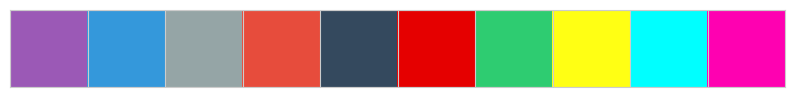

In [632]:
# Create an array with the colors you want to use : see https://xkcd.com/color/rgb/
colors = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e","#e50000", "#2ecc71","#ffff14","#00ffff","#fe01b1"]
sns.palplot(sns.color_palette(colors))
customPalette = sns.set_palette(sns.color_palette(colors))


In [633]:
# boxplot plotting aesthetics
boxprops = {'edgecolor': 'k', 'linewidth': 1,'alpha':0.5}
lineprops = {'color': 'k', 'linewidth': 1}

hue_order = ['ANN_MLP','quadratic','unAware','SN24test','SN168test']


boxplot_kwargs = {'boxprops': boxprops, 'medianprops': lineprops,
                  'whiskerprops': lineprops, 'capprops': lineprops,
                  'palette': customPalette,'width':0.8,'linewidth':None} #'hue_order': hue_order

stripplot_kwargs = {'linewidth': 0.0, 'size': 2, 'alpha': 0.2,'palette': customPalette, 'hue_order': hue_order,'dodge':True} #, 'hue_order': hue_order
swarmplot_kwargs = {'linewidth': 0.0, 'size': 2, 'alpha': 0.5,'palette': customPalette, 'hue_order': hue_order,'dodge':True}  #,'jitter':True


modelsList: Index(['ANN_MLP', 'quadratic', 'unAware', 'SN24test', 'SN168test'], dtype='object')
return types: <class 'pandas.core.frame.DataFrame'>,<class 'pandas.core.frame.DataFrame'>


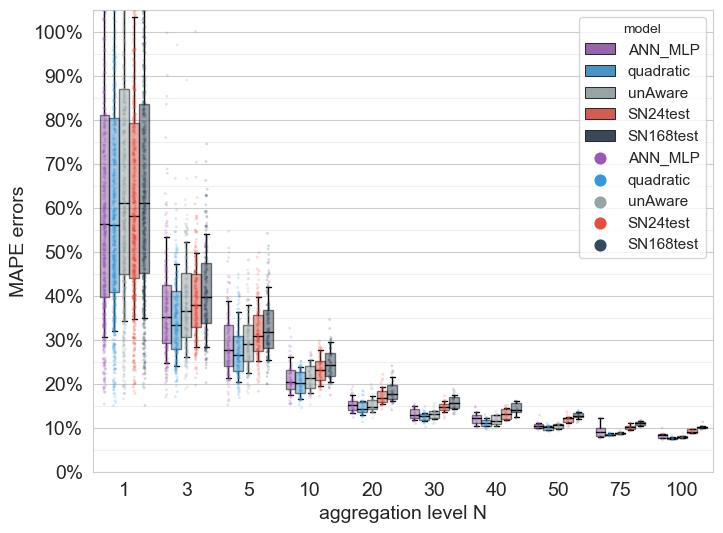

In [688]:
# Merge (LCL)  MLR and ANN TEST errors combining ANN config2 and MLR config3 (same input series)

figTitleBase = 'London data: MAPE errors for day ahead forecast by household aggregation level: '
figSaveBase = '../project_data/figuresLCL/LCL_MapeErrorsBoxPlot_AllModels'

errorType = 'MAPEs'
pathName = '../project_data/intermediateDataLCL/LCL_ANN_Config2run17_ALLincl1_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat6/'
mlrPathName = '../project_data/intermediateDataLCL/LCL_MLR_MLRconfig3run12_ALLincl1_18envTerms_6DoWterms/'

#retrieve ANN errors dictionaries and flip nesting (keep only test errors)
errorsAggANNtrain_dict,errorsAggANN_dict = get_errorDictionary(pathName)  #,areaID='LCL'
errorsAggANN_flipped = flip_dictionary(errorsAggANN_dict)

#retrieve MLR errors dictionaries & flip
errorsAgg = get_MLRerrorDictionary(mlrPathName)
errorsAgg_flipped = flip_dictionary(errorsAgg)

# box plot errors and return merged dataframe containing erroros for all models 
errorsAggLCLallModelsWide,errorsAggLCLallModels,fig_,axs_ = sbn_ErrorsAllModels(errorsAgg_flipped,errorsAggANN_flipped,order,errorType,figTitle=None,\
                          figSave=figSaveBase,yLim=[0,1.05],dropFromPlot=[],\
                          boxplot_kwargs=boxplot_kwargs,subPlotSize=[8,6],stripplot_kwargs=stripplot_kwargs\
                          ) #swarmplot_kwargs=swarmplot_kwargs) #,,figTitle=figTitleBase, ['unAware','SN168test','SN24test']

In [689]:
errorsAggLCLallModelsWide

,ANN_MLP,quadratic,unAware,SN24test,SN168test,N
grp0,1.285552,0.504208,0.591310,0.652596,0.573925,1
grp1,1.481329,0.233497,0.260582,0.276809,0.277575,1
grp2,0.783423,0.847699,0.825757,0.879662,0.833288,1
grp3,0.773435,0.823344,1.028351,0.846025,0.823713,1
grp4,0.223133,0.413182,0.435459,0.411057,0.540325,1
...,...,...,...,...,...,...
grp2,0.083133,0.077887,0.081196,0.096637,0.102409,100
grp3,0.071373,0.075152,0.077272,0.087959,0.098500,100
grp4,0.076922,0.083362,0.087543,0.096341,0.113145,100
grp5,0.085387,0.075544,0.078937,0.091347,0.102933,100


In [690]:
errorsAggLCLallModelsWide #.index.unique() #.ANN_MLP.values
df_0=errorsAggLCLallModelsWide
df_0['grp']=errorsAggLCLallModelsWide.index
df_0['grp']=errorsAggLCLallModelsWide['grp'].astype(str)    # +'_'+ errorsAggLCLallModelsWide['N'].astype(str)
df_0



,ANN_MLP,quadratic,unAware,SN24test,SN168test,N,grp
grp0,1.285552,0.504208,0.591310,0.652596,0.573925,1,grp0
grp1,1.481329,0.233497,0.260582,0.276809,0.277575,1,grp1
grp2,0.783423,0.847699,0.825757,0.879662,0.833288,1,grp2
grp3,0.773435,0.823344,1.028351,0.846025,0.823713,1,grp3
grp4,0.223133,0.413182,0.435459,0.411057,0.540325,1,grp4
...,...,...,...,...,...,...,...
grp2,0.083133,0.077887,0.081196,0.096637,0.102409,100,grp2
grp3,0.071373,0.075152,0.077272,0.087959,0.098500,100,grp3
grp4,0.076922,0.083362,0.087543,0.096341,0.113145,100,grp4
grp5,0.085387,0.075544,0.078937,0.091347,0.102933,100,grp5


In [691]:
df_0['N'].unique()
aggregation_N
#df_0.loc[df_['N']=='100']
#f_0.loc[df_['N']==str(N)]

[1, 3, 5, 10, 20, 30, 40, 50, 75, 100]

In [692]:
Nsmall = [str(n) for n in aggregation_N[0:4]]    # look at N=1 to 10 
df_0 = df_0.loc[df_0['N'].isin(Nsmall)]  #df['channel'].isin(['sale','fullprice'])
print(df_0['N'])


grp0      1
grp1      1
grp2      1
grp3      1
grp4      1
         ..
grp66    10
grp67    10
grp68    10
grp69    10
grp70    10
Name: N, Length: 1161, dtype: object


In [693]:
df_0

,ANN_MLP,quadratic,unAware,SN24test,SN168test,N,grp
grp0,1.285552,0.504208,0.591310,0.652596,0.573925,1,grp0
grp1,1.481329,0.233497,0.260582,0.276809,0.277575,1,grp1
grp2,0.783423,0.847699,0.825757,0.879662,0.833288,1,grp2
grp3,0.773435,0.823344,1.028351,0.846025,0.823713,1,grp3
grp4,0.223133,0.413182,0.435459,0.411057,0.540325,1,grp4
...,...,...,...,...,...,...,...
grp66,0.203904,0.235177,0.253891,0.257209,0.294286,10,grp66
grp67,0.286135,0.170864,0.184925,0.202985,0.209635,10,grp67
grp68,0.154702,0.166200,0.181386,0.212767,0.203029,10,grp68
grp69,0.258626,0.176709,0.191267,0.204762,0.215420,10,grp69


In [694]:
df_0['N'].unique()

array(['1', '3', '5', '10'], dtype=object)

In [695]:
#classify errors base don SN24test errors into 3 bins :

nBins=3
qcutVar='SN24test'
df_2=pd.DataFrame()

#categorize errors into bins
#bin_labels=['Cat{}'.format(x) for x in range(nBins)]
bin_labels=['low','med','high']

for N in df_0['N'].unique():
    df_1=df_0.loc[df_0['N']==str(N)]
    #print("N: ",N,"\n df_1 : ",df_1.head(),"\n df_1 tail: ",df_1.tail())
    binned,retBins = pd.qcut(df_1[qcutVar], q=nBins,retbins=True, precision=2,labels=bin_labels)
    print("Bins: {0}".format(retBins))
    df_1['SN24error']=binned
    df_1.sort_values(by=qcutVar,inplace=True)
    df_2=pd.concat([df_2,df_1],axis=0)
    
df_ = df_2
df_


Bins: [0.17774239 0.48493925 0.71101854 4.64443356]
Bins: [0.19678821 0.34447805 0.41834481 1.00101363]
Bins: [0.18271932 0.28714403 0.33423196 0.49796139]
Bins: [0.1720644  0.21853983 0.24688801 0.29743426]


C:\Users\fmurphy\Miniconda3\envs\fm_ANN\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
C:\Users\fmurphy\Miniconda3\envs\fm_ANN\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,ANN_MLP,quadratic,unAware,SN24test,SN168test,N,grp,SN24error
grp529,0.837219,0.157020,0.188847,0.177742,0.194500,1,grp529,low
grp119,0.328478,0.150446,0.165819,0.183278,0.190307,1,grp119,low
grp335,0.750177,0.249574,0.244675,0.191228,0.281098,1,grp335,low
grp151,0.609437,0.161722,0.178300,0.196050,0.150709,1,grp151,low
grp710,0.640532,0.197147,0.205377,0.199343,0.211778,1,grp710,low
...,...,...,...,...,...,...,...,...
grp9,0.183954,0.251108,0.271463,0.281019,0.305298,10,grp9,high
grp26,0.169371,0.230743,0.261728,0.282368,0.299952,10,grp26,high
grp18,0.224214,0.237624,0.249743,0.286146,0.281529,10,grp18,high
grp0,0.175764,0.232926,0.242993,0.291960,0.252814,10,grp0,high


In [696]:
plt.rcParams.update({'legend.fontsize':10}) 


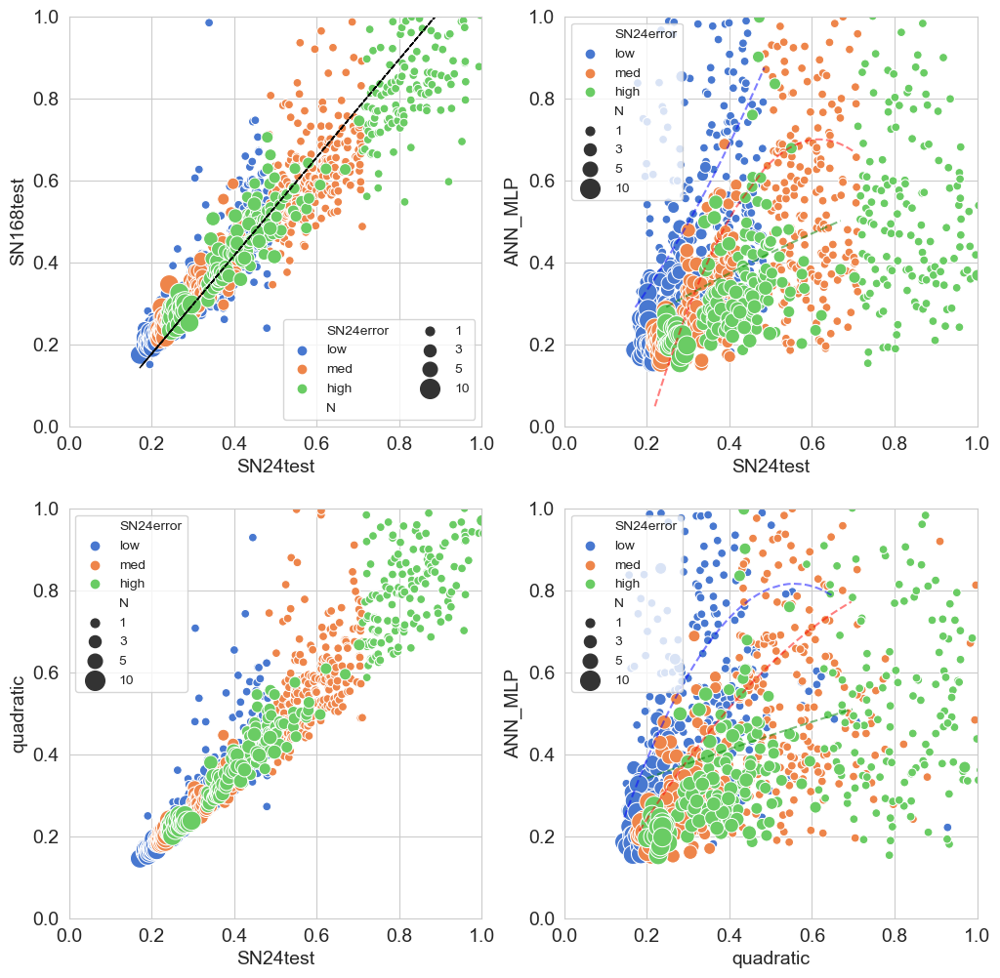

In [697]:
# regression of model errors -- takes df_ above as input
                               
fig = plt.figure(figsize=(12,12))
axs = [fig.add_subplot(2,2,i+1) for i in range(4)]  # add subplot for each regression

hueVar = 'SN24error'
nCols=len(df_[hueVar].unique())
linColsPoly=['b','r','g']

#axs = fig.add_subplot(111) 
xVars = ['SN24test','SN24test','SN24test','quadratic']
yVars = ['SN168test','ANN_MLP','quadratic','ANN_MLP']


for i in range(4):
    
    xs=df_[xVars[i]].values
    ys=df_[yVars[i]].values

    sns.scatterplot(x=xVars[i], y=yVars[i],hue=hueVar,data=df_,palette=sns.color_palette('muted', n_colors=nCols), legend="full",\
                    ax=axs[i],size='N',
            sizes=(40, 200),s=15) #,sizes=(10, 10),
    if i==0:      # linear fit
        r2,mse,yPred = lrmodel_r2(df_[xVars[i]].values,df_[yVars[i]].values)
        r2=r2_score(xs,yPred)
        #print("R2: {0} agains {1} : {2}".format(yVar,xVar,r2))
        axs[i].plot(xs, yPred, color='k', linewidth=1,linestyle='dashed')
    elif ((i==1) or (i==3)):    
        # fit polynomial 
        for k,bin in enumerate(bin_labels):
            xs_pfit = df_.loc[df_['SN24error']==bin_labels[k]][xVars[i]].values
            ys_pfit = df_.loc[df_['SN24error']==bin_labels[k]][yVars[i]].values         
            xd = df_.loc[df_['SN24error']==bin_labels[k]].sort_values(by=xVars[i])[xVars[i]].values
            xd = [num for num in xd if num <= 0.7 and num > 0]
            coefs = poly.polyfit(xs_pfit,ys_pfit, 2)  # lsq fit
            ffit  = poly.polyval(xd, coefs)       # numpy.polyval - Evaluate a polynomial (coefs) at specific values (xd)
            axs[i].plot(xd, ffit, color=linColsPoly[k],linestyle='dashed',alpha=0.5)        # plot  ffit 


        
    axs[i].set_xlim([0,1])
    axs[i].set_ylim([0,1])
    if i==0:
        axs[i].legend(ncol=2,loc='lower right')






In [698]:
# select end member user grps for profile plotting 

N='3'

# a) from blue (high ANN model error, low errors for quadratic (and SN sonce quadratic linearly correlated with these))
df_usersHiANNerror = df_.loc[(df_['ANN_MLP']>0.6)]
df_usersHiANNerror = df_usersHiANNerror.loc[df_usersHiANNerror['quadratic']<0.25]
print(df_usersHiANNerror.loc[df_usersHiANNerror['N']=='3'])

df_usersLoANNerror = df_.loc[(df_['ANN_MLP']<0.2)]
df_usersLoANNerror = df_usersLoANNerror.loc[df_usersLoANNerror['quadratic']>0.4]
print(df_usersLoANNerror.loc[df_usersLoANNerror['N']=='3'])

df_usersPlot=df_.loc[ ((df_['grp'].isin(['grp167','grp49']))   &  (df_['N'] == str(N)) )     ]
df_usersPlot

         ANN_MLP  quadratic   unAware  SN24test  SN168test  N     grp  \
grp167  0.853317   0.233762  0.257914  0.284343   0.254456  3  grp167   

       SN24error  
grp167       low  
        ANN_MLP  quadratic   unAware  SN24test  SN168test  N    grp SN24error
grp49  0.186305   0.455017  0.452629   0.43226   0.558766  3  grp49      high


,ANN_MLP,quadratic,unAware,SN24test,SN168test,N,grp,SN24error
grp167,0.853317,0.233762,0.257914,0.284343,0.254456,3,grp167,low
grp49,0.186305,0.455017,0.452629,0.432260,0.558766,3,grp49,high


In [699]:
myStyles['lineColors']=['k', 'b', 'r', 'g', 'c','y']
myStyles['lineStyles']=['dotted','solid', 'solid', 'solid', 'solid','solid']
myStyles['alpha']=[0.7,1.0,0.7,0.5,0.5,0.3]
myStyles['lw']=[2,1,1,1,1,1,]
myStyles

{'lineStyles': ['dotted', 'solid', 'solid', 'solid', 'solid', 'solid'],
 'lineColors': ['k', 'b', 'r', 'g', 'c', 'y'],
 'alpha': [0.7, 1.0, 0.7, 0.5, 0.5, 0.3],
 'lw': [2, 1, 1, 1, 1, 1]}

In [700]:
#matplotlib.rc('lines', linewidth=2, color='r')
# set fontsizes etc for plotting 
plt.rcParams["axes.labelsize"] = 14
plt.rc('legend',fontsize=11) # using a size in points
matplotlib.rc('xtick', labelsize=14) 
matplotlib.rc('ytick', labelsize=14) 
plt.rcParams["legend.framealpha"] = 0.8
#print(plt.rcParams)

## plot profiles for selected grps above

In [701]:
print(df_usersPlot)
df_usersPlot

         ANN_MLP  quadratic   unAware  SN24test  SN168test  N     grp  \
grp167  0.853317   0.233762  0.257914  0.284343   0.254456  3  grp167   
grp49   0.186305   0.455017  0.452629  0.432260   0.558766  3   grp49   

       SN24error  
grp167       low  
grp49       high  


,ANN_MLP,quadratic,unAware,SN24test,SN168test,N,grp,SN24error
grp167,0.853317,0.233762,0.257914,0.284343,0.254456,3,grp167,low
grp49,0.186305,0.455017,0.452629,0.432260,0.558766,3,grp49,high


In [702]:
def getSeason(start):
    if (start < (3*30*24)) or (start > (10*30*24)):
        season='winter'
    elif (start > (5*30*24)) and (start < (9*30*24)):
        season='summer'
    else:
        season='spring-autumn'
    return(season);
    

relative index : window to plot: [[0, 168]]
Index range to plot : plotStart 1008, plotEnd 1176; days 42.0 to 49.0; weeks 6.0 to 7.0
found startTick 1008 on day 42.0
relative index : window to plot: [[0, 168]]
Index range to plot : plotStart 1008, plotEnd 1176; days 42.0 to 49.0; weeks 6.0 to 7.0
found startTick 1008 on day 42.0


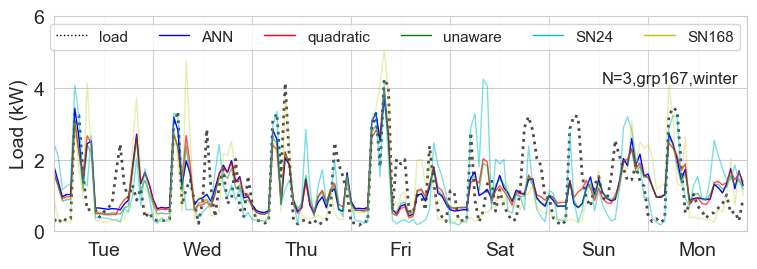

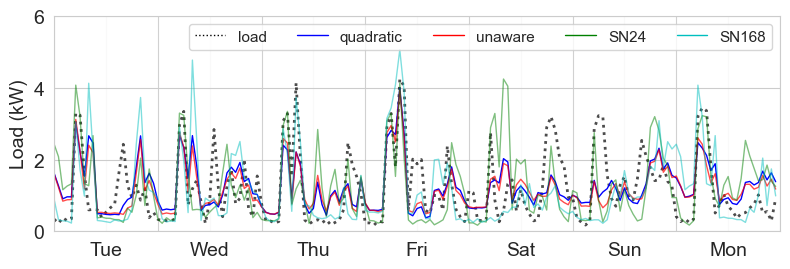

In [704]:
N='3'
grpID='grp167'  
yLim=[0,6]
start = windows[0,2]   # start of test period in Feb #  window to plot (windows as per test/train window settings)
season  = getSeason(start) 

fig_size=[8,2.8]
nDaysToShow=7

#get load, forecasts for grpID
load,models=getForecastByGrpName(N,mlrTest_dictLCL,annTrainPredict_dictLCL,errorsAggLCLallModelsWide,grpAggLoad_N_dictLCL,grpID)

# plot forecast for  x week from 'start' for modelsSubset
#modelsToPlot = ['ANN']
#modelsToPlot = ['quadratic','unaware','SN24','SN168']
modelsToPlot = ['ANN','quadratic','unaware','SN24','SN168']
modelsSubset = {k: models[k] for k in modelsToPlot}

figTitle='N='+str(N)+','+str(grpID)+',' + str(season)  #'STLF: aggregation of '+
fig1,axs1 = plot_forecast(1,windows,start,load,modelsSubset,yLim=yLim,figTitle=None,figSave=None,myStyles=myStyles,\
                          subPlotSize=fig_size,profileLength=nDaysToShow) #'xLabel',
fig1.text(0.8, 0.70,figTitle,fontsize=12, ha='left',va='center')

# plot forecast for  x week from 'start' for modelsSubset
modelsToPlot = ['quadratic','unaware','SN24','SN168']
modelsSubset = {k: models[k] for k in modelsToPlot}
fig1,axs1 = plot_forecast(1,windows,start,load,modelsSubset,yLim=yLim,figTitle=None,figSave=None,myStyles=myStyles,\
                          subPlotSize=fig_size,profileLength=nDaysToShow) #'xLabel',
#fig1.text(0.1, 0.86,figTitle,fontsize=14, ha='left',va='center')


relative index : window to plot: [[0, 168]]
Index range to plot : plotStart 1008, plotEnd 1176; days 42.0 to 49.0; weeks 6.0 to 7.0
found startTick 1008 on day 42.0
relative index : window to plot: [[0, 168]]
Index range to plot : plotStart 1008, plotEnd 1176; days 42.0 to 49.0; weeks 6.0 to 7.0
found startTick 1008 on day 42.0


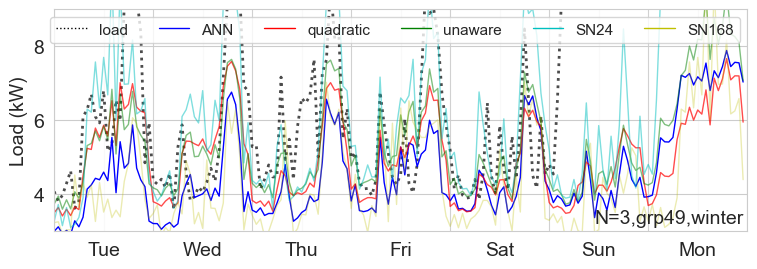

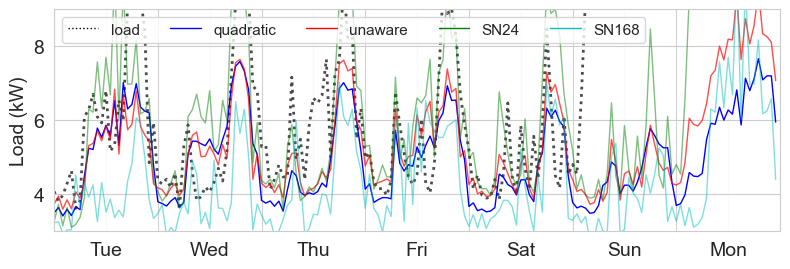

In [705]:
N='3'
grpID='grp49'
yLim=[3,9]
start = windows[0,2]   # start of test period in Feb #  window to plot (windows as per test/train window settings)
season  = getSeason(start) 
del fig1,axs1
fig_size=[8,2.8]
nDaysToShow=7

#get load, forecasts for grpID
load,models=getForecastByGrpName(N,mlrTest_dictLCL,annTrainPredict_dictLCL,errorsAggLCLallModels,grpAggLoad_N_dictLCL,grpID)


# plot forecast for  x week from 'start' for modelsSubset
#modelsToPlot = ['ANN']
#modelsToPlot = ['quadratic','unaware','SN24','SN168']
modelsToPlot = ['ANN','quadratic','unaware','SN24','SN168']
modelsSubset = {k: models[k] for k in modelsToPlot}

figTitle='N='+str(N)+','+str(grpID)+',' + str(season)  #'STLF: aggregation of '+
fig1,axs1 = plot_forecast(1,windows,start,load,modelsSubset,yLim=yLim,figTitle=None,figSave=None,myStyles=myStyles,\
                          subPlotSize=fig_size,profileLength=nDaysToShow) #'xLabel',
fig1.text(0.79, 0.20,figTitle,fontsize=14, ha='left',va='center')

# plot forecast for  x week from 'start' for modelsSubset
modelsToPlot = ['quadratic','unaware','SN24','SN168']
modelsSubset = {k: models[k] for k in modelsToPlot}
fig1,axs1 = plot_forecast(1,windows,start,load,modelsSubset,yLim=yLim,figTitle=None,figSave=None,myStyles=myStyles,\
                          subPlotSize=fig_size,profileLength=nDaysToShow) #'xLabel',
#fig1.text(0.1, 0.86,figTitle,fontsize=14, ha='left',va='center')


modelsList: Index(['ANN_MLP', 'quadratic', 'unAware', 'SN24test', 'SN168test'], dtype='object')
return types: <class 'pandas.core.frame.DataFrame'>,<class 'pandas.core.frame.DataFrame'>


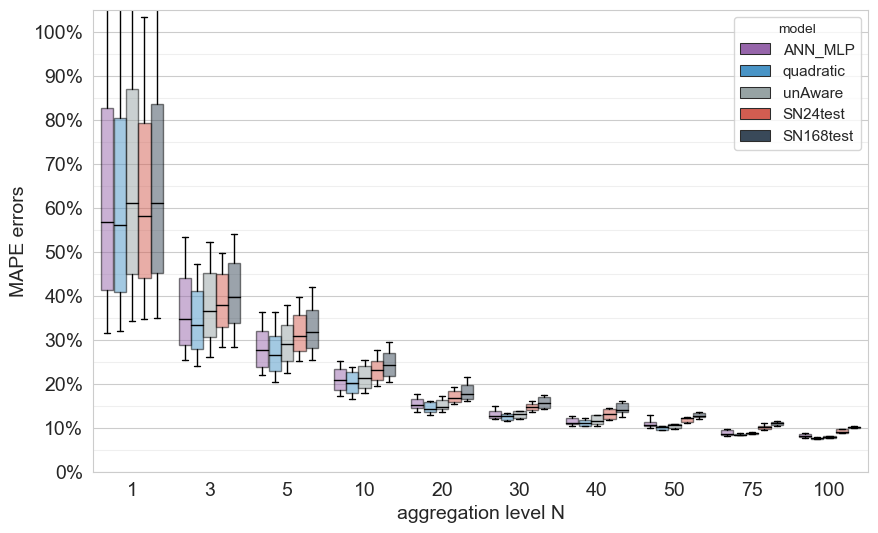

In [706]:
# Merge (LCL)  MLR and ANN TEST errors combining ANN config3 and MLR config3 

figTitleBase = 'London data: MAPE errors for day ahead forecast by household aggregation level: '
figSaveBase = '../project_data/figuresLCL/LCL_MapeErrorsBoxPlot_AllModels'

errorType = 'MAPEs'
pathName = '../project_data/intermediateDataLCL/LCL_ANN_Config3run18_ALLincl1_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat10/'
mlrPathName = '../project_data/intermediateDataLCL/LCL_MLR_MLRconfig3run12_ALLincl1_18envTerms_6DoWterms/'

#retrieve ANN errors dictionaries and flip nesting (keep only test errors)
errorsAggANNtrain_dict,errorsAggANN_dict = get_errorDictionary(pathName)  #,areaID='LCL'
errorsAggANN_flipped = flip_dictionary(errorsAggANN_dict)

#retrieve MLR errors dictionaries & flip
errorsAgg = get_MLRerrorDictionary(mlrPathName)
errorsAgg_flipped = flip_dictionary(errorsAgg)

# box plot errors and return merged dataframe containing erroros for all models 
#errorsAggLCLallModels,df_narrow,fig_,axs_
errorsAggLCLallModelsWide,errorsAggLCLallModels,fig_,axs_ = sbn_ErrorsAllModels(errorsAgg_flipped,errorsAggANN_flipped,order,figTitle=None,\
                      figSave=figSaveBase,errorType=errorType,yLim=[0,1.05],dropFromPlot=[],boxplot_kwargs=boxplot_kwargs,\
                                           subPlotSize=[10,6]) #,stripplot_kwargs=stripplot_kwargs),figTitle=figTitleBase,

In [707]:
errorsAggLCLallModelsWide  # LCL data

,ANN_MLP,quadratic,unAware,SN24test,SN168test,N
grp0,0.866106,0.504208,0.591310,0.652596,0.573925,1
grp1,0.314717,0.233497,0.260582,0.276809,0.277575,1
grp2,0.405755,0.847699,0.825757,0.879662,0.833288,1
grp3,0.403572,0.823344,1.028351,0.846025,0.823713,1
grp4,2.010577,0.413182,0.435459,0.411057,0.540325,1
...,...,...,...,...,...,...
grp2,0.078976,0.077887,0.081196,0.096637,0.102409,100
grp3,0.091935,0.075152,0.077272,0.087959,0.098500,100
grp4,0.073972,0.083362,0.087543,0.096341,0.113145,100
grp5,0.081123,0.075544,0.078937,0.091347,0.102933,100


modelsList: Index(['ANN_MLP', 'quadratic', 'unAware', 'SN24test', 'SN168test'], dtype='object')
return types: <class 'pandas.core.frame.DataFrame'>,<class 'pandas.core.frame.DataFrame'>


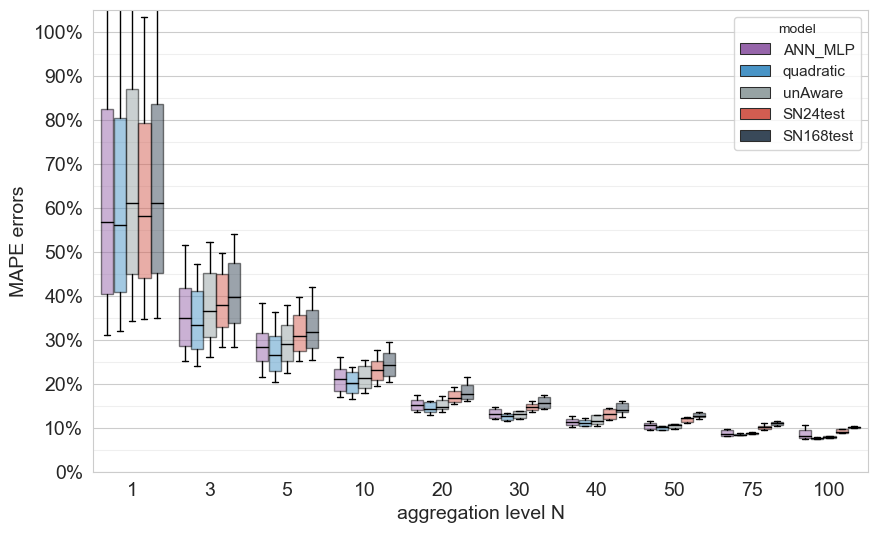

In [708]:
# Merge (LCL)  MLR and ANN TEST errors combining ANN config1 and MLR config3 

figTitleBase = 'London data: MAPE errors for day ahead forecast by household aggregation level: '
figSaveBase = '../project_data/figuresLCL/LCL_MapeErrorsBoxPlot_AllModels'

errorType = 'MAPEs'
pathName = '../project_data/intermediateDataLCL/LCL_ANN_Config1run16_ALLincl1_Normalised_HL1_Nodes20_Epochs100_BatchSize32_nFeat8/'
mlrPathName = '../project_data/intermediateDataLCL/LCL_MLR_MLRconfig3run12_ALLincl1_18envTerms_6DoWterms/'

#retrieve ANN errors dictionaries and flip nesting (keep only test errors)
errorsAggANNtrain_dict,errorsAggANN_dict = get_errorDictionary(pathName)  #,areaID='LCL'
errorsAggANN_flipped = flip_dictionary(errorsAggANN_dict)

#retrieve MLR errors dictionaries & flip
errorsAgg = get_MLRerrorDictionary(mlrPathName)
errorsAgg_flipped = flip_dictionary(errorsAgg)

# box plot errors and return merged dataframe containing erroros for all models 
errorsAggLCLallModelsWide,errorsAggLCLallModels,fig_,axs_ = sbn_ErrorsAllModels(errorsAgg_flipped,errorsAggANN_flipped,order,figTitle=None,\
                      figSave=figSaveBase,errorType=errorType,yLim=[0,1.05],dropFromPlot=[],boxplot_kwargs=boxplot_kwargs,\
                                           subPlotSize=[10,6]) #,stripplot_kwargs=stripplot_kwargs),figTitle=figTitleBase,

In [710]:
errorsAggLCLallModelsWide  # LCL data

,ANN_MLP,quadratic,unAware,SN24test,SN168test,N
grp0,0.472730,0.504208,0.591310,0.652596,0.573925,1
grp1,0.497351,0.233497,0.260582,0.276809,0.277575,1
grp2,0.215799,0.847699,0.825757,0.879662,0.833288,1
grp3,0.486175,0.823344,1.028351,0.846025,0.823713,1
grp4,0.664548,0.413182,0.435459,0.411057,0.540325,1
...,...,...,...,...,...,...
grp2,0.106535,0.077887,0.081196,0.096637,0.102409,100
grp3,0.080815,0.075152,0.077272,0.087959,0.098500,100
grp4,0.071511,0.083362,0.087543,0.096341,0.113145,100
grp5,0.081149,0.075544,0.078937,0.091347,0.102933,100


In [715]:
df_ = errorsAggLCLallModelsWide.groupby(['N']).count()   
df_.index = df_.index.astype('int64')
df_.sort_index()

,ANN_MLP,quadratic,unAware,SN24test,SN168test
N,,,,,
1,711,711,711,711,711
3,237,237,237,237,237
5,142,142,142,142,142
10,71,71,71,71,71
20,35,35,35,35,35
30,23,23,23,23,23
40,17,17,17,17,17
50,14,14,14,14,14
75,9,9,9,9,9


modelsList: Index(['ANN_MLP', 'quadratic', 'unAware', 'SN24test', 'SN168test'], dtype='object')
return types: <class 'pandas.core.frame.DataFrame'>,<class 'pandas.core.frame.DataFrame'>


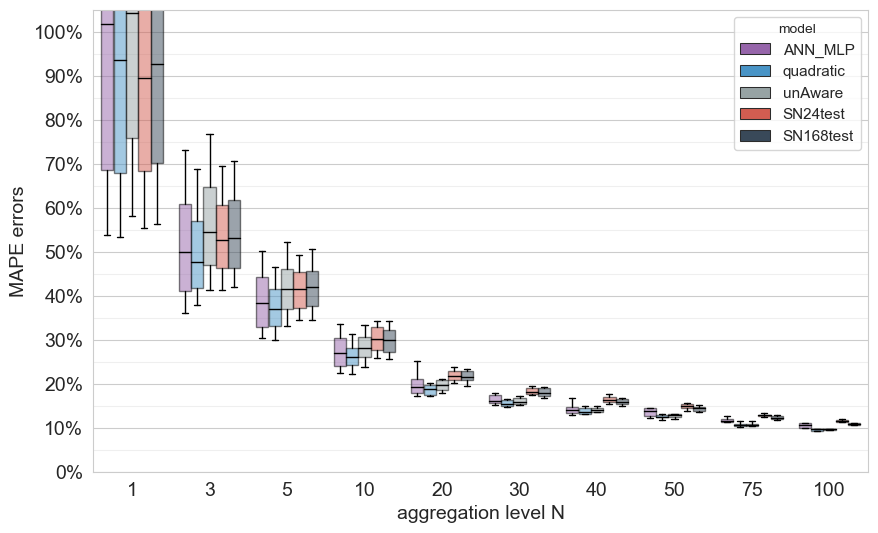

In [712]:
# Merge (IRL CER)  MLR and ANN TEST errors combining ANN config2 and MLR config3 (same input series)


figTitleBase = 'Ireland data: MAPE errors for day ahead forecast by household aggregation level: '
figSaveBase = '../project_data/figuresIreland/IRL_MapeErrorsBoxPlot_AllModels'

errorType = 'MAPEs'
pathName = '../project_data/intermediateDataIreland/IRL_ANN_config2run6_ALLincl1_Normalised_HL2_Nodes20_Epochs100_BatchSize32_nFeat6/'
mlrPathName = '../project_data/intermediateDataIreland/IRL_MLR_MLRconfig3run3_ALLincl1_18envTerms_6DoWterms/'

#retrieve ANN errors dictionaries and flip nesting (keep only test errors)
errorsAggANNtrain_dict,errorsAggANN_dict = get_errorDictionary(pathName)  #,areaID='IRL'
errorsAggANN_flipped = flip_dictionary(errorsAggANN_dict)

#retrieve MLR errors dictionaries & flip
errorsAgg = get_MLRerrorDictionary(mlrPathName)
errorsAgg_flipped = flip_dictionary(errorsAgg)

# box plot errors and return merged dataframe containing erroros for all models 
errorsAggIRLallModelsWide,errorsAggIRLallModels,fig_,axs_ = sbn_ErrorsAllModels(errorsAgg_flipped,errorsAggANN_flipped,order,figTitle=None,\
                      figSave=figSaveBase,errorType=errorType,yLim=[0,1.05],dropFromPlot=[],boxplot_kwargs=boxplot_kwargs,\
                                           subPlotSize=[10,6]) #,stripplot_kwargs=stripplot_kwargs),figTitle=figTitleBase,


In [713]:
errorsAggIRLallModelsWide # Ireland data

,ANN_MLP,quadratic,unAware,SN24test,SN168test,N
grp0,0.282836,1.036842,1.072452,0.853693,0.990322,1
grp1,0.618706,0.952737,1.155539,0.972684,0.988867,1
grp2,0.675380,2.156696,2.052527,1.954156,1.676875,1
grp3,0.724028,0.830344,0.897267,0.826253,0.740667,1
grp4,3.542516,0.615237,0.766086,0.752637,0.676123,1
...,...,...,...,...,...,...
grp1,0.100979,0.090995,0.091299,0.109102,0.106193,100
grp2,0.098669,0.097245,0.097162,0.117591,0.110100,100
grp3,0.093468,0.099714,0.099948,0.129341,0.111044,100
grp4,0.117886,0.097846,0.098060,0.118892,0.109013,100


In [714]:
df_ = errorsAggIRLallModelsWide.groupby(['N']).count()   
df_.index = df_.index.astype('int64')
df_.sort_index()

,ANN_MLP,quadratic,unAware,SN24test,SN168test
N,,,,,
1,675,675,675,675,675
3,225,225,225,225,225
5,135,135,135,135,135
10,67,67,67,67,67
20,33,33,33,33,33
30,22,22,22,22,22
40,16,16,16,16,16
50,13,13,13,13,13
75,9,9,9,9,9


In [716]:
myStyles['lineColors']=['k', 'b', 'r', 'm', 'c','y']
myStyles['lineStyles']=['dotted','solid', 'solid', 'solid', 'solid','solid']
myStyles

{'lineStyles': ['dotted', 'solid', 'solid', 'solid', 'solid', 'solid'],
 'lineColors': ['k', 'b', 'r', 'm', 'c', 'y'],
 'alpha': [0.7, 1.0, 0.7, 0.5, 0.5, 0.3],
 'lw': [2, 1, 1, 1, 1, 1]}

In [717]:
#matplotlib.rc('lines', linewidth=2, color='r')
# set fontsizes etc for plotting 
plt.rcParams["axes.labelsize"] = 16
plt.rc('legend',fontsize=16) # using a size in points
matplotlib.rc('xtick', labelsize=14) 
matplotlib.rc('ytick', labelsize=14) 

#print(plt.rcParams)

In [718]:
#  window to plot (windows as per test/train window settings)
start = windows[0,2]   # start of test period in Feb
#start = windows[2,2]   # start opf test period in June

### now plot forecast examples for various aggregation levels :    
#####  choose N level and plot data and forecasts for sample grps representing small , large error example for each aggregation level 

##### first plot examples at low aggregation (N3) : a) low ANN error example b) large ANN error example

In [728]:
#NB - this one is a pain - keep having to change the line with .reshape !
def shiftInputs(load,windows,loadSeries,trainTestFlg):  #load = eg aggLoad ,latest version here as keep changing : put in .py package when tody up code at end of project
    seriesPlot = np.empty_like(load)
    seriesPlot[:] = np.nan
    lengthSum = 0

    for i in range(len(windows)):
        if trainTestFlg == 'train':
            lengthInd  = windows[i,1]-(windows[i,0]+168)
            if (len(np.squeeze(loadSeries[lengthSum:lengthSum+lengthInd]).shape) < 2):
                seriesPlot[(windows[i,0]+168):windows[i,1]]  = np.squeeze(loadSeries[lengthSum:lengthSum+lengthInd]).reshape(-1,1)  #.astype(object) #
                #seriesPlot[(windows[i,0]+168):windows[i,1]]  = np.squeeze(loadSeries[lengthSum:lengthSum+lengthInd]).astype(object)  #.astype(object) #
        else:
            lengthInd  = windows[i,3]-(windows[i,2])
            if (len(np.squeeze(loadSeries[lengthSum:lengthSum+lengthInd]).shape) < 2):
                seriesPlot[windows[i,2]:windows[i,3]]  = np.squeeze(loadSeries[lengthSum:lengthSum+lengthInd]).reshape(-1,1)       #.astype(object)
                #seriesPlot[windows[i,2]:windows[i,3]]  = np.squeeze(loadSeries[lengthSum:lengthSum+lengthInd]).astype(object)       #.astype(object)

        lengthSum += lengthInd


    return(seriesPlot)

Bins: [0.16224371 0.2861617  0.34862887 0.41775457 1.10581947]
GrpID:  ['grp197']
relative index : window to plot: [[0, 168]]
Index range to plot : plotStart 1008, plotEnd 1176; days 42.0 to 49.0; weeks 6.0 to 7.0
found startTick 1008 on day 42.0


Text(0.05, 0.82, 'a) Load forecast: aggregation of 3 households \n ')

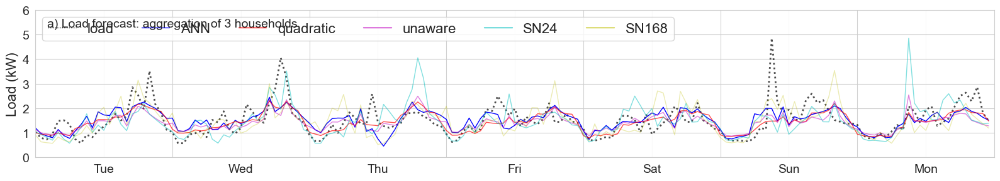

In [729]:
N='3'
category = 'Cat0'
nBins=4
nGrpsToPlot=1
yLim=[0,6]

load,uIDsList,randGrpIDs,models=getForecastByGrp(N,nBins,nGrpsToPlot,category,mlrTest_dictLCL,annTrainPredict_dictLCL,\
                                                    errorsAggLCLallModelsWide,grpAggLoad_N_dictLCL)
print("GrpID: ",randGrpIDs)
figTitle='a) Load forecast: aggregation of '+str(N)+' households \n ' #+str(randGrpIDs[0])  #+':'+str(uIDsList)
figSave = '../MScProjectCoding/project_data/figuresLCL/forecastAgg'+str(N)+'Grp'+str(randGrpIDs[0])
fig1,ax1 = plot_forecast(1,windows,start,load,models,yLim=yLim,figTitle=None,\
                         figSave=figSave,myStyles=myStyles,subPlotSize=[16,3]) #'xLabel',
fig1.text(0.05, 0.82,figTitle,fontsize=14, ha='left',va='center')

Bins: [0.16224371 0.2861617  0.34862887 0.41775457 1.10581947]
GrpID:  ['grp130']
relative index : window to plot: [[0, 168]]
Index range to plot : plotStart 1008, plotEnd 1176; days 42.0 to 49.0; weeks 6.0 to 7.0
found startTick 1008 on day 42.0


Text(0.05, 0.82, 'a) Load forecast: aggregation of 3 households \n ')

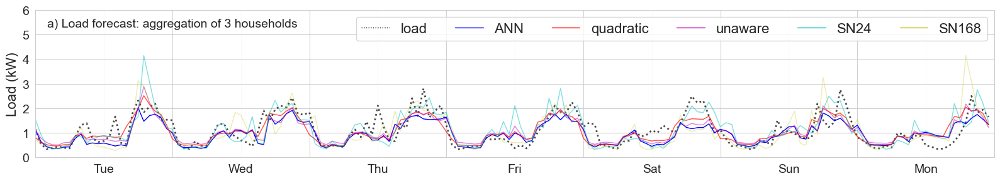

In [731]:
category = 'Cat3'

load,uIDsList,randGrpIDs,models=getForecastByGrp(N,nBins,nGrpsToPlot,category,mlrTest_dictLCL,annTrainPredict_dictLCL,\
                                                    errorsAggLCLallModelsWide,grpAggLoad_N_dictLCL)
print("GrpID: ",randGrpIDs)
figTitle='a) Load forecast: aggregation of '+str(N)+' households \n ' #+str(randGrpIDs[0])  #+':'+str(uIDsList)
figSave = '../MScProjectCoding/project_data/figuresLCL/forecastAgg'+str(N)+'Grp'+str(randGrpIDs[0])
fig1,ax1 = plot_forecast(1,windows,start,load,models,yLim=yLim,figTitle=None,\
                         figSave=figSave,myStyles=myStyles,subPlotSize=[16,3]) #'xLabel',
fig1.text(0.05, 0.82,figTitle,fontsize=14, ha='left',va='center')

In [732]:
models['ANN'] #.reshape(-1,1)

array([1.1198249 , 0.63430035, 0.4264502 , 0.36855862, 0.35495794,
       0.41730723, 0.42682466, 0.7762213 , 0.95125765, 0.52893054, ...,
       0.9074775 , 0.8671967 , 0.94616914, 0.6897689 , 1.3804159 ,
       1.4875736 , 1.3784059 , 1.3843461 , 1.4372665 , 1.0279027 ],
      dtype=float32)

### plot examples at aggregation N=10 : a) low ANN error example b) large ANN error example

Bins: [0.15619455 0.18307855 0.20975002 0.23267909 0.31661976]
GrpID:  ['grp47']
relative index : window to plot: [[0, 168]]
Index range to plot : plotStart 1008, plotEnd 1176; days 42.0 to 49.0; weeks 6.0 to 7.0
found startTick 1008 on day 42.0


Text(0.05, 0.82, 'a) Load forecast: aggregation of 10 households \n ')

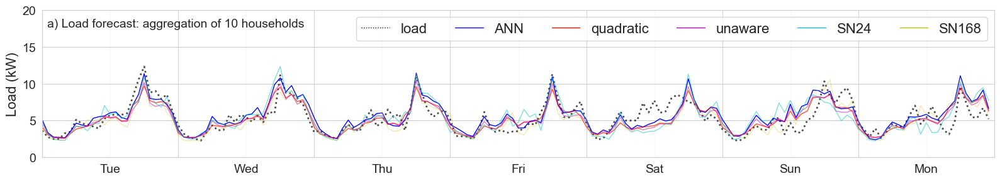

In [734]:
N='10'
category = 'Cat0'
nBins=4
nGrpsToPlot=1
yLim=[0,20]

load,uIDsList,randGrpIDs,models=getForecastByGrp(N,nBins,nGrpsToPlot,category,mlrTest_dictLCL,annTrainPredict_dictLCL,\
                                                    errorsAggLCLallModelsWide,grpAggLoad_N_dictLCL)
print("GrpID: ",randGrpIDs)
figTitle='a) Load forecast: aggregation of '+str(N)+' households \n ' #+str(randGrpIDs[0])  #+':'+str(uIDsList)
figSave = '../MScProjectCoding/project_data/figuresLCL/forecastAgg'+str(N)+'Grp'+str(randGrpIDs[0])
fig1,ax1 = plot_forecast(1,windows,start,load,models,yLim=yLim,figTitle=None,\
                         figSave=figSave,myStyles=myStyles,subPlotSize=[16,3]) #'xLabel',
fig1.text(0.05, 0.82,figTitle,fontsize=14, ha='left',va='center')

Bins: [0.15619455 0.18307855 0.20975002 0.23267909 0.31661976]
GrpID:  ['grp55']
relative index : window to plot: [[0, 168]]
Index range to plot : plotStart 1008, plotEnd 1176; days 42.0 to 49.0; weeks 6.0 to 7.0
found startTick 1008 on day 42.0


Text(0.05, 0.82, 'a) Load forecast: aggregation of 10 households \n ')

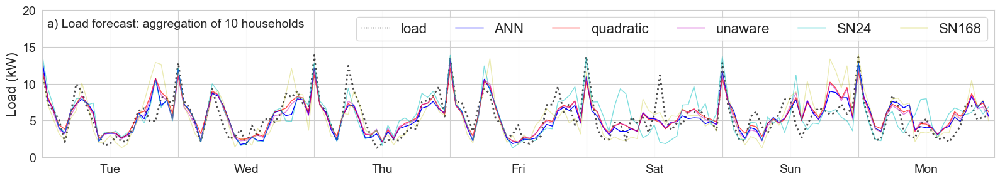

In [735]:
category = 'Cat3'
load,uIDsList,randGrpIDs,models=getForecastByGrp(N,nBins,nGrpsToPlot,category,mlrTest_dictLCL,annTrainPredict_dictLCL,\
                                                    errorsAggLCLallModelsWide,grpAggLoad_N_dictLCL)
print("GrpID: ",randGrpIDs)
figTitle='a) Load forecast: aggregation of '+str(N)+' households \n ' #+str(randGrpIDs[0])  #+':'+str(uIDsList)
figSave = '../MScProjectCoding/project_data/figuresLCL/forecastAgg'+str(N)+'Grp'+str(randGrpIDs[0])
fig1,ax1 = plot_forecast(1,windows,start,load,models,yLim=yLim,figTitle=None,\
                         figSave=figSave,myStyles=myStyles,subPlotSize=[16,3]) #'xLabel',
fig1.text(0.05, 0.82,figTitle,fontsize=14, ha='left',va='center')

## now plot for IRELAND DATA 

### first plot examples at low aggregation (N3) : a) low ANN error example b) large ANN error example

Bins: [0.27895931 0.41002905 0.49900599 0.60930615 1.47177288]
GrpID:  ['grp135']
relative index : window to plot: [[0, 168]]
Index range to plot : plotStart 1008, plotEnd 1176; days 42.0 to 49.0; weeks 6.0 to 7.0
found startTick 1008 on day 42.0


Text(0.05, 0.82, 'a) Load forecast: aggregation of 3 households \n  IRL: grp135')

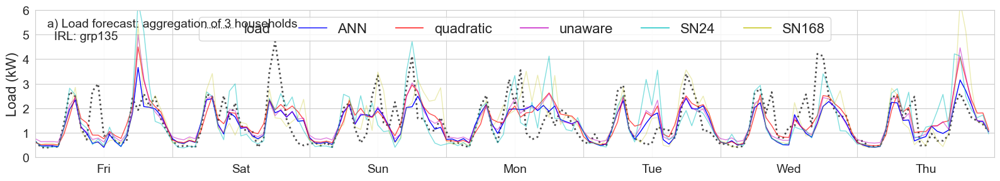

In [736]:
N='3'
category = 'Cat0'
nBins=4
nGrpsToPlot=1
yLim=[0,6]

load,uIDsList,randGrpIDs,models=getForecastByGrp(N,nBins,nGrpsToPlot,category,mlrTest_dictIRL,annTrainPredict_dictIRL,\
                                                    errorsAggIRLallModelsWide,grpAggLoad_N_dictIRL)
print("GrpID: ",randGrpIDs)
figTitle='a) Load forecast: aggregation of '+str(N)+' households \n  IRL: ' +str(randGrpIDs[0])  #+':'+str(uIDsList)
figSave = '../MScProjectCoding/project_data/figuresIreland/forecastAgg'+str(N)+'Grp'+str(randGrpIDs[0])
fig1,ax1 = plot_forecast(1,windows,start,load,models,yLim=yLim,figTitle=None,\
                         figSave=figSave,myStyles=myStyles,subPlotSize=[16,3]) #'xLabel',
fig1.text(0.05, 0.82,figTitle,fontsize=14, ha='left',va='center')

Bins: [0.27895931 0.41002905 0.49900599 0.60930615 1.47177288]
GrpID:  ['grp13']
relative index : window to plot: [[0, 168]]
Index range to plot : plotStart 1008, plotEnd 1176; days 42.0 to 49.0; weeks 6.0 to 7.0
found startTick 1008 on day 42.0


Text(0.05, 0.82, 'a) Load forecast: aggregation of 3 households \n  IRL: grp13')

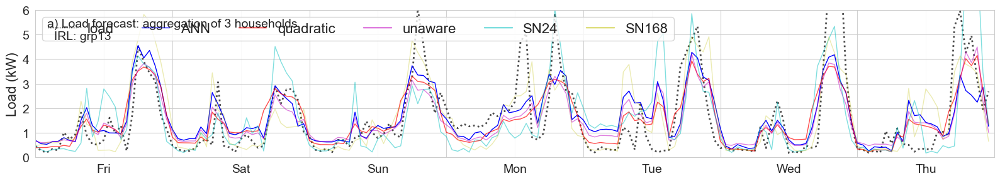

In [737]:
category = 'Cat3'

load,uIDsList,randGrpIDs,models=getForecastByGrp(N,nBins,nGrpsToPlot,category,mlrTest_dictIRL,annTrainPredict_dictIRL,\
                                                    errorsAggIRLallModelsWide,grpAggLoad_N_dictIRL)
print("GrpID: ",randGrpIDs)
figTitle='a) Load forecast: aggregation of '+str(N)+' households \n  IRL: ' +str(randGrpIDs[0])  #+':'+str(uIDsList)
figSave = '../MScProjectCoding/project_data/figuresIreland/forecastAgg'+str(N)+'Grp'+str(randGrpIDs[0])
fig1,ax1 = plot_forecast(1,windows,start,load,models,yLim=yLim,figTitle=None,\
                         figSave=figSave,myStyles=myStyles,subPlotSize=[16,3]) #'xLabel',
fig1.text(0.05, 0.82,figTitle,fontsize=14, ha='left',va='center')

### plot examples at aggregation N=10 : a) low ANN error example b) large ANN error example

Bins: [0.21163112 0.23918545 0.26906871 0.30451984 0.37644557]
GrpID:  ['grp0']
relative index : window to plot: [[0, 168]]
Index range to plot : plotStart 1008, plotEnd 1176; days 42.0 to 49.0; weeks 6.0 to 7.0
found startTick 1008 on day 42.0


Text(0.05, 0.82, 'a) Load forecast: aggregation of 10 households \n  IRL: grp0')

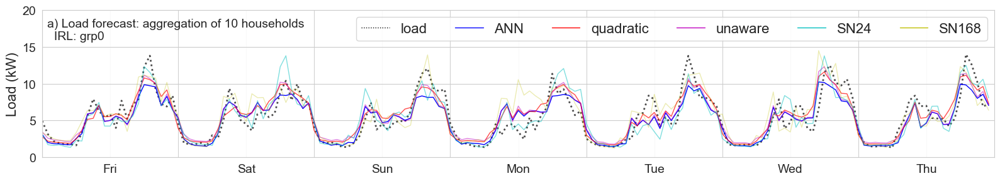

In [739]:
N='10'
category = 'Cat0'
nBins=4
nGrpsToPlot=1
yLim=[0,20]

load,uIDsList,randGrpIDs,models=getForecastByGrp(N,nBins,nGrpsToPlot,category,mlrTest_dictIRL,annTrainPredict_dictIRL,\
                                                    errorsAggIRLallModelsWide,grpAggLoad_N_dictIRL)
print("GrpID: ",randGrpIDs)
figTitle='a) Load forecast: aggregation of '+str(N)+' households \n  IRL: ' +str(randGrpIDs[0])  #+':'+str(uIDsList)
figSave = '../MScProjectCoding/project_data/figuresLCL/forecastAgg'+str(N)+'Grp'+str(randGrpIDs[0])
fig1,ax1 = plot_forecast(1,windows,start,load,models,yLim=yLim,figTitle=None,\
                         figSave=figSave,myStyles=myStyles,subPlotSize=[16,3]) #'xLabel',
fig1.text(0.05, 0.82,figTitle,fontsize=14, ha='left',va='center')

Bins: [0.21163112 0.23918545 0.26906871 0.30451984 0.37644557]
GrpID:  ['grp53']
relative index : window to plot: [[0, 168]]
Index range to plot : plotStart 1008, plotEnd 1176; days 42.0 to 49.0; weeks 6.0 to 7.0
found startTick 1008 on day 42.0


Text(0.05, 0.82, 'a) Load forecast: aggregation of 10 households \n  IRL: grp53')

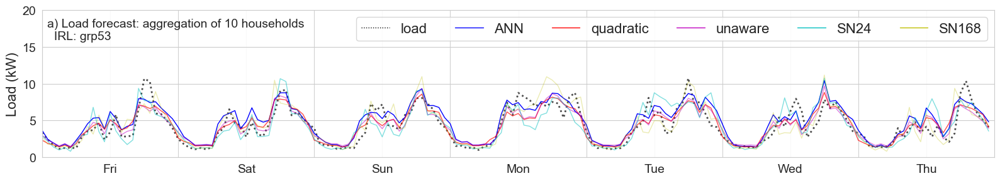

In [740]:
category = 'Cat3'
load,uIDsList,randGrpIDs,models=getForecastByGrp(N,nBins,nGrpsToPlot,category,mlrTest_dictIRL,annTrainPredict_dictIRL,\
                                                    errorsAggIRLallModelsWide,grpAggLoad_N_dictIRL)
print("GrpID: ",randGrpIDs)
figTitle='a) Load forecast: aggregation of '+str(N)+' households \n  IRL: ' +str(randGrpIDs[0])  #+':'+str(uIDsList)
figSave = '../MScProjectCoding/project_data/figuresLCL/forecastAgg'+str(N)+'Grp'+str(randGrpIDs[0])
fig1,ax1 = plot_forecast(1,windows,start,load,models,yLim=yLim,figTitle=None,\
                         figSave=figSave,myStyles=myStyles,subPlotSize=[16,3]) #'xLabel',
fig1.text(0.05, 0.82,figTitle,fontsize=14, ha='left',va='center')

# look at user daily usage again

In [741]:
print(hourly_df.shape)
hourly_df.sum(axis=0)

(711, 8760)


2013-01-01 00:00:00    458.542
2013-01-01 01:00:00    379.255
2013-01-01 02:00:00    295.068
2013-01-01 03:00:00    252.970
2013-01-01 04:00:00    230.669
                        ...   
2013-12-31 19:00:00    637.441
2013-12-31 20:00:00    583.995
2013-12-31 21:00:00    517.485
2013-12-31 22:00:00    479.429
2013-12-31 23:00:00    427.385
Length: 8760, dtype: float64

In [742]:
#half hourly data if want to use:
halfHourly_df = pd.read_pickle('../project_data/intermediateDataLCL/LCL_df_loadData_30min.pkl')
#halfHourly_df

In [743]:
# add hour column to aggLoad df
aggLoad_df = pd.DataFrame(aggLoad,columns=['aggLoad'])
aggLoad_df['hour'] = aggLoad_df.index.hour
aggLoad_df

,aggLoad,hour
2013-01-01 00:00:00,458.542,0
2013-01-01 01:00:00,379.255,1
2013-01-01 02:00:00,295.068,2
2013-01-01 03:00:00,252.970,3
2013-01-01 04:00:00,230.669,4
...,...,...
2013-12-31 19:00:00,637.441,19
2013-12-31 20:00:00,583.995,20
2013-12-31 21:00:00,517.485,21
2013-12-31 22:00:00,479.429,22


In [744]:
# get hour of day list
hrOrder = aggLoad_df.hour.unique()
hrOrder

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23], dtype=int64)

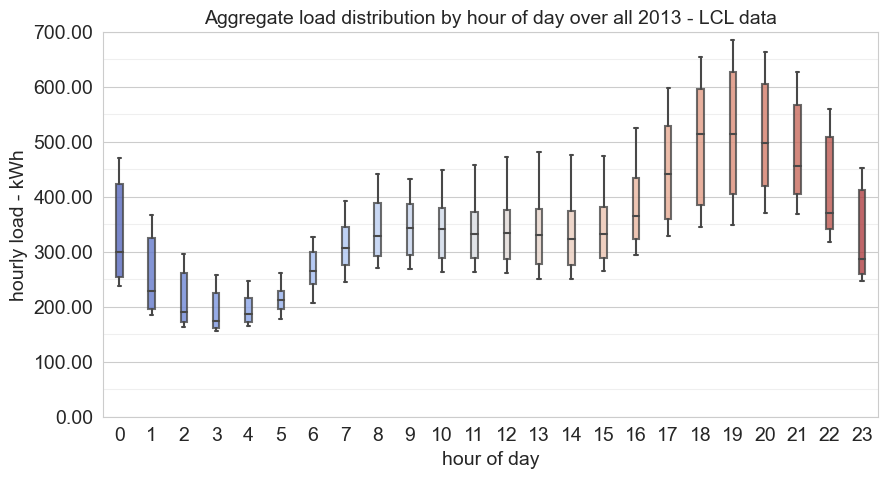

In [745]:
# Plot distribution of aggregate load by hour of day iover full year (LCL)
figTitle = 'Aggregate load distribution by hour of day over all 2013 - LCL data'
boxplotLoad(aggLoad_df,hrOrder,figTitle=figTitle,xVar='hour',yVar='aggLoad',yLim=[0,700],yGridInterval=100)

 look at individual users :   
 Add hour of day column to transpose of hourly_df (wide form ) and convert to narrow form for seaborn boxplot

In [746]:
# form 'wideform' df with hour of day column 
df_hourlyWideForm= hourly_df.T
df_hourlyWideForm['hour']=df_hourlyWideForm.index.hour
print(df_hourlyWideForm.head(2))
#print(df_hourlyWideForm.tail(1))
# form narrow-form df for seaborn boxplot
df_hourlyNarrowForm = pd.melt(df_hourlyWideForm, id_vars=['hour'], var_name='userID', value_name='loadValues')
df_hourlyNarrowForm

user_id                  2     10     18     19     27     40     49     57  \
2013-01-01 00:00:00  0.460  0.962  0.378  0.282  0.458  1.139  1.109  0.651   
2013-01-01 01:00:00  0.426  1.121  0.277  0.185  0.594  0.867  0.723  0.390   

user_id                 60     91     99    100    102    111    116    117  \
2013-01-01 00:00:00  0.433  0.384  0.096  0.178  0.283  0.143  2.822  0.323   
2013-01-01 01:00:00  0.287  0.180  0.161  0.188  0.288  0.132  1.760  0.148   

user_id                123    131    140    145    152    162    179    181  \
2013-01-01 00:00:00  0.204  0.230  0.330  0.478  1.188  0.081  0.180  0.299   
2013-01-01 01:00:00  0.203  0.388  0.255  0.463  1.204  0.100  0.132  0.319   

user_id                228    248    255    260    267    270    277    280  \
2013-01-01 00:00:00  0.151  0.647  0.360  0.508  1.465  0.828  0.767  0.549   
2013-01-01 01:00:00  0.146  0.567  0.316  0.323  0.448  2.211  0.585  0.421   

user_id                281    295    301    306 

,hour,userID,loadValues
0,0,2,0.460
1,1,2,0.426
2,2,2,0.411
3,3,2,0.395
4,4,2,0.221
...,...,...,...
6228355,19,5540,0.088
6228356,20,5540,0.098
6228357,21,5540,0.098
6228358,22,5540,0.097


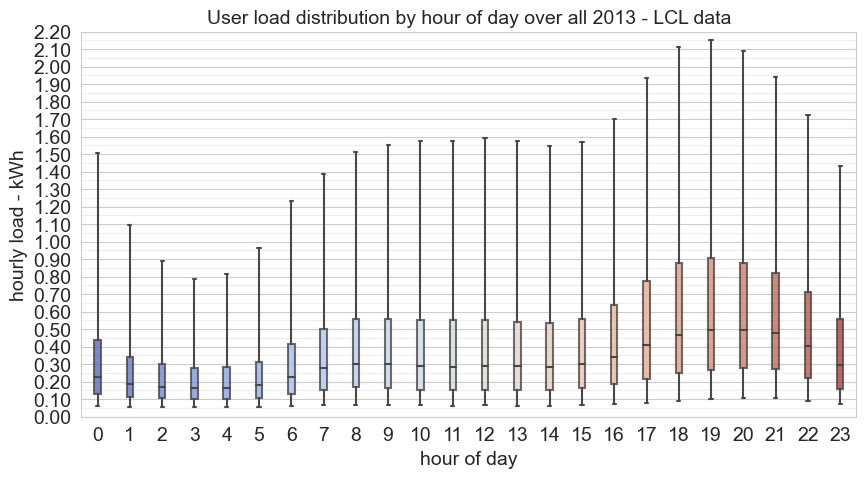

In [747]:
# Plot distribution of individual user load by hour of day over full year (LCL)
figTitle = 'User load distribution by hour of day over all 2013 - LCL data'
boxplotLoad(df_hourlyNarrowForm,hrOrder,figTitle=figTitle,xVar='hour',yVar='loadValues',yLim=[0,2.2],yGridInterval=0.1)

In [748]:
# Random uID list for which to plot stats
uID=[2,19,60]

In [770]:
# extract data from WIDEform df for these users:
load_df = pd.DataFrame(df_hourlyWideForm[uID]) 
load_df['hour'] = load_df.index.hour
load_df

,4411,hour
2013-01-01 00:00:00,2.486,0
2013-01-01 01:00:00,2.066,1
2013-01-01 02:00:00,2.139,2
2013-01-01 03:00:00,1.706,3
2013-01-01 04:00:00,1.675,4
...,...,...
2013-12-31 19:00:00,2.797,19
2013-12-31 20:00:00,1.852,20
2013-12-31 21:00:00,1.918,21
2013-12-31 22:00:00,1.865,22


In [771]:
# alternatively if want to extract data from NARROWform df for these users:
load_df = df_hourlyNarrowForm.loc[df_hourlyNarrowForm['userID'].isin(uID)]
load_df

TypeError: only list-like objects are allowed to be passed to isin(), you passed a [int64]

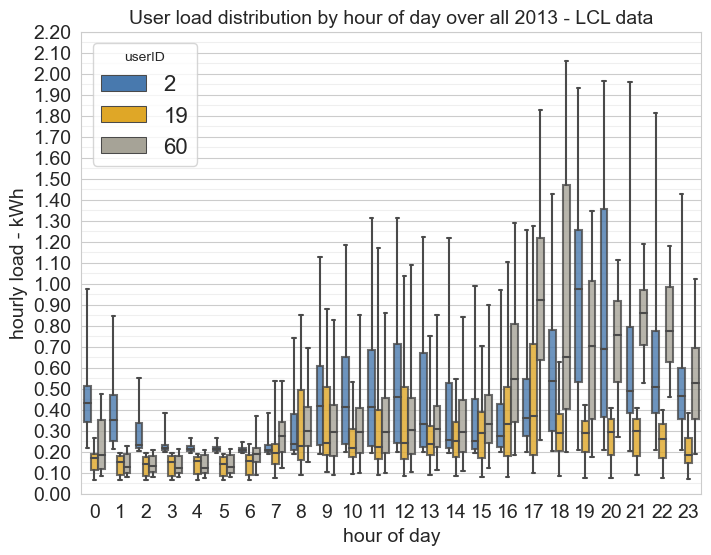

In [751]:
# Plot distribution of individual user load by hour of day over full year (LCL) - random set of users
figTitle = 'User load distribution by hour of day over all 2013 - LCL data'
colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
boxplotLoad(load_df,hrOrder,figTitle=figTitle,xVar='hour',yVar='loadValues',hue='userID',yLim=[0,2.2]\
            ,yGridInterval=0.1,width=0.8,palette=sns.xkcd_palette(colors),figSize=[8,6])

In [752]:
# comput mean, stdev, sum of hourly load values bu user and hour of day e.g. std dev of 365 * 1 hourly values for user X
df = df_hourlyNarrowForm.groupby(['hour','userID'],as_index=False).agg([np.mean,np.std,np.sum])   
df = df.reset_index(level=['hour','userID'])
df.columns = ['_'.join(col) for col in df.columns]
df
#df.drop(['loadValues_mean','loadValues_sum'], axis=1)

,hour_,userID_,loadValues_mean,loadValues_std,loadValues_sum
0,0,2,0.519362,0.378052,189.567
1,0,10,0.605348,0.291899,220.952
2,0,18,0.521334,0.295612,190.287
3,0,19,0.161359,0.068559,58.896
4,0,27,0.365266,0.114610,133.322
...,...,...,...,...,...
17059,23,5526,0.357249,0.080944,130.396
17060,23,5527,0.209268,0.166679,76.383
17061,23,5530,0.314066,0.218079,114.634
17062,23,5539,0.738866,0.464211,269.686


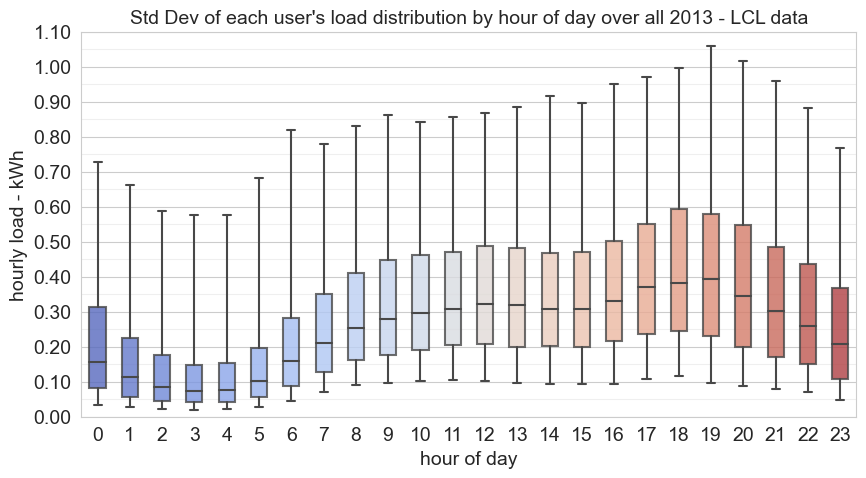

In [753]:
# Plot STD DEV of individual user load by hour of day over full year (LCL) i.e.
#  for each user: std dev of  365 * 00:00 reading, 365 * 01:00 load, 365 * 02:00 load, etc
figTitle = 'Std Dev of each user\'s load distribution by hour of day over all 2013 - LCL data'
boxplotLoad(df,hrOrder,figTitle=figTitle,xVar='hour_',yVar='loadValues_std',yLim=[0,1.1]\
            ,yGridInterval=0.1,width=0.5)

In [754]:
# comput mean of std dev values for each user - assume that user behaviour is consistent across year
df1=df.groupby(['userID_'],as_index=False)['loadValues_std'].mean().sort_values(by='loadValues_std') #, ascending=False,

In [755]:
# function to classify by column value into 3 groups - split on 0.2kWh, 0.5kWh levels 
def classifyByVal(x,splits=[0.2,0.5]):
    if x <splits[0]:
        return "Low"
    if x <splits[1]:
        return "Medium"
    return "High"

In [756]:
# count number of users in each class
df1['stdDevClass'] = df1['loadValues_std'].apply(lambda x: classifyByVal(x))
print(df1.groupby(['stdDevClass']).count())
df1

             userID_  loadValues_std
stdDevClass                         
High             113             113
Low              234             234
Medium           364             364


,userID_,loadValues_std,stdDevClass
419,3462,0.040504,Low
127,1088,0.047689,Low
328,2822,0.050492,Low
132,1135,0.051092,Low
130,1128,0.057245,Low
...,...,...,...
36,307,1.266029,High
524,4179,1.270197,High
494,4016,1.334336,High
540,4319,1.544255,High


In [757]:
#merge dfs so can plot box plot by stdDevClass 
dfStdDevClassified = pd.merge(df,df1,how='outer',on=['userID_','userID_'])
dfStdDevClassified

,hour_,userID_,loadValues_mean,loadValues_std_x,loadValues_sum,loadValues_std_y,stdDevClass
0,0,2,0.519362,0.378052,189.567,0.338417,Medium
1,1,2,0.412658,0.270213,150.620,0.338417,Medium
2,2,2,0.300411,0.141155,109.650,0.338417,Medium
3,3,2,0.242011,0.070309,88.334,0.338417,Medium
4,4,2,0.223022,0.043291,81.403,0.338417,Medium
...,...,...,...,...,...,...,...
17059,19,5540,0.211036,0.130644,77.028,0.166837,Low
17060,20,5540,0.219537,0.104037,80.131,0.166837,Low
17061,21,5540,0.246438,0.168495,89.950,0.166837,Low
17062,22,5540,0.207501,0.101863,75.738,0.166837,Low


In [758]:
# sense check against count stats above
len(dfStdDevClassified[dfStdDevClassified['stdDevClass']=='Low']['userID_'].unique())

234

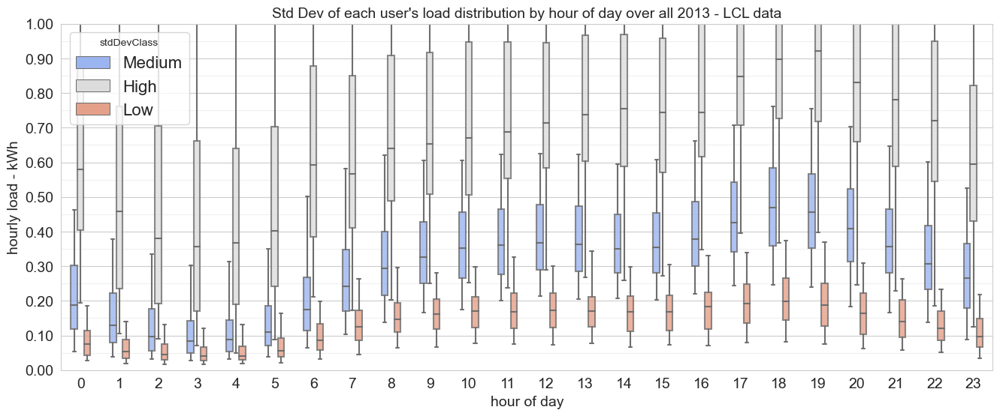

In [759]:
# Plot STD DEV of individual user load by hour of day over full year (LCL) i.e. USING STDEV CLASS AS HUE FLAG
#  for each user: std dev of  365 * 00:00 reading, 365 * 01:00 load, 365 * 02:00 load, etc
figTitle = 'Std Dev of each user\'s load distribution by hour of day over all 2013 - LCL data'

boxplotLoad(dfStdDevClassified,hrOrder,figTitle=figTitle,xVar='hour_',yVar='loadValues_std_x',hue='stdDevClass',\
           hue_order= ['Low','Medium','High'],width=0.5,figSize=(16,6))


In [760]:
# extract uIDs for each class
uIDs_lowDev = dfStdDevClassified.loc[dfStdDevClassified['stdDevClass']=='Low']['userID_'].unique()
uIDs_mediumDev = dfStdDevClassified.loc[dfStdDevClassified['stdDevClass']=='Medium']['userID_'].unique()
uIDs_highDev = dfStdDevClassified.loc[dfStdDevClassified['stdDevClass']=='High']['userID_'].unique()

for uIDs in [uIDs_lowDev,uIDs_mediumDev,uIDs_highDev]:
    print("Number of users : {0}".format(len(uIDs) ))

Number of users : 234
Number of users : 364
Number of users : 113


index data:2013-02-12 00:00:00 hr:0,startTick:1008,Window:[1008, 1176],Length(hrs) 168.0


(<Figure size 1200x400 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x28faccf62e8>])

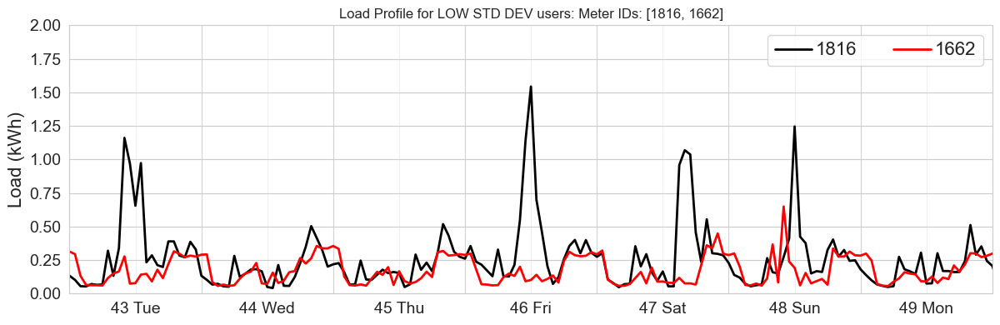

In [761]:
# plot load profiles for sample users from each class
startDay=42
smplsPerDay=24
startIndexToPlot=(startDay*smplsPerDay)
nDays=7
nUsersToPlot=2

uIDs = uIDs_lowDev

# get random users from LOW std deviation class   
randIDs = []
for j in range(nUsersToPlot):
    uID = hourly_df.loc[uIDs].index.values[np.random.randint(len(uIDs))]     # select ranbdom set from the  user IDs
    randIDs.append(uID)

load_df = hourly_df.loc[randIDs].T  # need this formt for plotting
labelTitle = 'Load Profile for LOW STD DEV users: Meter IDs: '+str(randIDs)
plotSectionOfLoadProf(load_df,startIndexToPlot,nDays,labelTitle,smplsPerDay,yLim=[0,2])

index data:2013-02-12 00:00:00 hr:0,startTick:1008,Window:[1008, 1176],Length(hrs) 168.0


(<Figure size 1200x400 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x28fa8a37978>])

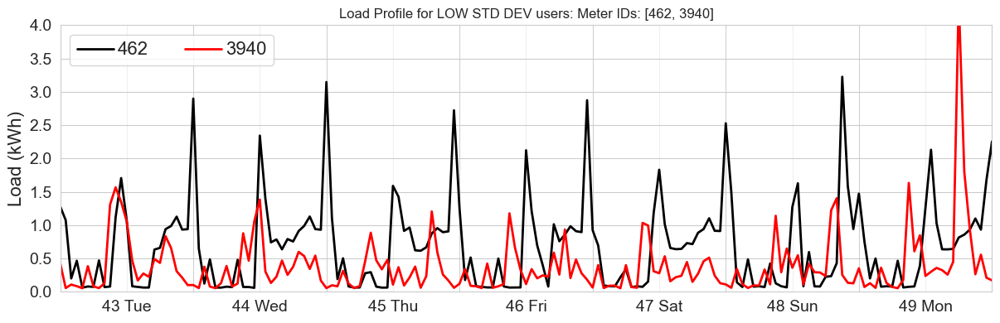

In [762]:
# plot load profiles for sample users from each class
startDay=42
smplsPerDay=24
startIndexToPlot=(startDay*smplsPerDay)
nDays=7
nUsersToPlot=2

uIDs = uIDs_mediumDev

# get random users from LOW std deviation class   
randIDs = []
for j in range(nUsersToPlot):
    uID = hourly_df.loc[uIDs].index.values[np.random.randint(len(uIDs))]     # select ranbdom set from the  user IDs
    randIDs.append(uID)

load_df = hourly_df.loc[randIDs].T  # need this formt for plotting
labelTitle = 'Load Profile for LOW STD DEV users: Meter IDs: '+str(randIDs)
plotSectionOfLoadProf(load_df,startIndexToPlot,nDays,labelTitle,smplsPerDay,yLim=[0,4])

index data:2013-02-12 00:00:00 hr:0,startTick:1008,Window:[1008, 1176],Length(hrs) 168.0


(<Figure size 1200x400 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x28fa9ee12b0>])

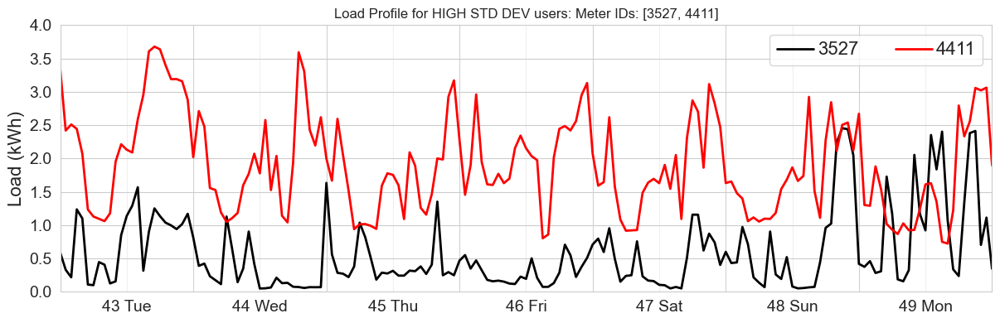

In [763]:
# plot load profiles for sample users from each class
uIDs = uIDs_highDev

# get random users from HIGH std deviation class   
randIDs = []
for j in range(nUsersToPlot):
    uID = hourly_df.loc[uIDs].index.values[np.random.randint(len(uIDs))]     # select ranbdom set from the  user IDs
    randIDs.append(uID)

load_df = hourly_df.loc[randIDs].T  # need this formt for plotting
labelTitle = 'Load Profile for HIGH STD DEV users: Meter IDs: '+str(randIDs)
plotSectionOfLoadProf(load_df,startIndexToPlot,nDays,labelTitle,smplsPerDay,yLim=[0,4])

In [769]:
grpLoadLCL_df

,grpAggLoad_Wh,ANN_MLP,quadratic,unAware,SN24test,SN168test,N
grp0,791.626826,1.285552,1.402695,1.596610,1.331808,1.603353,1
grp1,211.163584,1.481329,1.294302,1.445968,1.279943,1.233088,1
grp2,346.381963,0.783423,0.930937,1.003333,0.960252,0.889885,1
grp3,254.051370,0.773435,0.502715,0.589300,0.586473,0.584826,1
grp4,339.544635,0.223133,0.226055,0.236964,0.250504,0.253227,1
...,...,...,...,...,...,...,...
grp3,50279.030479,0.071373,0.069897,0.070803,0.079382,0.092292,100
grp4,51404.870890,0.076922,0.072749,0.075980,0.088312,0.098841,100
grp5,50913.208331,0.085387,0.083561,0.084623,0.104595,0.106371,100
grp6,44210.059359,0.075719,0.072666,0.076581,0.086262,0.098487,100


In [645]:
myStyles['lineColors']=['k', 'b', 'r', 'm', 'c','y']
myStyles['lineStyles']=['dotted','solid', 'solid', 'solid', 'solid','solid']
myStyles

{'lineStyles': ['dotted', 'solid', 'solid', 'solid', 'solid', 'solid'],
 'lineColors': ['k', 'b', 'r', 'm', 'c', 'y']}

In [646]:
#matplotlib.rc('lines', linewidth=2, color='r')
# set fontsizes etc for plotting 
plt.rcParams["axes.labelsize"] = 16
plt.rc('legend',fontsize=16) # using a size in points
matplotlib.rc('xtick', labelsize=14) 
matplotlib.rc('ytick', labelsize=14) 

#print(plt.rcParams)

In [767]:
# plot load profiles for sample users from each class

startDay=42
smplsPerDay=24
startIndexToPlot=(startDay*smplsPerDay)
nDays=7
nUsersToPlot=1
uIDs = uIDs1

# get random users from HIGH std deviation class   
randIDs = []
for j in range(nUsersToPlot):
    uID = hourly_df.loc[uIDs].index.values[np.random.randint(len(uIDs))]     # select ranbdom set from the  user IDs
    randIDs.append(uID)

load_df = hourly_df.loc[randIDs].T  # need this formt for plotting
labelTitle = 'Load Profile for PREDICTABLE users: Meter IDs: '+str(randIDs)
plotSectionOfLoadProf(load_df,startIndexToPlot,nDays,labelTitle,smplsPerDay,yLim=[0,3],myStyles=myStyles)

NameError: name 'uIDs1' is not defined

index data:2013-02-12 00:00:00 hr:0,startTick:1008,Window:[1008, 1176],Length(hrs) 168.0


(<Figure size 1152x216 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x27e158e26d8>])

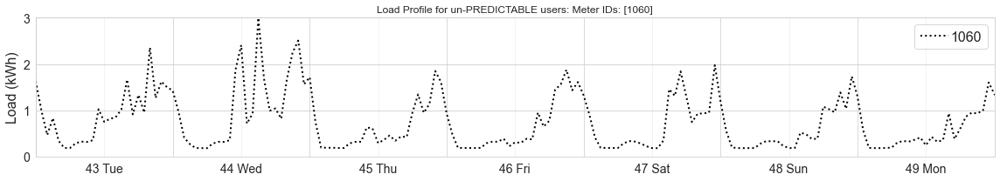

In [684]:
# plot load profiles for sample users from each class
uIDs = uIDs2

# get random users from HIGH std deviation class   
randIDs = []
for j in range(nUsersToPlot):
    uID = hourly_df.loc[uIDs].index.values[np.random.randint(len(uIDs))]     # select ranbdom set from the  user IDs
    randIDs.append(uID)

load_df = hourly_df.loc[randIDs].T  # need this formt for plotting
labelTitle = 'Load Profile for un-PREDICTABLE users: Meter IDs: '+str(randIDs)
plotSectionOfLoadProf(load_df,startIndexToPlot,nDays,labelTitle,smplsPerDay,yLim=[0,3],myStyles=myStyles,subPlotSize=[16,3])

#### Now get plot for report

In [13]:
uIDsToPlot=[[784,5402],[1656]]

In [14]:
uIDsToPlot = [val for sublist in uIDsToPlot for val in sublist] 
uIDsToPlot

[784, 5402, 1656]

In [15]:
# plot load profiles for sample users from each class
uIDs = uIDsToPlot

load_df = hourly_df.loc[uIDsToPlot].T  # need this formt for plotting
labelTitle = '' #Load Profiles: Sample Meter IDs: '+str(randIDs)
fig1,ax1=plotSectionOfLoadProf(load_df,startIndexToPlot,nDays,labelTitle,smplsPerDay,yLim=[0,4],myStyles=myStyles,subPlotSize=[16,3])

NameError: name 'startIndexToPlot' is not defined

In [704]:
load,uIDsList=getLoadByGrp('50',errorsAggLCLallModels,grpAggLoad_N_dictLCL)
load_df_agg50=pd.DataFrame(load.mean(axis=1),columns=['agg50'])
load_df_agg50

,agg50
2013-01-01 00:00:00,32.445500
2013-01-01 01:00:00,26.737643
2013-01-01 02:00:00,20.828286
2013-01-01 03:00:00,17.872214
2013-01-01 04:00:00,16.271286
...,...
2013-12-31 19:00:00,44.989357
2013-12-31 20:00:00,41.188500
2013-12-31 21:00:00,36.515000
2013-12-31 22:00:00,33.884357


index data:2013-02-12 00:00:00 hr:0,startTick:1008,Window:[1008, 1176],Length(hrs) 168.0


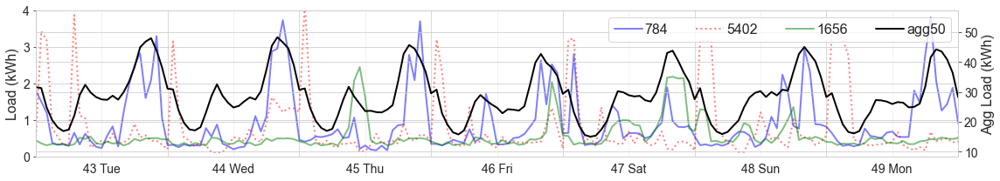

In [737]:
myStyles['lineColors']=['b', 'r', 'g', 'c','y']  #'k',
#myStyles['lineStyles']=['dotted','dotted', 'dotted', 'solid', 'solid','solid']
myStyles['lineStyles']=['solid','dotted','solid', 'solid', 'solid','solid']
myStyles['alpha']=[0.5,0.5,0.5,0.5]

myStyles

fig1,ax1 = plotSectionOfLoadProf(load_df,startIndexToPlot,nDays,labelTitle,smplsPerDay,yLim=[0,4],myStyles=myStyles,subPlotSize=[16,3],\
                      load_df2=load_df_agg50)

### redo autocorrelation plots for report 

In [731]:
# well behaved user examples:
# hard to predict user examples:
aggLoad

2013-01-01 00:00:00    458.542
2013-01-01 01:00:00    379.255
2013-01-01 02:00:00    295.068
2013-01-01 03:00:00    252.970
2013-01-01 04:00:00    230.669
                        ...   
2013-12-31 19:00:00    637.441
2013-12-31 20:00:00    583.995
2013-12-31 21:00:00    517.485
2013-12-31 22:00:00    479.429
2013-12-31 23:00:00    427.385
Length: 8760, dtype: float64

In [692]:
myStyles['lineColors']=['k', 'b', 'r', 'g', 'c','y']
myStyles['lineStyles']=['dotted','solid', 'solid', 'solid', 'solid','solid']
myStyles

{'lineStyles': ['dotted', 'solid', 'solid', 'solid', 'solid', 'solid'],
 'lineColors': ['k', 'b', 'r', 'g', 'c', 'y']}

uID:  784
uID:  5402
uID:  1656


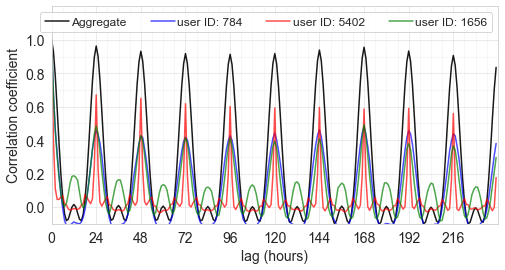

In [761]:
# look at repeat periods using autocorrelation of full year load data
myStyles['lineColors']=['k','b', 'r', 'g', 'c','y']  #'k',
myStyles['lineStyles']=['solid','solid','solid','solid', 'solid', 'solid']

nD = 10   # 10 days - LAG MAX
colors = myStyles['lineColors']
lineStyles = myStyles['lineStyles']
fig = plt.figure(figsize=(8,4))
ax1 = fig.add_subplot(111)
proxys = []
for i in range(4):                                       
    # now lets look at autocorrelation of the load
    if i==0:                                                        # looking at user aggregated load
        loadNorm = aggLoad-aggLoad.mean()               # compute residual aggregate load  before autocorrelation
    else:                  
        uID = uIDsToPlot[i-1]                                      # looking at individual user load for ~ 3 users
        print("uID: ",uID)
        loadNorm = hourly_df.loc[uID]-hourly_df.loc[uID].mean()        # compute residual user load  before autocorrelation
    lagNWeeks = np.zeros((24*nD))               # 24 * 10 = 240 length array
    #print(lagNWeeks)
    for j in range(len(lagNWeeks)):                 # loop through 240 1hr steps (i.e. 0 to 10 days lag)
        lagNWeeks[j] = loadNorm.autocorr(lag=j)     # autocorrelation using step of 1hr
    
    if i==0:
        l, = ax1.plot(np.arange(24*nD),lagNWeeks,color=colors[i],alpha=0.9,linestyle=lineStyles[i])
    else:
        l, = ax1.plot(np.arange(24*nD),lagNWeeks,color=colors[i],alpha=0.7,linestyle=lineStyles[i])
    proxys.append(l)
ax1.set_xlabel('lag (hours)', fontsize=14)
ax1.set_ylabel('Correlation coefficient', fontsize=14)
ax1.set_xlim([0,24*nD])
ax1.set_xticks(np.arange(0,24*nD,24));
ax1.set_yticks(np.arange(0,1.01,0.2))
ax1.set_yticks(np.arange(0,1,0.1),minor=True)
ax1.set_xticks(np.arange(0,24*nD,6),minor=True);
ax1.set_ylim([-0.1,1.2])
#ax1.grid()


# Customize the major grid
ax1.grid(which='major', alpha=0.5)
# Customize the minor grid
ax1.grid(which='minor',alpha=0.2)


legLabs = []
legLabs.append('Aggregate')
for i in range(3):
    legLabs.append('user ID: %d'%uIDsToPlot[i])
    #legLabs.append('example house %d'%(i+1))
plt.legend(proxys, legLabs,\
           ncol=len(uIDsToPlot)+1, fontsize=12, handletextpad=0.2)
ax1.tick_params(axis='both', labelsize=14)


#### additional profile plots

In [738]:
uIDs_highR2 = [312,5009,5041]

index data:2013-02-12 00:00:00 hr:0,startTick:1008,Window:[1008, 1176],Length(hrs) 168.0


(<Figure size 1152x216 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x27e15248a90>])

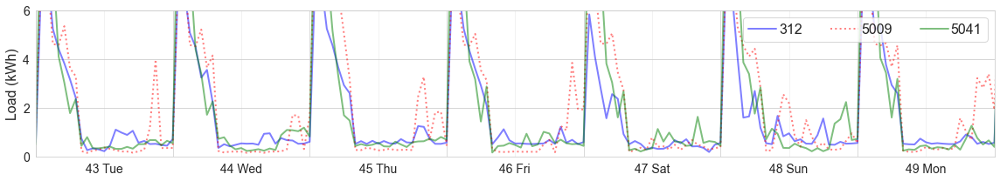

In [740]:
# plot load profiles for sample users from each class
uIDs = uIDs_highR2

load_df = hourly_df.loc[uIDs].T  # need this formt for plotting
labelTitle = '' #Load Profiles: Sample Meter IDs: '+str(randIDs)
plotSectionOfLoadProf(load_df,startIndexToPlot,nDays,labelTitle,smplsPerDay,yLim=[0,6],myStyles=myStyles,subPlotSize=[16,3])